# Consignes Projet 4

**Anticipez les besoins en consommation électrique de bâtiments**
* Lien vers consignes : https://openclassrooms.com/fr/projects/629/assignment
* Lien vers score Star Energy : https://www.energystar.gov/buildings/facility-owners-and-managers/existing-buildings/use-portfolio-manager/interpret-your-results/what

* Lien vers la signification des colonnes (trouvé via recherche web) : https://data.seattle.gov/dataset/2016-Building-Energy-Benchmarking/2bpz-gwpy

In [4]:
!pip install missingno
!pip install mlxtend
!pip install ppscore
!pip install category_encoders
!pip install folium
# !pip install 'polars[numpy,pandas]'
!pip install polars

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
     --------------------------------------- 18.9/18.9 MB 43.7 MB/s eta 0:00:00


# Imports

In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import os
import polars as pl
import re

from sklearn.decomposition import PCA
from mlxtend.plotting import plot_pca_correlation_graph
from scipy.spatial import KDTree
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_colwidth', -1)

In [40]:
def file_required(file_name):
    print(os.getcwd())
    if os.path.exists(os.getcwd()+"/"+file_name):
        print("OK, loading "+file_name+"\
                           from the current working directory ...")
    else:
        print("Please, put "+file_name+"\
                           in the current working directory")

In [41]:
file_required('/P4_functions.py')
from P4_functions import *

C:\Users\Zbook\OpenClassRoom\Projet\Projet_4
OK, loading /P4_functions.py                           from the current working directory ...


In [42]:
# Définition d'une fonction pour tracer une heatmap
# paramètres :
# corr : matrice de corrélation
# title : titre du graphe
# figsize : taille de la figure
# vmin : valeur minimale de la colormap
# vmax : valeur maximale de la colormap
# center : valeur centrale de la colormap
# palette : palette de couleurs
# shape : forme de la heatmap (rectangle ou triangle)
# fmt : format des nombres affichés
# robust : booléen pour utiliser une méthode de calcul robuste ou non
def plot_heatmap(corr, title, figsize=(8,4), vmin=-1, vmax=1, center=0,
                 palette = sns.color_palette("coolwarm", 20), shape='rect',
                 fmt='.2f', robust=False):
    
    # Création d'une figure et d'un axe
    fig, ax = plt.subplots(figsize=figsize)
    
    # Définition du masque pour la forme de la heatmap
    if shape == 'rect':
        mask=None
    elif shape == 'tri':
        mask = np.zeros_like(corr, dtype=bool)
        mask[np.triu_indices_from(mask)] = True
    else:
        print('ERROR : this type of heatmap does not exist')

    # Définition de la palette de couleurs
    palette = palette
    
    # Tracé de la heatmap
    ax = sns.heatmap(corr, mask=mask, cmap=palette, vmin=vmin, vmax=vmax,
                     center=center, annot=True, annot_kws={"size": 10},fmt=fmt,
                     square=False, linewidths=.5, linecolor = 'white',
                     cbar_kws={"shrink": .9, 'label': None}, robust = robust,
                     xticklabels= corr.columns, yticklabels = corr.index)
    
    # Configuration des axes et de la légende
    ax.tick_params(labelsize=8,top=False, bottom=True,
                labeltop=False, labelbottom=True)
    ax.collections[0].colorbar.ax.tick_params(labelsize=8)
    plt.setp(ax.get_xticklabels(), rotation=25, ha="right",rotation_mode="anchor")
    ax.set_title(title, fontweight='bold', fontsize=14)
    
    # Retourne le masque (inutilisé dans ce code)
    # return mask


In [43]:
# Plotting histograms of specified quantitative continuous columns of a dataframe and mean, median and mode values.

import scipy.stats as st

def plot_histograms(df, cols, file_name=None, bins=30, figsize=(12,7), skip_outliers=True, thresh=3, layout=(3,3), save_enabled=False):

    fig = plt.figure(figsize=figsize)

    for i, c in enumerate(cols,1):
        ax = fig.add_subplot(*layout,i)
        if skip_outliers:
            ser = df[c][np.abs(st.zscore(df[c]))<thresh]
        else:
            ser = df[c]
        ax.hist(ser,  bins=bins, color='grey')
        ax.set_title(c)
        ax.vlines(df[c].mean(), *ax.get_ylim(),  color='red', ls='-', lw=1.5)
        ax.vlines(df[c].median(), *ax.get_ylim(), color='green', ls='-.', lw=1.5)
        ax.vlines(df[c].mode()[0], *ax.get_ylim(), color='goldenrod', ls='--', lw=1.5)
        ax.legend(['mean', 'median', 'mode'])
        ax.title.set_fontweight('bold')
        # xmin, xmax = ax.get_xlim()
        # ax.set(xlim=(0, xmax/5))
        
    plt.tight_layout(w_pad=0.5, h_pad=0.65)

    if save_enabled: plt.savefig(os.getcwd()+'/FIG/'+file_name, dpi=400);
    plt.show()

In [44]:
def optimize_dataframe(df):
    new_dtypes = {}

    # object -> category (if nb unique < half total nb of rows and not XXX_100g)
    for col in df.columns.values:
        if df[col].dtype == 'object' :
            if len(df[col].unique()) / len(df[col]) < 0.5:
                new_dtypes[col] = 'category'
            else:
                new_dtypes[col] = 'object'

    # float64 -> float32
    for col in df.columns.values:
        if df[col].dtype == 'float64':
#             if df[col].notna().sum()!=0: # 1% sample columns happening to be all null 
          new_dtypes[col] = 'float32'

    # int64 -> int8
    for col in df.columns.values:
        if df[col].dtype == 'int64':
            new_dtypes[col] = 'int8'

    optimized_df = df.astype(new_dtypes)
    return optimized_df, new_dtypes


In [45]:
def compare_cols(col_list, df):
    # Initialisation des listes de colonnes présentes et absentes
    present_cols = []
    absent_cols = []
    
    # Boucle pour vérifier chaque nom de colonne dans la liste
    for col in col_list:
        # Vérification si la colonne existe dans le dataframe
        if col in df.columns:
            present_cols.append(col)
        else:
            absent_cols.append(col)
    
    # Retourne les deux listes de colonnes
    return present_cols, absent_cols


In [46]:
def retourne_taille_jeux(data, data_cleaned):
    # créer un dataframe avec les dimensions des jeux de données
    taille_jeux = pd.DataFrame({
        'Nom': ['données initiales', 'données nettoyées'],
        'Dimensions': [data.shape, data_cleaned.shape],
        'Proportion de NaN (en %)': [
            data.isna().sum().sum() / (data.shape[0] * data.shape[1]) * 100,
            data_cleaned.isna().sum().sum() / (data_cleaned.shape[0] * data_cleaned.shape[1]) * 100
        ]
    })
    return taille_jeux


## Data

In [47]:
data_2016 = pd.read_csv('data/2016_Building_Energy_Benchmarking.csv')
data_2016.head(1)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.6122,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.5,189.0,7226362.5,7456910.0,2003882.0,1156514.25,3946027.0,12764.5293,1276453.0,False,NaN,Compliant,NaN,249.98,2.83


In [251]:
data.shape

(3376, 44)

In [48]:
data_2016.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

In [49]:
# optimiser le dataframe
df_optimized, new_dtypes = optimize_dataframe(data_2016)

# afficher les types de données du dataframe après l'optimisation
print(df_optimized.dtypes)

# afficher les nouvelles conversions de types
print(new_dtypes)
# Charger le fichier CSV
# data = pd.read_csv("data/2016_Building_Energy_Benchmarking.csv",dtype=new_dtypes,header=0, low_memory=False, encoding ='utf-8')
# data.info(memory_usage='deep')
df_optimized.info(memory_usage='deep')

OSEBuildingID                      int8    
DataYear                           int8    
BuildingType                       category
PrimaryPropertyType                category
PropertyName                       object  
Address                            object  
City                               category
State                              category
ZipCode                            float32 
TaxParcelIdentificationNumber      object  
CouncilDistrictCode                int8    
Neighborhood                       category
Latitude                           float32 
Longitude                          float32 
YearBuilt                          int8    
NumberofBuildings                  float32 
NumberofFloors                     int8    
PropertyGFATotal                   int8    
PropertyGFAParking                 int8    
PropertyGFABuilding(s)             int8    
ListOfAllPropertyUseTypes          category
LargestPropertyUseType             category
LargestPropertyUseTypeGFA       

In [50]:
data_2016 = df_optimized
data_2016.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   OSEBuildingID                    3376 non-null   int8    
 1   DataYear                         3376 non-null   int8    
 2   BuildingType                     3376 non-null   category
 3   PrimaryPropertyType              3376 non-null   category
 4   PropertyName                     3376 non-null   object  
 5   Address                          3376 non-null   object  
 6   City                             3376 non-null   category
 7   State                            3376 non-null   category
 8   ZipCode                          3360 non-null   float32 
 9   TaxParcelIdentificationNumber    3376 non-null   object  
 10  CouncilDistrictCode              3376 non-null   int8    
 11  Neighborhood                     3376 non-null   category
 12  Latitu

In [51]:
print(data_2016.shape)

(3376, 46)


In [52]:
# pd.DataFrame(data_2016['columns'].values.tolist()[1][0])
# Vérifier les clés du DataFrame
print(data_2016.keys())

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'Address', 'City', 'State', 'ZipCode',
       'TaxParcelIdentificationNumber', 'CouncilDistrictCode', 'Neighborhood',
       'Latitude', 'Longitude', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'DefaultData', 'Comments', 'ComplianceStatus',
       'Outlier

# Nettoyage et Tri des features

In [53]:
data_2016['Comments'].nunique()

0

In [54]:
data_2016.drop(['Comments'], axis=1, inplace=True)

#### GHGEmissionsIntensity

In [55]:
data_2016['GHGEmissionsIntensity'].describe()

count    3367.000000
mean     1.175907   
std      1.821451   
min     -0.020000   
25%      0.210000   
50%      0.610000   
75%      1.370000   
max      34.090000  
Name: GHGEmissionsIntensity, dtype: float64

In [56]:
data_2016['TotalGHGEmissions'].describe()

count    3367.000000 
mean     119.723839  
std      538.832458  
min     -0.800000    
25%      9.495000    
50%      33.919998   
75%      93.940002   
max      16870.980469
Name: TotalGHGEmissions, dtype: float64

In [57]:
data_2016['ENERGYSTARScore'].describe()

count    2533.000000
mean     67.918671  
std      26.873266  
min      1.000000   
25%      53.000000  
50%      75.000000  
75%      90.000000  
max      100.000000 
Name: ENERGYSTARScore, dtype: float64

### Vérifications des colonnes manquantes ou en trop

In [58]:
print('\ncolonnes présentes sur données 2016 : \n', set(data_2016.columns) )


colonnes présentes sur données 2016 : 
 {'CouncilDistrictCode', 'NaturalGas(kBtu)', 'Electricity(kBtu)', 'Electricity(kWh)', 'ENERGYSTARScore', 'SteamUse(kBtu)', 'YearsENERGYSTARCertified', 'SiteEnergyUse(kBtu)', 'PropertyGFATotal', 'NumberofBuildings', 'TotalGHGEmissions', 'ZipCode', 'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType', 'Longitude', 'NaturalGas(therms)', 'PropertyGFAParking', 'Address', 'Neighborhood', 'PrimaryPropertyType', 'SiteEnergyUseWN(kBtu)', 'SourceEUI(kBtu/sf)', 'Latitude', 'TaxParcelIdentificationNumber', 'SourceEUIWN(kBtu/sf)', 'BuildingType', 'GHGEmissionsIntensity', 'YearBuilt', 'City', 'DataYear', 'ThirdLargestPropertyUseTypeGFA', 'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes', 'DefaultData', 'LargestPropertyUseType', 'SiteEUI(kBtu/sf)', 'PropertyName', 'LargestPropertyUseTypeGFA', 'Outlier', 'OSEBuildingID', 'ComplianceStatus', 'SecondLargestPropertyUseType', 'NumberofFloors', 'SiteEUIWN(kBtu/sf)', 'State'}


### Vérification des types

In [59]:
pd.DataFrame([ data_2016.dtypes])

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,int8,int8,category,category,object,object,category,category,float32,object,int8,category,float32,float32,int8,float32,int8,int8,int8,int8,category,category,float32,category,float32,category,float32,category,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,bool,category,category,float32,float32


In [60]:
prop_cols = ['Neighborhood', 'ZipCode', 'CouncilDistrictCode',
             'BuildingType', 'PrimaryPropertyType',
             'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
             'PropertyGFAParking','PropertyGFABuilding(s)',
             'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
             'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
             'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
             'ENERGYSTARScore', 'Outlier']
for c in prop_cols+['SteamUse(kBtu)','Electricity(kBtu)','NaturalGas(therms)',
   'NaturalGas(kBtu)']+['YearBuilt']:
    n = data_2016[c].isna().sum()
    if n>0:
        print('o--',c, ': ',str(n)," valeur manquante (MISSING VALUES) !")
    else:
        print(c, "Aucunne valeur manquante (no missing values).")

Neighborhood Aucunne valeur manquante (no missing values).
o-- ZipCode :  16  valeur manquante (MISSING VALUES) !
CouncilDistrictCode Aucunne valeur manquante (no missing values).
BuildingType Aucunne valeur manquante (no missing values).
PrimaryPropertyType Aucunne valeur manquante (no missing values).
o-- NumberofBuildings :  8  valeur manquante (MISSING VALUES) !
NumberofFloors Aucunne valeur manquante (no missing values).
PropertyGFATotal Aucunne valeur manquante (no missing values).
PropertyGFAParking Aucunne valeur manquante (no missing values).
PropertyGFABuilding(s) Aucunne valeur manquante (no missing values).
o-- LargestPropertyUseType :  20  valeur manquante (MISSING VALUES) !
o-- LargestPropertyUseTypeGFA :  20  valeur manquante (MISSING VALUES) !
o-- SecondLargestPropertyUseType :  1697  valeur manquante (MISSING VALUES) !
o-- SecondLargestPropertyUseTypeGFA :  1697  valeur manquante (MISSING VALUES) !
o-- ThirdLargestPropertyUseType :  2780  valeur manquante (MISSING VALU

### Colonnes inutiles

In [61]:
data_2016[['ZipCode']].head()

,ZipCode
0,98101.0
1,98101.0
2,98101.0
3,98101.0
4,98121.0


In [62]:
data_2016.drop(['ZipCode'], axis=1, inplace=True)

## Types de colonnes

In [63]:
data_2016.dtypes

OSEBuildingID                      int8    
DataYear                           int8    
BuildingType                       category
PrimaryPropertyType                category
PropertyName                       object  
Address                            object  
City                               category
State                              category
TaxParcelIdentificationNumber      object  
CouncilDistrictCode                int8    
Neighborhood                       category
Latitude                           float32 
Longitude                          float32 
YearBuilt                          int8    
NumberofBuildings                  float32 
NumberofFloors                     int8    
PropertyGFATotal                   int8    
PropertyGFAParking                 int8    
PropertyGFABuilding(s)             int8    
ListOfAllPropertyUseTypes          category
LargestPropertyUseType             category
LargestPropertyUseTypeGFA          float32 
SecondLargestPropertyUseType    

### Observations

In [64]:
data = data_2016.copy()
data

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,-32,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,0659000030,7,DOWNTOWN,47.612202,-122.337990,-121,1.0,12,114,0,114,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7.226362e+06,7.456910e+06,2003882.00,1.156514e+06,3.946027e+06,12764.529297,1.276453e+06,False,Compliant,NaN,249.979996,2.83
1,2,-32,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,0659000220,7,DOWNTOWN,47.613171,-122.333931,-52,1.0,11,-114,-40,-74,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8.387933e+06,8.664479e+06,0.00,9.504252e+05,3.242851e+06,51450.816406,5.145082e+06,False,Compliant,NaN,295.859985,2.86
2,3,-32,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,0659000475,7,DOWNTOWN,47.613930,-122.338097,-79,1.0,41,-50,110,96,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,7.258702e+07,7.393711e+07,21566554.00,1.451544e+07,4.952666e+07,14938.000000,1.493800e+06,False,Compliant,NaN,2089.280029,2.19
3,5,-32,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,0659000640,7,DOWNTOWN,47.614120,-122.336639,-122,1.0,10,-120,0,-120,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6.794584e+06,6.946800e+06,2214446.25,8.115253e+05,2.768924e+06,18112.130859,1.811213e+06,False,Compliant,NaN,286.429993,4.67
4,8,-32,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,0659000970,7,DOWNTOWN,47.613750,-122.340469,-68,1.0,18,-36,48,-84,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,1.417261e+07,1.465650e+07,0.00,1.573449e+06,5.368607e+06,88039.984375,8.803998e+06,False,Compliant,NaN,505.010010,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,46,-32,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,Seattle,WA,1624049080,2,GREATER DUWAMISH,47.567219,-122.311539,-58,1.0,1,6,0,6,Office,Office,12294.0,NaN,NaN,NaN,NaN,NaN,46.0,69.099998,76.699997,161.699997,176.100006,8.497457e+05,9.430032e+05,0.00,1.536550e+05,5.242709e+05,3254.750244,3.254750e+05,True,Error - Correct Default Data,NaN,20.940001,1.70
3372,47,-32,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,3558300000,2,DOWNTOWN,47.596249,-122.322830,-44,1.0,1,-128,0,-128,Other - Recreation,Other - Recreation,16000.0,NaN,NaN,NaN,NaN,NaN,NaN,59.400002,65.900002,114.199997,118.900002,9.502762e+05,1.053706e+06,0.00,1.162210e+05,3.965461e+05,5537.299805,5.537300e+05,False,Compliant,NaN,32.169998,2.01
3373,48,-32,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,1794501150,7,MAGNOLIA / QUEEN ANNE,47.636440,-122.357841,-74,1.0,1,101,0,101,"Fitness Center/Health Club/Gym, Other - Recreation, Swimming Pool",Other - Recreation,7583.0,Fitness Center/Health Club/Gym,5574.0,Swimming Pool,0.0,NaN,NaN,438.200012,460.100006,744.799988,767.799988,5.765898e+06,6.053764e+06,0.00,5.252517e+05,1.7921

In [65]:
print_null_pct(data_2016)

nb of null:  16560 
pct of null:  11.1


In [66]:
for column in data.columns:
    if data[column].nunique()<20:
        print('Colonne {}, valeurs uniques :\n{}\n'.format(column, data[column].unique()))
    else:
        print('Colonne {}, {} valeurs uniques'.format(column, data[column].nunique()))

Colonne OSEBuildingID, 256 valeurs uniques
Colonne DataYear, valeurs uniques :
[-32]

Colonne BuildingType, valeurs uniques :
['NonResidential', 'Nonresidential COS', 'Multifamily MR (5-9)', 'SPS-District K-12', 'Campus', 'Multifamily LR (1-4)', 'Multifamily HR (10+)', 'Nonresidential WA']
Categories (8, object): ['Campus', 'Multifamily HR (10+)', 'Multifamily LR (1-4)', 'Multifamily MR (5-9)', 'NonResidential', 'Nonresidential COS', 'Nonresidential WA', 'SPS-District K-12']

Colonne PrimaryPropertyType, 24 valeurs uniques
Colonne PropertyName, 3362 valeurs uniques
Colonne Address, 3354 valeurs uniques
Colonne City, valeurs uniques :
['Seattle']
Categories (1, object): ['Seattle']

Colonne State, valeurs uniques :
['WA']
Categories (1, object): ['WA']

Colonne TaxParcelIdentificationNumber, 3268 valeurs uniques
Colonne CouncilDistrictCode, valeurs uniques :
[7 3 2 4 5 6 1]

Colonne Neighborhood, valeurs uniques :
['DOWNTOWN', 'SOUTHEAST', 'NORTHEAST', 'EAST', 'Central', ..., 'Ballard',

In [67]:
filtered_values = data[data['BuildingType'].str.contains('NonResidential')]
print(filtered_values['BuildingType'].unique())
# print(filtered_values['BuildingType'])

['NonResidential']
Categories (8, object): ['Campus', 'Multifamily HR (10+)', 'Multifamily LR (1-4)', 'Multifamily MR (5-9)', 'NonResidential', 'Nonresidential COS', 'Nonresidential WA', 'SPS-District K-12']


In [68]:
filtered_values = data[data['BuildingType'].str.startswith('NonResidential')]
print(filtered_values['BuildingType'].unique())

['NonResidential']
Categories (8, object): ['Campus', 'Multifamily HR (10+)', 'Multifamily LR (1-4)', 'Multifamily MR (5-9)', 'NonResidential', 'Nonresidential COS', 'Nonresidential WA', 'SPS-District K-12']


In [69]:
filtered_values = data[data['BuildingType'].str.contains('^NonResidential', regex=True, flags=re.IGNORECASE)]
print(filtered_values['BuildingType'].unique())


['NonResidential', 'Nonresidential COS', 'Nonresidential WA']
Categories (8, object): ['Campus', 'Multifamily HR (10+)', 'Multifamily LR (1-4)', 'Multifamily MR (5-9)', 'NonResidential', 'Nonresidential COS', 'Nonresidential WA', 'SPS-District K-12']


In [70]:
# data.drop(['City Council Districts', '2010 Census Tracts', 
#            'Seattle Police Department Micro Community Policing Plan Areas'], 
#           axis=1, inplace=True)

In [71]:
data.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,-32,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,0659000030,7,DOWNTOWN,47.612202,-122.337990,-121,1.0,12,114,0,114,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.00,1.156514e+06,3946027.0,12764.529297,1276453.0,False,Compliant,NaN,249.979996,2.83
1,2,-32,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,0659000220,7,DOWNTOWN,47.613171,-122.333931,-52,1.0,11,-114,-40,-74,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.00,9.504252e+05,3242851.0,51450.816406,5145082.0,False,Compliant,NaN,295.859985,2.86
2,3,-32,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,0659000475,7,DOWNTOWN,47.613930,-122.338097,-79,1.0,41,-50,110,96,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,21566554.00,1.451544e+07,49526664.0,14938.000000,1493800.0,False,Compliant,NaN,2089.280029,2.19
3,5,-32,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,0659000640,7,DOWNTOWN,47.614120,-122.336639,-122,1.0,10,-120,0,-120,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6794584.0,6946800.5,2214446.25,8.115253e+05,2768924.0,18112.130859,1811213.0,False,Compliant,NaN,286.429993,4.67
4,8,-32,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,0659000970,7,DOWNTOWN,47.613750,-122.340469,-68,1.0,18,-36,48,-84,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,14172606.0,14656503.0,0.00,1.573449e+06,5368607.0,88039.984375,8803998.0,False,Compliant,NaN,505.010010,2.88


### Valeurs quasi identiques

In [72]:
data['PrimaryPropertyType'] = data['PrimaryPropertyType'].str.replace('\n','')

In [73]:
data['City'].replace('SEATTLE', 'Seattle', inplace=True)

In [74]:
data['ComplianceStatus'].replace('Missing Data', np.nan, inplace=True)
data['ComplianceStatus'].replace('Error - Correct Default Data', np.nan, inplace=True)
data['ComplianceStatus'].replace('Not Compliant', 'Non-Compliant', inplace=True)

In [75]:
data['Neighborhood'].replace('Central', 'CENTRAL', inplace=True)
data['Neighborhood'].replace('Ballard', 'BALLARD', inplace=True)
data['Neighborhood'].replace('North', 'NORTH', inplace=True)
data['Neighborhood'].replace('Northwest', 'NORTHWEST', inplace=True)
data['Neighborhood'].replace('DELRIDGE NEIGHBORHOODS', 'DELRIDGE', inplace=True)
data['Neighborhood'].replace('Delridge', 'DELRIDGE', inplace=True)

### Catégorisation

Traitement "Compliance Status"

In [76]:
columns_to_categorize = ['DataYear', 'BuildingType', 'CouncilDistrictCode',
                        'ComplianceStatus', 'Outlier', 'Neighborhood']

In [77]:
data[columns_to_categorize] = data[columns_to_categorize].astype('category')

### Types

In [78]:
data.dtypes

OSEBuildingID                      int8    
DataYear                           category
BuildingType                       category
PrimaryPropertyType                object  
PropertyName                       object  
Address                            object  
City                               category
State                              category
TaxParcelIdentificationNumber      object  
CouncilDistrictCode                category
Neighborhood                       category
Latitude                           float32 
Longitude                          float32 
YearBuilt                          int8    
NumberofBuildings                  float32 
NumberofFloors                     int8    
PropertyGFATotal                   int8    
PropertyGFAParking                 int8    
PropertyGFABuilding(s)             int8    
ListOfAllPropertyUseTypes          category
LargestPropertyUseType             category
LargestPropertyUseTypeGFA          float32 
SecondLargestPropertyUseType    

In [79]:
data.isna().sum().sum()

16688

## Valeurs négatives

In [80]:
data.min()

OSEBuildingID                      -128                       
PrimaryPropertyType                Distribution Center        
PropertyName                       #4706 Bitterlake           
Address                            (ID23682) 3204 SW MORGAN ST
TaxParcelIdentificationNumber      0000000000                 
Latitude                           47.499168                  
Longitude                         -122.414253                 
YearBuilt                          -128                       
NumberofBuildings                  0.0                        
NumberofFloors                     0                          
PropertyGFATotal                   -128                       
PropertyGFAParking                 -128                       
PropertyGFABuilding(s)             -128                       
LargestPropertyUseTypeGFA          5656.0                     
SecondLargestPropertyUseTypeGFA    0.0                        
ThirdLargestPropertyUseTypeGFA     0.0                 

kBtu = kilo british termal unit
Il y a des valeurs négatives mais les bâtiments producteurs d'énergie existent, pas de suppression de valeurs négative à ce stade

In [81]:
# liste_colonnes

## Localisation

In [82]:
# On vérifie que ce code n'est pas exécuté par défaut (False)
# if False:
    
# Import de la librairie folium pour créer une carte interactive
import folium

# Création d'une carte centrée sur la position moyenne des points
m = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()], zoom_start=11)

# Boucle sur toutes les lignes du dataset
for i in range(0,len(data)):
    # Ajout d'un cercle sur la carte à la position (latitude, longitude) de chaque ligne
    # avec un rayon de 100 mètres et un popup affichant l'adresse
    folium.Circle([data.iloc[i]['Latitude'],data.iloc[i]['Longitude']], popup=data.iloc[i]['Address'], radius=100).add_to(m)

# Affichage de la carte interactive
m


![cartographie des bâtiments](folium.PNG)

Les localisations correspondent bien à la ville de Seattle

## Outliers

### Observation de la colonne "Outlier"

In [83]:
# data[~data['Outlier'].isna()].describe()
# Sélectionner les lignes où la colonne 'Outlier' n'est pas nulle
# En d'autres termes, sélectionner les données qui ne sont pas des valeurs aberrantes
outliers_removed = data[~data['Outlier'].isna()]

# Utiliser la méthode 'describe' pour calculer des statistiques descriptives 
# telles que la moyenne, l'écart type, la valeur minimale et maximale, etc.
# pour toutes les variables numériques dans les données nettoyées
outliers_removed_desc = outliers_removed.describe()
outliers_removed_desc

,OSEBuildingID,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.00000,32.000000,32.000000,32.000000,16.000000,7.000000,23.000000,32.000000,32.000000,32.000000,32.000000,3.200000e+01,3.200000e+01,32.000,3.200000e+01,32.00,32.000000,32.000,32.000000,32.000000
mean,-11.625000,47.604885,-122.340431,-17.468750,1.156250,4.062500,17.56250,0.812500,16.750000,46763.843750,16725.125000,5359.856934,77.652176,56.331249,57.956253,139.221893,142.190613,4.239594e+06,4.339862e+06,272018.625,8.687199e+05,2964072.25,7146.245605,714624.625,79.613129,1.275313
std,79.103342,0.037508,0.027881,93.051836,0.723316,4.031629,76.61211,13.742887,75.312682,39740.328125,25582.464844,8849.550781,40.811771,87.396706,88.995308,254.492462,257.334198,8.869577e+06,8.956811e+06,1538769.625,2.430096e+06,8291490.00,19106.923828,1910692.500,164.807220,2.561277
min,-122.000000,47.517090,-122.401466,-128.000000,1.000000,1.000000,-125.00000,-42.000000,-125.000000,17822.000000,0.000000,0.000000,1.000000,0.400000,0.400000,1.100000,1.100000,1.340900e+04,1.340900e+04,0.000,3.332500e+03,11370.00,0.000000,0.000,0.090000,0.000000
25%,-88.000000,47.582763,-122.353792,-89.250000,1.000000,2.000000,-36.00000,0.000000,-36.000000,23957.250000,2305.000000,857.000000,86.500000,4.500000,4.575000,13.275000,13.675000,1.361517e+05,1.448247e+05,0.000,3.040798e+04,103752.00,0.000000,0.000,1.110000,0.040000
50%,-17.500000,47.607979,-122.335243,-60.000000,1.000000,3.000000,28.50000,0.000000,11.500000,26339.500000,9133.000000,2000.000000,100.000000,8.950000,9.300000,25.200000,26.750000,2.704143e+05,2.923130e+05,0.000,6.545780e+04,223342.00,0.000000,0.000,5.060000,0.140000
75%,59.250000,47.621390,-122.322199,108.750000,1.000000,4.000000,90.00000,0.000000,90.000000,52370.000000,14460.000000,4402.500000,100.000000,106.275002,112.275002,205.449997,208.399998,4.540035e+06,4.731598e+06,0.000,4.823374e+05,1645735.00,2061.519684,206152.000,60.285000,1.495000
max,127.000000,47.701881,-122.278801,121.000000,5.000000,24.000000,120.00000,64.000000,120.000000,193154.000000,99952.000000,25000.000000,100.000000,311.700012,311.700012,978.900024,978.900024,4.139950e+07,4.165040e+07,8704596.000,1.166315e+07,39794668.00,94960.359375,9496036.000,686.530029,11.380000


In [84]:
# data[data['Outlier'].isna()].describe()

# On sélectionne les lignes où la colonne 'Outlier' est nulle
# La méthode isna() renvoie True pour chaque valeur manquante
# data['Outlier'].isna() renvoie un masque booléen avec des True pour les valeurs manquantes et des False sinon
# data[data['Outlier'].isna()] sélectionne uniquement les lignes où ce masque est True
# On obtient ainsi un sous-ensemble de données contenant uniquement les observations non marquées comme des outliers
subset = data[data['Outlier'].isna()]

# On applique la méthode describe() à ce sous-ensemble de données
# La méthode describe() calcule des statistiques descriptives pour chaque variable numérique dans le DataFrame
# Les statistiques calculées incluent le nombre d'observations, la moyenne, l'écart-type, les valeurs minimales et maximales, ainsi que les quartiles
# Le résultat est un DataFrame contenant ces statistiques
stats = subset.describe()
stats

,OSEBuildingID,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
count,3344.000000,3344.000000,3344.000000,3344.000000,3336.000000,3344.000000,3344.000000,3344.000000,3344.000000,3.324000e+03,1663.000000,589.000000,2510.000000,3337.000000,3338.000000,3335.000000,3335.000000,3.339000e+03,3.338000e+03,3.335000e+03,3.335000e+03,3.335000e+03,3.335000e+03,3.335000e+03,3335.000000,3335.000000
mean,4.518541,47.624237,-122.334023,-49.474282,1.106415,4.715311,-1.831340,-0.151316,-1.986244,7.948984e+04,28556.802734,11814.483398,67.829483,54.716854,57.025002,134.184967,137.741592,5.414818e+06,5.285702e+06,2.746207e+05,1.088730e+06,3.714747e+06,1.374780e+04,1.374779e+06,120.108704,1.174953
std,74.270026,0.047813,0.027205,65.214269,2.117337,5.506665,74.334963,29.386963,74.498722,2.026107e+05,54587.808594,29483.435547,26.707918,55.910969,56.792694,137.785446,137.554901,2.169683e+07,1.599147e+07,3.928291e+06,4.366981e+06,1.490014e+07,6.739003e+04,6.739074e+06,541.163757,1.813403
min,-128.000000,47.499168,-122.414253,-128.000000,0.000000,0.000000,-128.000000,-128.000000,-128.000000,5.656000e+03,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,-2.100000,0.000000e+00,0.000000e+00,0.000000e+00,-3.382680e+04,-1.154170e+05,0.000000e+00,0.000000e+00,-0.800000,-0.020000
25%,-59.000000,47.600179,-122.350552,-85.000000,1.000000,2.000000,-67.000000,0.000000,-68.000000,2.515075e+04,5000.000000,2351.000000,53.000000,28.100000,29.500000,75.000000,78.699997,9.351888e+05,9.832379e+05,0.000000e+00,1.887718e+05,6.440895e+05,0.000000e+00,0.000000e+00,9.655000,0.210000
50%,9.500000,47.618876,-122.332478,-62.000000,1.000000,4.000000,0.000000,0.000000,-0.500000,3.996100e+04,10751.000000,5100.000000,75.000000,38.700001,40.900002,96.400002,101.300003,1.809102e+06,1.914797e+06,0.000000e+00,3.467298e+05,1.183042e+06,3.294022e+03,3.294020e+05,34.110001,0.620000
75%,68.000000,47.657293,-122.319344,-43.000000,1.000000,5.000000,62.000000,0.000000,62.000000,7.676675e+04,26770.000000,10270.000000,90.000000,60.400002,64.199997,143.850006,148.300003,4.218830e+06,4.379956e+06,0.000000e+00,8.310218e+05,2.835446e+06,1.193213e+04,1.193214e+06,94.014999,1.370000
max,127.000000,47.733871,-122.220963,127.000000,111.000000,99.000000,127.000000,127.000000,127.000000,9.320156e+06,686750.000000,459748.000000,100.000000,834.400024,834.400024,2620.000000,2620.000000,8.739237e+08,4.716139e+08,1.349435e+08,1.925775e+08,6.570744e+08,2.979090e+06,2.979090e+08,16870.980469,34.090000


In [85]:
# cette ligne de code permet de sélectionner aléatoirement 10 échantillons de données 
# qui ont des valeurs valides dans la colonne "Outlier".
data[~data['Outlier'].isna()].sample(10)
# Cette ligne de code sélectionne 10 échantillons aléatoires à partir des données où la colonne 'Outlier' 
# ne contient pas de valeurs manquantes (donc où la valeur n'est pas "NaN"). La méthode sample() est utilisée
# pour extraire des échantillons aléatoires à partir de l'objet DataFrame. La méthode ~ permet de nier le masque 
# de booléens qui est renvoyé par la méthode isna(), sélectionnant ainsi toutes les lignes qui ont une valeur de 'Outlier'.

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
2801,127,-32,NonResidential,Worship Facility,Seattle Community Church,4501 46th Avenue NE,Seattle,WA,5364200005,4,NORTHEAST,47.661461,-122.278801,-94,1.0,2,71,0,71,Worship Facility,Worship Facility,20039.0,NaN,NaN,NaN,NaN,NaN,100.0,5.200000,5.200000,16.400000,16.400000,1.047223e+05,1.047223e+05,0.0,3.069230e+04,104722.0,0.000000,0.0,False,Non-Compliant,Low outlier,0.730000,0.04
2450,74,-32,NonResidential,Low-Rise Multifamily,(ID25674) COMET TAVERN,916 E PIKE ST,Seattle,WA,6003500480,3,EAST,47.614269,-122.319771,118,1.0,3,100,0,100,"Bar/Nightclub, Multifamily Housing",Multifamily Housing,21400.0,Bar/Nightclub,10700.0,NaN,NaN,NaN,NaN,3.400000,4.500000,4.300000,5.400000,1.082004e+05,1.428925e+05,0.0,3.332500e+03,11370.0,968.300171,96830.0,False,Non-Compliant,Low outlier,5.220000,0.16
720,-4,-32,Multifamily HR (10+),High-Rise Multifamily,Bay Vista,2821 2nd Ave,Seattle,WA,0586400000,7,DOWNTOWN,47.617062,-122.351410,-66,1.0,24,5,0,5,"Multifamily Housing, Swimming Pool",Multifamily Housing,138787.0,Parking,99952.0,Swimming Pool,0.0,NaN,100.0,17.299999,18.700001,50.400002,54.000000,2.407904e+06,2.589126e+06,0.0,6.265616e+05,2137828.0,2700.760010,270076.0,False,Non-Compliant,Low outlier,29.250000,0.17
517,-64,-32,NonResidential,Large Office,401 Elliott Ave West,401 Elliot Ave West,Seattle,WA,7666202110,7,MAGNOLIA / QUEEN ANNE,47.622349,-122.363777,-48,1.0,4,15,4,11,"Data Center, Office, Parking",Office,82273.0,Parking,42500.0,Data Center,4778.0,NaN,1.0,311.700012,311.700012,978.900024,978.900024,2.713719e+07,2.713719e+07,0.0,7.953454e+06,27137188.0,0.000000,0.0,False,Non-Compliant,High outlier,189.179993,1.46
3082,63,-32,Multifamily LR (1-4),Low-Rise Multifamily,Building 4,400 NE Thornton Place,Seattle,WA,8632880000,5,NORTH,47.701881,-122.324593,-40,1.0,4,-123,0,-123,Multifamily Housing,Multifamily Housing,102522.0,NaN,NaN,NaN,NaN,NaN,1.0,131.300003,140.100006,218.600006,230.899994,1.345922e+07,1.436022e+07,0.0,1.161543e+06,3963184.0,94960.359375,9496036.0,False,Non-Compliant,High outlier,531.960022,11.38
2353,14,-32,Multifamily LR (1-4),Low-Rise Multifamily,One West Condominiums,5000 California Ave SW,Seattle,WA,6391900000,1,SOUTHWEST,47.557281,-122.386459,-64,1.0,4,-107,0,-107,Multifamily Housing,Multifamily Housing,26261.0,NaN,NaN,NaN,NaN,NaN,100.0,7.600000,8.300000,23.900000,25.900000,2.000566e+05,2.168157e+05,0.0,5.863320e+04,200056.0,0.000000,0.0,False,Non-Compliant,Low outlier,1.390000,0.05
839,-1,-32,SPS-District K-12,K-12 School,Queen Anne Gym,1431 2nd Ave N,Seattle,WA,0811000005,7,MAGNOLIA / QUEEN ANNE,47.632030,-122.353371,-47,1.0,1,-35,0,-35,K-12 School,K-12 School,35805.0,NaN,NaN,NaN,NaN,NaN,100.0,12.100000,12.100000,27.000000,27.000000,4.314717e+05,4.314717e+05,0.0,7.228240e+04,246628.0,1848.439575,184844.0,True,NaN,Low outlier,11.540000,0.32
1945,104,-32,NonResidential,Small- and Mid-Sized Office,1416 S Jackson,1416 South Jackson Street,Seattle,WA,3320000165,3,CENTRAL,47.599731,-122.313309,-101,1.0,1,12,0,12,Office,Office,45068.0,NaN,NaN,NaN,NaN,NaN,100.0,6.300000,6.900000,13.200000,13.800000,2.848573e+05,3.092140e+05,0.0,4.155460e+04,141784.0,1430.729858,143073.0,False,Non-Compliant,Low outlier,8.590000,0.19
3092,-50,-32,Multifamily MR (5-9),Mid

### Analyse des outliers

In [86]:
data.dtypes

OSEBuildingID                      int8    
DataYear                           category
BuildingType                       category
PrimaryPropertyType                object  
PropertyName                       object  
Address                            object  
City                               category
State                              category
TaxParcelIdentificationNumber      object  
CouncilDistrictCode                category
Neighborhood                       category
Latitude                           float32 
Longitude                          float32 
YearBuilt                          int8    
NumberofBuildings                  float32 
NumberofFloors                     int8    
PropertyGFATotal                   int8    
PropertyGFAParking                 int8    
PropertyGFABuilding(s)             int8    
ListOfAllPropertyUseTypes          category
LargestPropertyUseType             category
LargestPropertyUseTypeGFA          float32 
SecondLargestPropertyUseType    

In [87]:
data.shape

(3376, 44)

In [88]:
data.select_dtypes(['int8', 'float32','int32','float64'])


,OSEBuildingID,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
0,1,47.612202,-122.337990,-121,1.0,12,114,0,114,88434.0,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7.226362e+06,7.456910e+06,2003882.00,1.156514e+06,3.946027e+06,12764.529297,1.276453e+06,249.979996,2.83
1,2,47.613171,-122.333931,-52,1.0,11,-114,-40,-74,83880.0,15064.0,4622.0,61.0,94.800003,97.900002,176.100006,179.399994,8.387933e+06,8.664479e+06,0.00,9.504252e+05,3.242851e+06,51450.816406,5.145082e+06,295.859985,2.86
2,3,47.613930,-122.338097,-79,1.0,41,-50,110,96,756493.0,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,7.258702e+07,7.393711e+07,21566554.00,1.451544e+07,4.952666e+07,14938.000000,1.493800e+06,2089.280029,2.19
3,5,47.614120,-122.336639,-122,1.0,10,-120,0,-120,61320.0,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6.794584e+06,6.946800e+06,2214446.25,8.115253e+05,2.768924e+06,18112.130859,1.811213e+06,286.429993,4.67
4,8,47.613750,-122.340469,-68,1.0,18,-36,48,-84,123445.0,68009.0,0.0,75.0,114.800003,118.699997,211.399994,215.600006,1.417261e+07,1.465650e+07,0.00,1.573449e+06,5.368607e+06,88039.984375,8.803998e+06,505.010010,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,46,47.567219,-122.311539,-58,1.0,1,6,0,6,12294.0,NaN,NaN,46.0,69.099998,76.699997,161.699997,176.100006,8.497457e+05,9.430032e+05,0.00,1.536550e+05,5.242709e+05,3254.750244,3.254750e+05,20.940001,1.70
3372,47,47.596249,-122.322830,-44,1.0,1,-128,0,-128,16000.0,NaN,NaN,NaN,59.400002,65.900002,114.199997,118.900002,9.502762e+05,1.053706e+06,0.00,1.162210e+05,3.965461e+05,5537.299805,5.537300e+05,32.169998,2.01
3373,48,47.636440,-122.357841,-74,1.0,1,101,0,101,7583.0,5574.0,0.0,NaN,438.200012,460.100006,744.799988,767.799988,5.765898e+06,6.053764e+06,0.00,5.252517e+05,1.792159e+06,39737.390625,3.973739e+06,223.539993,16.99
3374,49,47.528320,-122.324310,-59,1.0,1,21,0,21,6601.0,6501.0,484.0,NaN,51.000000,55.500000,105.300003,110.800003,7.194712e+05,7.828413e+05,0.00,1.022480e+05,3.488702e+05,3706.010010,3.706010e+05,22.110001,1.57


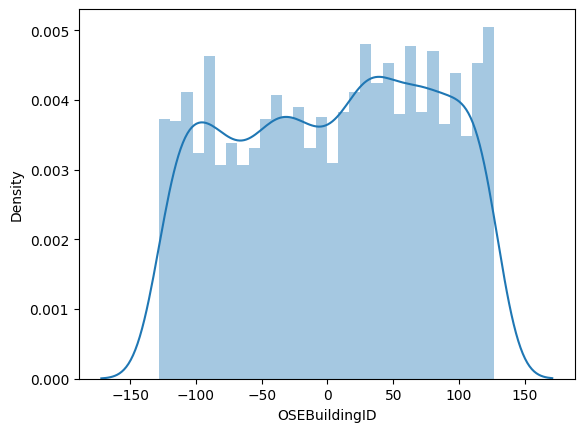

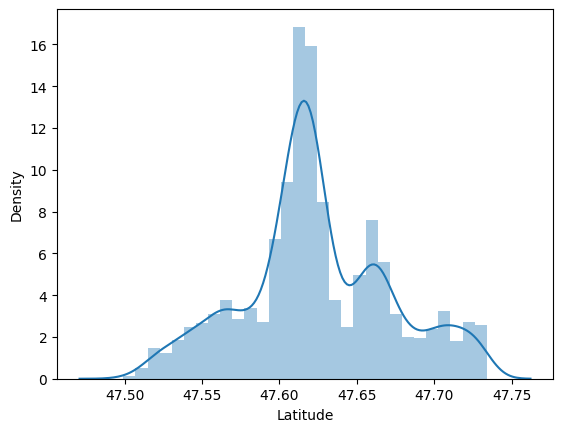

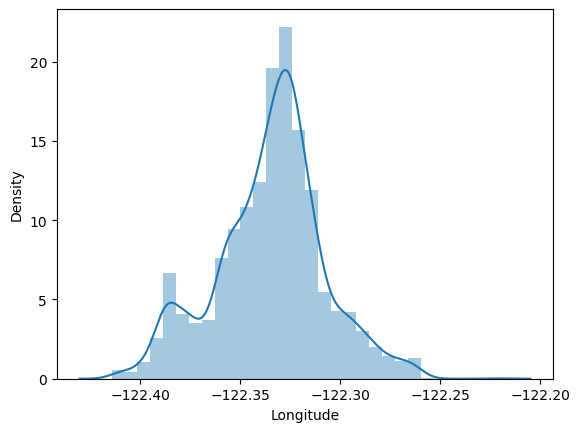

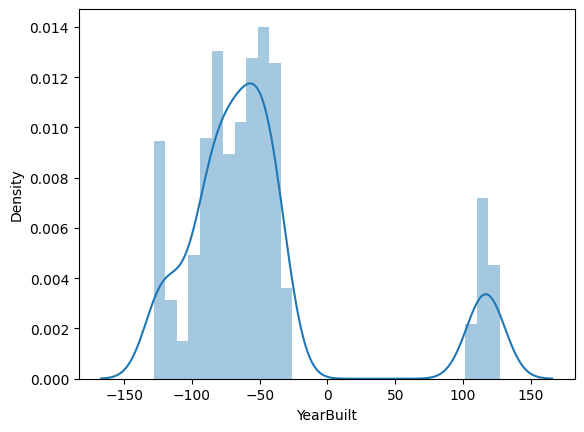

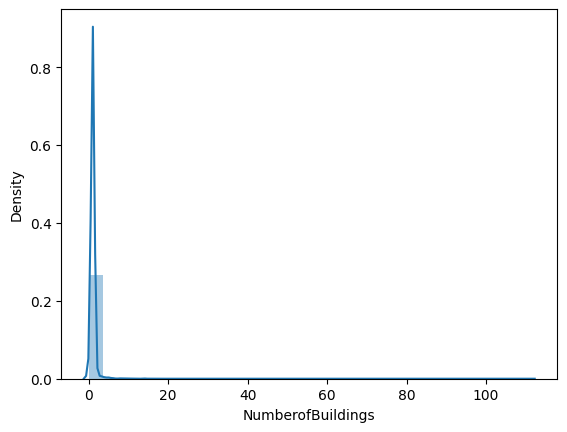

...

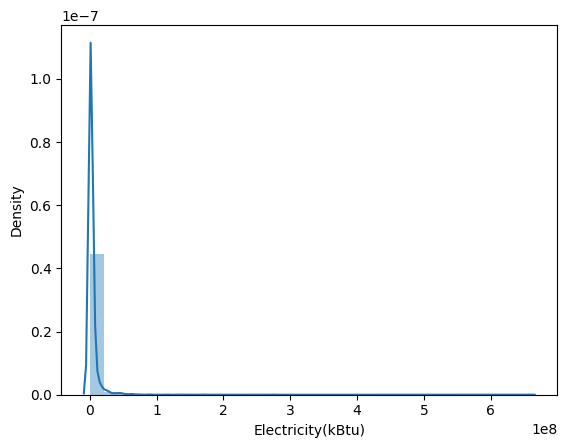

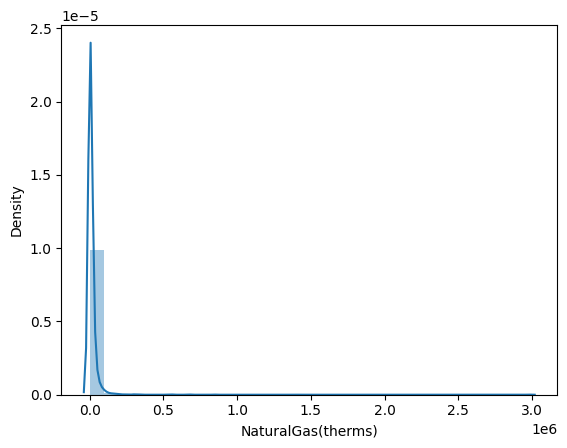

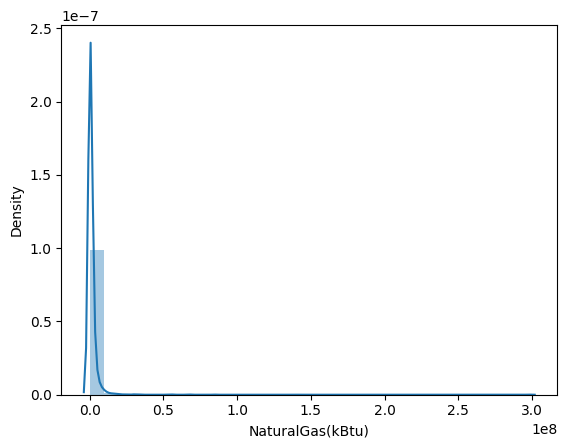

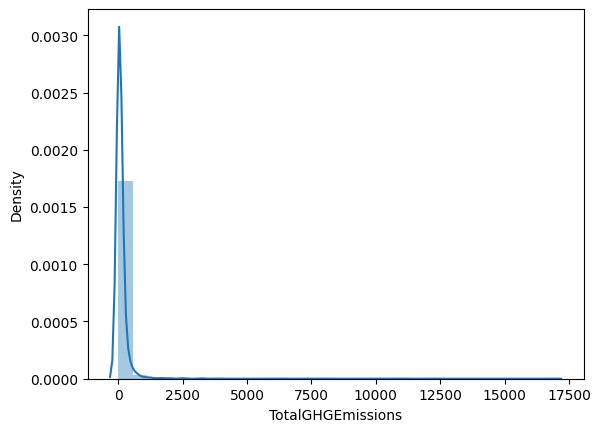

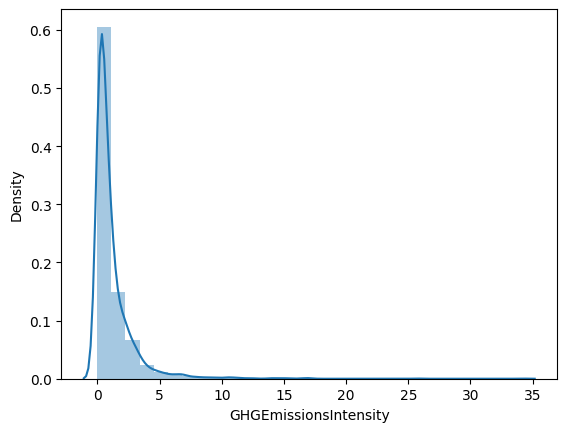

In [89]:
for column in data.select_dtypes(['int8', 'float32','int32','float64']):
    sns.distplot(data[column], bins=30)
    plt.show()    

### Suppression des outliers

In [90]:
# data_2016 = pd.read_csv('data/2016_Building_Energy_Benchmarking.csv')
# data_2016.head(1)

In [91]:
# data = data_2016.copy()
data.shape

(3376, 44)

In [92]:
from sklearn.neighbors import KDTree

data_cleaned = data.copy()
for column in data_cleaned.select_dtypes(include = ['int8', 'float32','int32','float64']).columns.tolist() :
    "outliers aux extrémités des distributions"
    data_cleaned.loc[data[column] > data_cleaned[column].quantile(0.995)] = np.nan
    data_cleaned.loc[data[column] < data_cleaned[column].quantile(0.005)] = np.nan
print(data_cleaned.shape)
    
#outliers éloignés par rapport à leurs voisins
numeric_data = data_cleaned.select_dtypes(['int8', 'float32','int32', 'float64']).copy().dropna()
print(numeric_data.shape)
kdt = KDTree(numeric_data, leaf_size = 40, metric='minkowski')

dist, ind = kdt.query(numeric_data, k=3, return_distance=True)
numeric_data['3N_distance'] = np.sum(dist, axis=1)    
numeric_data = numeric_data[numeric_data['3N_distance'] < numeric_data['3N_distance'].quantile(0.99)]
index_to_drop = numeric_data.index.tolist()
print(data_cleaned.shape)
data_cleaned = data_cleaned.drop(index_to_drop, axis=0)
print(data_cleaned.shape)

(3376, 44)
(211, 26)
(3376, 44)
(3168, 44)


In [93]:
data_cleaned.shape

(3168, 44)

In [94]:
taille_jeu = retourne_taille_jeux(data, data_cleaned)
taille_jeu

,Nom,Dimensions,Proportion de NaN (en %)
0,données initiales,"(3376, 44)",11.234382
1,données nettoyées,"(3168, 44)",28.198175


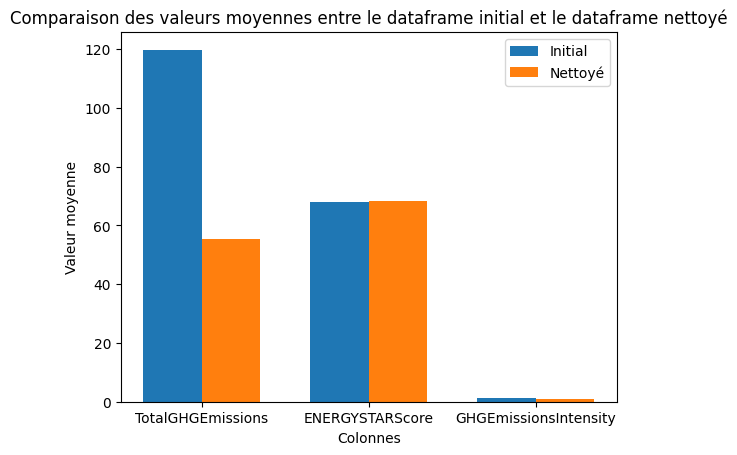

In [95]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Création du dataframe initial
df_initial = data.copy()
df_nettoye = data_cleaned.copy()


# Création des étiquettes de colonnes
colonnes = ['TotalGHGEmissions', 'ENERGYSTARScore', 'GHGEmissionsIntensity']

# Récupération des valeurs du dataframe initial
valeurs_initial = df_initial.loc[:, colonnes].mean()

# Récupération des valeurs du dataframe nettoyé
valeurs_nettoye = df_nettoye.loc[:, colonnes].mean()

# Création du graphique à barres
largeur_barre = 0.35
indices = range(len(colonnes))

plt.bar(indices, valeurs_initial, width=largeur_barre, label='Initial')
plt.bar([i + largeur_barre for i in indices], valeurs_nettoye, width=largeur_barre, label='Nettoyé')

# Ajout des étiquettes d'axe
plt.xlabel('Colonnes')
plt.ylabel('Valeur moyenne')
plt.title('Comparaison des valeurs moyennes entre le dataframe initial et le dataframe nettoyé')
plt.xticks([i + largeur_barre / 2 for i in indices], colonnes)

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()


In [96]:
def delete_outliers_std(dataframe):
    '''Suppression des outliers trop éloignés de la moyenne'''
    
    # Parcours des colonnes numériques de la dataframe
    for column in dataframe.select_dtypes(include = ['int8', 'float32','int32','float64']).columns.tolist() :
        
        # Remplacement des valeurs en dehors de 2 écart-types de la moyenne par NaN
        dataframe.loc[dataframe[column] > dataframe[column].mean() + 2 * dataframe[column].std()] = np.nan
        dataframe.loc[dataframe[column] < dataframe[column].mean() - 2 * dataframe[column].std()] = np.nan
        
        # Remplacement des valeurs négatives par NaN
        dataframe.loc[dataframe[column] < 0] = np.nan
        
    # Retourne la dataframe modifiée
    return dataframe
    
def delete_outliers_percentiles(dataframe):
    '''Suppression des outliers du centile extrême'''
    
    # Parcours des colonnes numériques de la dataframe
    for column in dataframe.select_dtypes(include = ['int8', 'float32','int32','float64']).columns.tolist() :
        
        # Remplacement des valeurs en dehors du 0.5% et 99.5% percentiles par NaN
        dataframe.loc[dataframe[column] > dataframe[column].quantile(0.995)] = np.nan
        dataframe.loc[dataframe[column] < dataframe[column].quantile(0.005)] = np.nan
        
        # Remplacement des valeurs négatives par NaN
        dataframe.loc[dataframe[column] < 0] = np.nan
    # Retourne la dataframe modifiée
    return dataframe        
def delete_outliers_interquartile(dataframe):
    '''Suppression des outliers avec la méthode de l'intervalle interquartile
    
    Args:
        dataframe (DataFrame): le DataFrame à nettoyer
        coef_det (float): le coefficient de détermination pour identifier les outliers. Par défaut 1.5.
    
    Returns:
        DataFrame: la DataFrame nettoyée
    '''    
    # Parcours des colonnes numériques de la dataframe
    for column in dataframe.select_dtypes(include = ['int8', 'float32','int32','float64']).columns.tolist() :
        
        # Calcul des quartiles
        q1 = dataframe[column].quantile(0.05)
        q3 = dataframe[column].quantile(0.95)
        
        # Calcul de l'écart interquartile
        iqr = q3 - q1
        
        # Calcul des bornes de l'intervalle interquartile
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        
        # Remplacement des valeurs en dehors de l'intervalle par NaN
        dataframe.loc[dataframe[column] < lower_bound, column] = np.nan
        dataframe.loc[dataframe[column] > upper_bound, column] = np.nan
        
        # Remplacement des valeurs négatives par 0
        dataframe.loc[dataframe[column] < 0, column] = 0
        
        # Remplacement des valeurs supérieures à 100 par 100
        dataframe.loc[dataframe[column] > 100, column] = 100
        
    # Retourne la dataframe modifiée
    return dataframe


In [97]:
data.shape

(3376, 44)

In [98]:
# Copie du dataframe original et sélection des colonnes energy_100g et salt_100g
data_to_cleaned = data.copy()

# Suppression des outliers avec la fonction delete_outliers_std pour la colonne salt_100g
# et récupération de cette colonne dans la variable salt_std
data_to_cleaned = delete_outliers_std(data)
data_to_cleaned.shape
# print('(subset_data) salt_std : ', salt_std )
# Suppression des outliers avec la fonction delete_outliers_percentiles pour la colonne salt_100g
# et récupération de cette colonne dans la variable salt_percentiles
data_to_cleaned = delete_outliers_percentiles(data_to_cleaned)
data_to_cleaned.shape
# print('(subset_data) salt_percentiles : ', salt_percentiles )
# Suppression des outliers avec la fonction delete_outliers_percentiles pour la colonne salt_100g
# et récupération de cette colonne dans la variable salt_percentiles
data_to_cleaned = delete_outliers_interquartile(data_to_cleaned)
# print('(subset_data) salt_quarcentiles : ', salt_quarcentiles )


In [99]:
data_cleaned.shape

(3168, 44)

Correction du nombre de bâtiments (ne peut être nul)

In [100]:
data[data['NumberofBuildings'] == 0]['NumberofBuildings'] = 1

In [104]:
data.isna().sum().sum()

148544

In [105]:
data_cleaned[data_cleaned['NumberofBuildings'] == 0]['NumberofBuildings'] = 1

In [106]:
data_to_cleaned.isna().sum().sum()

148544

La ligne data.isna().sum().sum() calcule le nombre total de valeurs manquantes (ou NaN) dans un dataframe data.

data.isna() renvoie un dataframe de la même forme que data, mais contenant des valeurs booléennes (True ou False) indiquant si chaque valeur est manquante ou non. Ensuite, data.isna().sum() calcule le nombre de valeurs manquantes pour chaque colonne, et retourne un vecteur (ou une série) contenant ces valeurs. Enfin, .sum() est appelé une deuxième fois pour obtenir la somme totale de ces valeurs manquantes pour toutes les colonnes du dataframe.

In [107]:
data.shape

(3376, 44)

## NaN

In [108]:
data_to_cleaned.shape

(3376, 44)

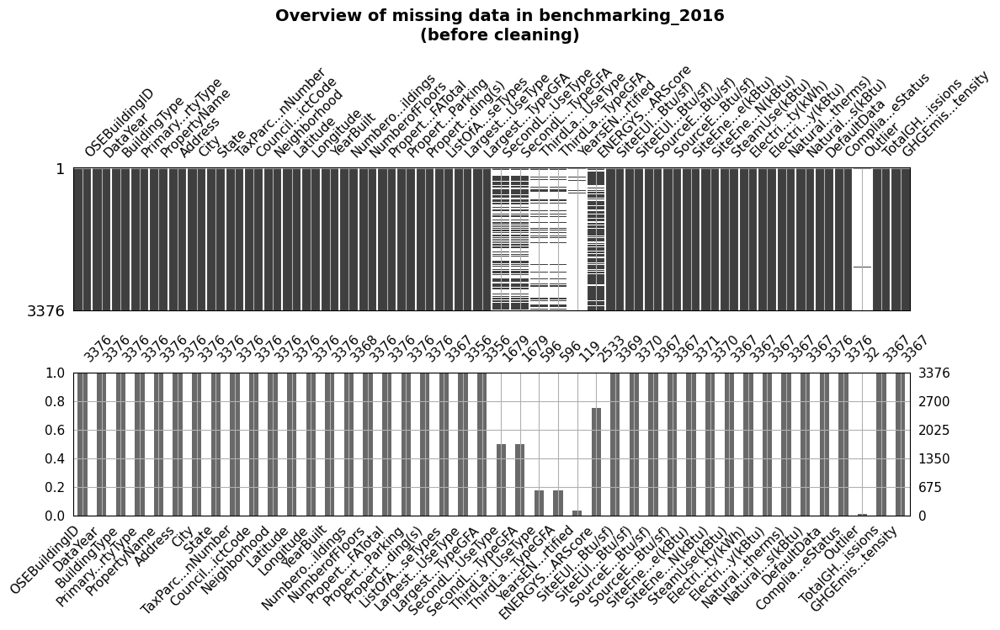

In [109]:
plot_export_missing(data_2016, data_2016.columns, 'missing_vals_2016.png',
                    'Overview of missing data in benchmarking_2016\n(before cleaning)',
                    shorten_label=True)

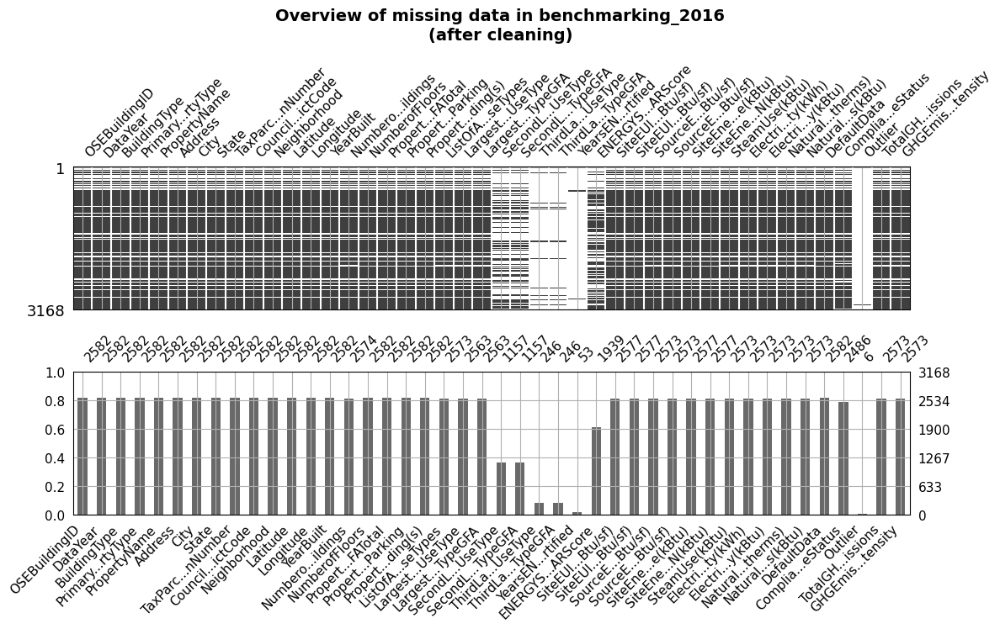

In [110]:
plot_export_missing(data_cleaned, data_cleaned.columns, 'missing_vals_2016.png',
                    'Overview of missing data in benchmarking_2016\n(after cleaning)',
                    shorten_label=True)

In [111]:
data_nan = data_cleaned.isna().sum().sort_values(ascending=False).head(15)

In [112]:
data_nan.shape

(15,)

In [113]:
data_nan

Outlier                            3162
YearsENERGYSTARCertified           3115
ThirdLargestPropertyUseType        2922
ThirdLargestPropertyUseTypeGFA     2922
SecondLargestPropertyUseType       2011
SecondLargestPropertyUseTypeGFA    2011
ENERGYSTARScore                    1229
ComplianceStatus                   682 
LargestPropertyUseTypeGFA          605 
LargestPropertyUseType             605 
SourceEUIWN(kBtu/sf)               595 
SourceEUI(kBtu/sf)                 595 
ListOfAllPropertyUseTypes          595 
Electricity(kWh)                   595 
Electricity(kBtu)                  595 
dtype: int64

In [114]:
# Sélectionner toutes les colonnes numériques dans le DataFrame
num_cols = data_cleaned.select_dtypes(include=['int8', 'float32', 'int32', 'float64']).columns.tolist()

# Calculer le nombre de valeurs égales à 0, différentes de 0 et NaN pour chaque colonne numérique en 2015
res_2016 = pd.concat([(data_cleaned[num_cols]==0).sum(),
                      (data_cleaned[num_cols]!=0).sum(),
                      (data_cleaned[num_cols].isna()).sum()], axis=1)

# Renommer les colonnes résultantes pour spécifier l'état des valeurs de chaque colonne numérique
res_2016.columns = ['==0', '!=0', 'is NaN']
res_2016

,==0,!=0,is NaN
OSEBuildingID,9,3159,586
Latitude,0,3168,586
Longitude,0,3168,586
YearBuilt,0,3168,586
NumberofBuildings,70,3098,594
NumberofFloors,0,3168,586
PropertyGFATotal,24,3144,586
PropertyGFAParking,2290,878,586
PropertyGFABuilding(s),27,3141,586
LargestPropertyUseTypeGFA,0,3168,605


(array([  0.,  20.,  40.,  60.,  80., 100., 120.]),
 [Text(0.0, 0, '0'),
  Text(20.0, 0, '20'),
  Text(40.0, 0, '40'),
  Text(60.0, 0, '60'),
  Text(80.0, 0, '80'),
  Text(100.0, 0, '100'),
  Text(120.0, 0, '120')])

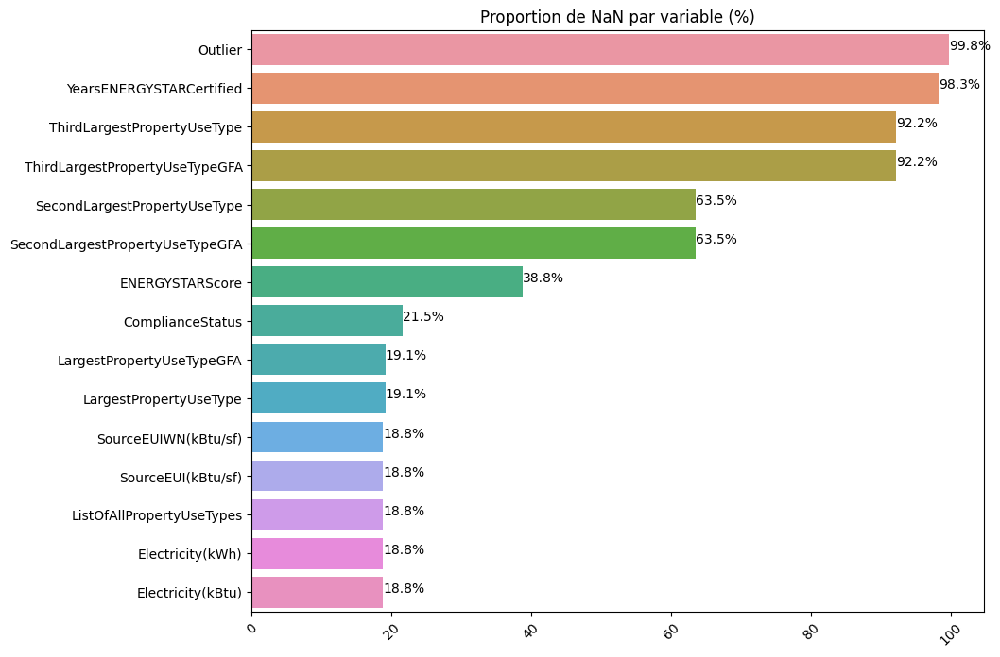

In [115]:
# Création d'une figure avec une taille de 10 par 8 pouces
plt.figure(figsize=(10,8))

# Titre du graphique
plt.title('Proportion de NaN par variable (%)')

# Création d'un graphique en barres horizontales avec la proportion de NaN pour chaque variable
barplot = sns.barplot(x=data_nan.values/data_cleaned.shape[0]*100, y=data_nan.index)

# Ajout des pourcentages en haut de chaque barre
for index, value in enumerate(data_nan.values):
    barplot.text(value/data_cleaned.shape[0]*100, index, str(round(value/data_cleaned.shape[0]*100, 1)) + '%')

# Inclinaison de la légende pour l'afficher en bas
plt.xticks(rotation=45)

# # Affichage du graphique
# plt.show()
# plt.figure(figsize=(10,8))
# plt.title('Proportion de NaN par variable (%)')
# sns.barplot(x=data_nan.values/data.shape[0]*100, y=data_nan.index)

In [116]:
# Parcours toutes les colonnes du dataframe data
for colonne in data_cleaned.columns:
    # Affiche le nom de la colonne
    print('\n',colonne)
    # Calcul le pourcentage de valeurs manquantes (NaN) dans la colonne
    pourcentage_nan = round(data[colonne].isna().sum()/data[colonne].shape[0]*100)
    # Affiche le nombre de valeurs manquantes en pourcentage
    print('Qté Nan : ', pourcentage_nan, '%')
    # Affiche le nombre de valeurs uniques dans la colonne
    print('Uniques : ', data[colonne].nunique())



 OSEBuildingID
Qté Nan :  100 %
Uniques :  0

 DataYear
Qté Nan :  100 %
Uniques :  0

 BuildingType
Qté Nan :  100 %
Uniques :  0

 PrimaryPropertyType
Qté Nan :  100 %
Uniques :  0

 PropertyName
Qté Nan :  100 %
Uniques :  0

 Address
Qté Nan :  100 %
Uniques :  0

 City
Qté Nan :  100 %
Uniques :  0

 State
Qté Nan :  100 %
Uniques :  0

 TaxParcelIdentificationNumber
Qté Nan :  100 %
Uniques :  0

 CouncilDistrictCode
Qté Nan :  100 %
Uniques :  0

 Neighborhood
Qté Nan :  100 %
Uniques :  0

 Latitude
Qté Nan :  100 %
Uniques :  0

 Longitude
Qté Nan :  100 %
Uniques :  0

 YearBuilt
Qté Nan :  100 %
Uniques :  0

 NumberofBuildings
Qté Nan :  100 %
Uniques :  0

 NumberofFloors
Qté Nan :  100 %
Uniques :  0

 PropertyGFATotal
Qté Nan :  100 %
Uniques :  0

 PropertyGFAParking
Qté Nan :  100 %
Uniques :  0

 PropertyGFABuilding(s)
Qté Nan :  100 %
Uniques :  0

 ListOfAllPropertyUseTypes
Qté Nan :  100 %
Uniques :  0

 LargestPropertyUseType
Qté Nan :  100 %
Uniques :  0

 Large

In [117]:
# Parcours toutes les colonnes du dataframe data
for colonne in data_cleaned.columns:
    # Affiche le nom de la colonne
    print('\n',colonne)
    # Calcul le pourcentage de valeurs manquantes (NaN) dans la colonne
    pourcentage_nan = round(data_cleaned[colonne].isna().sum()/data_cleaned[colonne].shape[0]*100)
    # Affiche le nombre de valeurs manquantes en pourcentage
    print('Qté Nan : ', pourcentage_nan, '%')
    # Affiche le nombre de valeurs uniques dans la colonne
    print('Uniques : ', data_cleaned[colonne].nunique())



 OSEBuildingID
Qté Nan :  18 %
Uniques :  255

 DataYear
Qté Nan :  18 %
Uniques :  1

 BuildingType
Qté Nan :  18 %
Uniques :  8

 PrimaryPropertyType
Qté Nan :  18 %
Uniques :  24

 PropertyName
Qté Nan :  18 %
Uniques :  2572

 Address
Qté Nan :  18 %
Uniques :  2566

 City
Qté Nan :  18 %
Uniques :  1

 State
Qté Nan :  18 %
Uniques :  1

 TaxParcelIdentificationNumber
Qté Nan :  18 %
Uniques :  2523

 CouncilDistrictCode
Qté Nan :  18 %
Uniques :  7

 Neighborhood
Qté Nan :  18 %
Uniques :  13

 Latitude
Qté Nan :  18 %
Uniques :  2260

 Longitude
Qté Nan :  18 %
Uniques :  2110

 YearBuilt
Qté Nan :  18 %
Uniques :  111

 NumberofBuildings
Qté Nan :  19 %
Uniques :  7

 NumberofFloors
Qté Nan :  18 %
Uniques :  28

 PropertyGFATotal
Qté Nan :  18 %
Uniques :  253

 PropertyGFAParking
Qté Nan :  18 %
Uniques :  165

 PropertyGFABuilding(s)
Qté Nan :  18 %
Uniques :  253

 ListOfAllPropertyUseTypes
Qté Nan :  19 %
Uniques :  284

 LargestPropertyUseType
Qté Nan :  19 %
Uniques :  

Ce code affiche pour chaque colonne dans le dataframe data : la quantité de valeurs manquantes (en pourcentage) et le nombre de valeurs uniques. Cela peut aider à comprendre la qualité des données et à identifier des problèmes potentiels, tels que des colonnes avec une grande quantité de valeurs manquantes ou avec un petit nombre de valeurs uniques qui peuvent être redondantes ou peu informatives.

In [118]:
# data.drop([ 'Outlier'],axis=1).dropna().shape
# Vérifier si la colonne 'Outlier' existe dans les données
if 'Outlier' in data_cleaned.columns:
    # Supprimer la colonne 'Outlier' et toutes les lignes contenant des valeurs manquantes
    data_cleaned.drop(['Outlier'], axis=1).dropna().shape
else:
    print("La colonne 'Outlier' n'existe pas dans les données.")


Cette instruction sert à supprimer les colonnes "Comment" et "Outlier" du DataFrame "data" à l'aide de la méthode "drop()" de pandas. Ensuite, elle supprime toutes les lignes contenant des valeurs manquantes à l'aide de la méthode "dropna()". Enfin, elle renvoie le nombre de lignes et de colonnes restantes après la suppression, sous la forme d'un tuple de la forme (nombre de lignes, nombre de colonnes). Cela permet de vérifier combien de données ont été perdues suite à la suppression des lignes contenant des valeurs manquantes dans les colonnes "Comment" et "Outlier".

In [119]:
data_cleaned.shape

(3168, 44)

In [120]:
((data.isna().sum()/data.shape[0]) < .99)

OSEBuildingID                      False
DataYear                           False
BuildingType                       False
PrimaryPropertyType                False
PropertyName                       False
Address                            False
City                               False
State                              False
TaxParcelIdentificationNumber      False
CouncilDistrictCode                False
Neighborhood                       False
Latitude                           False
Longitude                          False
YearBuilt                          False
NumberofBuildings                  False
NumberofFloors                     False
PropertyGFATotal                   False
PropertyGFAParking                 False
PropertyGFABuilding(s)             False
ListOfAllPropertyUseTypes          False
LargestPropertyUseType             False
LargestPropertyUseTypeGFA          False
SecondLargestPropertyUseType       False
SecondLargestPropertyUseTypeGFA    False
ThirdLargestProp

In [121]:
((data_cleaned.isna().sum()/data_cleaned.shape[0]) < .99)

OSEBuildingID                      True 
DataYear                           True 
BuildingType                       True 
PrimaryPropertyType                True 
PropertyName                       True 
Address                            True 
City                               True 
State                              True 
TaxParcelIdentificationNumber      True 
CouncilDistrictCode                True 
Neighborhood                       True 
Latitude                           True 
Longitude                          True 
YearBuilt                          True 
NumberofBuildings                  True 
NumberofFloors                     True 
PropertyGFATotal                   True 
PropertyGFAParking                 True 
PropertyGFABuilding(s)             True 
ListOfAllPropertyUseTypes          True 
LargestPropertyUseType             True 
LargestPropertyUseTypeGFA          True 
SecondLargestPropertyUseType       True 
SecondLargestPropertyUseTypeGFA    True 
ThirdLargestProp

Cette ligne de code vérifie pour chaque colonne du dataframe data si la proportion de valeurs manquantes est inférieure à 99% (c'est-à-dire si la colonne a moins de 99% de valeurs manquantes).

Elle renvoie un tableau de booléens qui indique True si la proportion de valeurs manquantes est inférieure à 99% et False sinon.

 Cela signifie que pour toutes les autres colonnes sauf la colonne "Outlier", il y a au moins un NaN dans chaque colonne.

In [122]:
data_cleaned.shape

(3168, 44)

In [123]:
# Initialisation d'une liste vide pour stocker les noms des colonnes
liste_colonnes = []

# Récupération d'une série booléenne qui indique pour chaque colonne si elle contient moins de 90% de NaN
serie_nan = data_cleaned.isna().sum()/data_cleaned.shape[0] < .99
print ( serie_nan)

# Itération sur chaque colonne et son état booléen associé
for colonne, booleen in zip(serie_nan.index, serie_nan.values):
    # Si la colonne contient moins de 90% de NaN
    if booleen :
        # Ajout de son nom à la liste de colonnes à conserver
        liste_colonnes.append(colonne)
print( liste_colonnes)
# Sélection des colonnes à conserver dans le dataframe data
data_cleaned_test = data_cleaned[liste_colonnes]

# Affichage du dataframe data
data_cleaned_test

OSEBuildingID                      True 
DataYear                           True 
BuildingType                       True 
PrimaryPropertyType                True 
PropertyName                       True 
Address                            True 
City                               True 
State                              True 
TaxParcelIdentificationNumber      True 
CouncilDistrictCode                True 
Neighborhood                       True 
Latitude                           True 
Longitude                          True 
YearBuilt                          True 
NumberofBuildings                  True 
NumberofFloors                     True 
PropertyGFATotal                   True 
PropertyGFAParking                 True 
PropertyGFABuilding(s)             True 
ListOfAllPropertyUseTypes          True 
LargestPropertyUseType             True 
LargestPropertyUseTypeGFA          True 
SecondLargestPropertyUseType       True 
SecondLargestPropertyUseTypeGFA    True 
ThirdLargestProp

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity
0,1.0,-32,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,0659000030,7,DOWNTOWN,47.612202,-122.337990,-121.0,1.0,12.0,114.0,0.0,114.0,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7.226362e+06,7.456910e+06,2003882.00,1.156514e+06,3.946027e+06,12764.529297,1.276453e+06,False,Compliant,249.979996,2.83
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5.0,-32,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,0659000640,7,DOWNTOWN,47.614120,-122.336639,-122.0,1.0,10.0,-120.0,0.0,-120.0,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6.794584e+06,6.946800e+06,2214446.25,8.115253e+05,2.768924e+06,18112.130859,1.811213e+06,False,Compliant,286.429993,4.67
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,9.0,-32,Nonresidential COS,Other,West Precinct,810 Virginia St,Seattle,WA,0660000560,7,DOWNTOWN,47.616230,-122.336571,-49.0,1.0,2.0,8.0,78.0,-70.0,Police Station,Police Station,88830.0,NaN,NaN,NaN,NaN,NaN,NaN,136.100006,141.600006,316.299988,320.500000,1.208662e+07,1.258171e+07,0.00,2.160444e+06,7.371434e+06,47151.816406,4.715182e+06,False,Compliant,301.809998,3.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,46.0,-32,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,Seattle,WA,1624049080,2,GREATER DUWAMISH,47.567219,-122.311539,-58.0,1.0,1.0,6.0,0.0,6.0,Office,Office,12294.0,NaN,NaN,NaN,NaN,NaN,46.0,69.099998,76.699997,161.699997,176.100006,8.497457e+05,9.430032e+05,0.00,1.536550e+05,5.242709e+05,3254.750244,3.254750e+05,True,NaN,20.940001,1.70
3372,47.0,-32,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,3558300000,2,DOWNTOWN,47.596249,-122.322830,-44.0,1.0,1.0,-128.0,0.0,-128.0,Other - Recreation,Other - Recreation,16000.0,NaN,NaN,NaN,NaN,NaN,NaN,59.400002,65.900002,114.199997,118.900002,9.502762e+05,1.053706e+06,0.00,1.162210e+05,3.965461e+05,5537.299805,5.537300e+05,False,Compliant,32.169998,2.01
3373,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3374,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [124]:
data_cleaned_test.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'Address', 'City', 'State',
       'TaxParcelIdentificationNumber', 'CouncilDistrictCode', 'Neighborhood',
       'Latitude', 'Longitude', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'DefaultData', 'ComplianceStatus',
       'TotalGHGEmissions', 'GHGEmissi

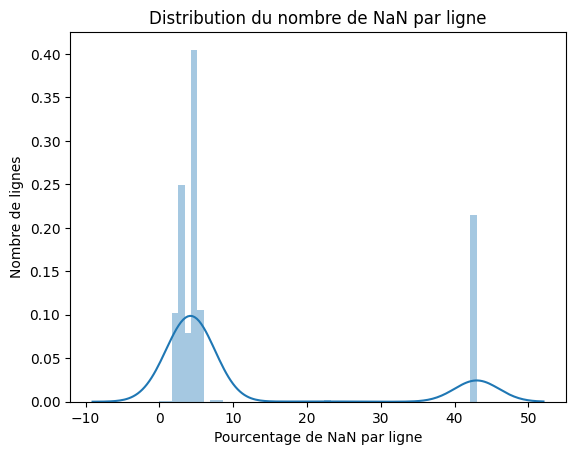

In [125]:
# Titre du graphique
plt.title('Distribution du nombre de NaN par ligne')

# Trace une distribution du nombre de NaN par ligne
sns.distplot(data_cleaned_test.isna().sum(axis=1))

# Ajoute une légende pour l'axe des x
plt.xlabel('Pourcentage de NaN par ligne')

# Ajoute une légende pour l'axe des y
plt.ylabel('Nombre de lignes')

# # Calcule le nombre total de lignes
# total_rows = data.shape[0]

# # Parcourt chaque bin dans l'histogramme
# for bar in plt.gca().patches:
    
#     # Calcule la hauteur de la barre
#     height = bar.get_height()
    
#     # Ajoute le pourcentage correspondant au dessus de la barre
#     plt.gca().text(bar.get_x() + bar.get_width()/2, height + 10, 
#                    '{0:.2f}%'.format(height/total_rows*100), 
#                    ha='center', va='bottom')
    
# Affiche le graphique
plt.show()


In [126]:
data_cleaned_test.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'Address', 'City', 'State',
       'TaxParcelIdentificationNumber', 'CouncilDistrictCode', 'Neighborhood',
       'Latitude', 'Longitude', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'DefaultData', 'ComplianceStatus',
       'TotalGHGEmissions', 'GHGEmissi

In [127]:
col_list = ['SiteEUI(kBtu/sf)',
            'SiteEUIWN(kBtu/sf)',
            'SourceEUI(kBtu/sf)',
            'SourceEUIWN(kBtu/sf)',
            'SiteEnergyUse(kBtu)',
            'SiteEnergyUseWN(kBtu)',
            'SteamUse(kBtu)',
            'Electricity(kWh)',
            'Electricity(kBtu)',
            'NaturalGas(therms)',
            'NaturalGas(kBtu)',
            'OtherFuelUse(kBtu)']
present_cols, absent_cols = compare_cols(col_list, data_cleaned_test)
print('Colonnes présentes :', present_cols)
print('Colonnes absentes :', absent_cols)


Colonnes présentes : ['SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)', 'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)', 'NaturalGas(kBtu)']
Colonnes absentes : ['OtherFuelUse(kBtu)']


In [128]:
data_cleaned_test[[
 'SiteEUI(kBtu/sf)',
 'SiteEUIWN(kBtu/sf)',
 'SourceEUI(kBtu/sf)',
 'SourceEUIWN(kBtu/sf)',
 'SiteEnergyUse(kBtu)',
 'SiteEnergyUseWN(kBtu)',
 'SteamUse(kBtu)',
 'Electricity(kWh)',
 'Electricity(kBtu)',
 'NaturalGas(therms)',
 'NaturalGas(kBtu)',]].isna().sum()

SiteEUI(kBtu/sf)         591
SiteEUIWN(kBtu/sf)       591
SourceEUI(kBtu/sf)       595
SourceEUIWN(kBtu/sf)     595
SiteEnergyUse(kBtu)      591
SiteEnergyUseWN(kBtu)    591
SteamUse(kBtu)           595
Electricity(kWh)         595
Electricity(kBtu)        595
NaturalGas(therms)       595
NaturalGas(kBtu)         595
dtype: int64

In [129]:
data_cleaned_test.isna().sum().sort_values(ascending=False)

YearsENERGYSTARCertified           3115
ThirdLargestPropertyUseType        2922
ThirdLargestPropertyUseTypeGFA     2922
SecondLargestPropertyUseType       2011
SecondLargestPropertyUseTypeGFA    2011
ENERGYSTARScore                    1229
ComplianceStatus                   682 
LargestPropertyUseTypeGFA          605 
LargestPropertyUseType             605 
ListOfAllPropertyUseTypes          595 
SourceEUI(kBtu/sf)                 595 
SteamUse(kBtu)                     595 
Electricity(kWh)                   595 
Electricity(kBtu)                  595 
NaturalGas(therms)                 595 
NaturalGas(kBtu)                   595 
TotalGHGEmissions                  595 
SourceEUIWN(kBtu/sf)               595 
GHGEmissionsIntensity              595 
NumberofBuildings                  594 
SiteEnergyUseWN(kBtu)              591 
SiteEUI(kBtu/sf)                   591 
SiteEUIWN(kBtu/sf)                 591 
SiteEnergyUse(kBtu)                591 
PropertyGFABuilding(s)             586 


In [130]:
data_cleaned_test.select_dtypes(['object']).nunique().sort_values()

DefaultData                      2   
PrimaryPropertyType              24  
TaxParcelIdentificationNumber    2523
Address                          2566
PropertyName                     2572
dtype: int64

### Complétion des NaN par des valeurs quand applicable

Quand NaN pour usage ou other fuel use : valeur 0

In [131]:
data_cleaned_test[['ThirdLargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA']] = data_cleaned_test[['ThirdLargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA', ]].fillna(0, )

In [132]:
data_cleaned_test.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'Address', 'City', 'State',
       'TaxParcelIdentificationNumber', 'CouncilDistrictCode', 'Neighborhood',
       'Latitude', 'Longitude', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'DefaultData', 'ComplianceStatus',
       'TotalGHGEmissions', 'GHGEmissi

Quand NaN pour le type d'usage suppléentaire : création d'un nouveau type "no use"

In [133]:
# data_cleaned_test['ThirdLargestPropertyUseType'] = data_cleaned_test['ThirdLargestPropertyUseType'].cat.add_categories("No Use")
# data_cleaned_test['SecondLargestPropertyUseType'] = data_cleaned_test['SecondLargestPropertyUseType'].cat.add_categories("No Use")
# data_cleaned_test[['ThirdLargestPropertyUseType', 'SecondLargestPropertyUseType']] = data_cleaned_test[['ThirdLargestPropertyUseType', 'SecondLargestPropertyUseType']].fillna("No Use")


# data[['ThirdLargestPropertyUseType', 'SecondLargestPropertyUseType']] = data[['ThirdLargestPropertyUseType', 'SecondLargestPropertyUseType']].fillna('No Use')
if "No Use" not in data_cleaned_test['ThirdLargestPropertyUseType'].cat.categories:
    data_cleaned_test['ThirdLargestPropertyUseType'] = data_cleaned_test['ThirdLargestPropertyUseType'].cat.add_categories("No Use")
if "No Use" not in data_cleaned_test['SecondLargestPropertyUseType'].cat.categories:
    data_cleaned_test['SecondLargestPropertyUseType'] = data_cleaned_test['SecondLargestPropertyUseType'].cat.add_categories("No Use")

data_cleaned_test[['ThirdLargestPropertyUseType', 'SecondLargestPropertyUseType']] = data_cleaned_test[['ThirdLargestPropertyUseType', 'SecondLargestPropertyUseType']].fillna("No Use")


In [134]:
# if "No Use" not in data['ThirdLargestPropertyUseType'].cat.categories:
#     data['ThirdLargestPropertyUseType'] = data['ThirdLargestPropertyUseType'].cat.add_categories("No Use")
# if "No Use" not in data['SecondLargestPropertyUseType'].cat.categories:
#     data['SecondLargestPropertyUseType'] = data['SecondLargestPropertyUseType'].cat.add_categories("No Use")

# data[['ThirdLargestPropertyUseType', 'SecondLargestPropertyUseType']] = data[['ThirdLargestPropertyUseType', 'SecondLargestPropertyUseType']].fillna("No Use")


In [135]:
if "No information" not in data_cleaned_test['LargestPropertyUseType'].cat.categories:
    data_cleaned_test['LargestPropertyUseType'] = data_cleaned_test['LargestPropertyUseType'].cat.add_categories("No information")
data_cleaned_test[['LargestPropertyUseType']] = data_cleaned_test[['LargestPropertyUseType']].fillna("No information")

# data['LargestPropertyUseType'] = data['LargestPropertyUseType'].fillna('No information')

In [136]:
data_cleaned_test[data_cleaned_test['LargestPropertyUseType'] == 'No information']

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No information,NaN,No Use,0.0,No Use,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No information,NaN,No Use,0.0,No Use,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No information,NaN,No Use,0.0,No Use,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No information,NaN,No Use,0.0,No Use,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No information,NaN,No Use,0.0,No Use,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No information,NaN,No Use,0.0,No Use,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No information,NaN,No Use,0.0,No Use,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No information,NaN,No Use,0.0,No Use,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No information,NaN,No Use,0.0,No Use,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No information,NaN,No Use,0.0,No Use,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [137]:
# data_cleaned_test.isna().sum().sort_values()
# Vérification du nombre de valeurs manquantes par colonne
# isna() renvoie une matrice booléenne True si une valeur est manquante sinon False
# sum() renvoie le nombre de valeurs manquantes pour chaque colonne
# sort_values() trie les colonnes en ordre croissant de nombres de valeurs manquantes
data_cleaned_test.isna().sum().sort_values()


ThirdLargestPropertyUseTypeGFA     0   
ThirdLargestPropertyUseType        0   
SecondLargestPropertyUseTypeGFA    0   
SecondLargestPropertyUseType       0   
LargestPropertyUseType             0   
OSEBuildingID                      586 
DefaultData                        586 
PropertyGFABuilding(s)             586 
PropertyGFAParking                 586 
NumberofFloors                     586 
YearBuilt                          586 
Longitude                          586 
PropertyGFATotal                   586 
Neighborhood                       586 
DataYear                           586 
BuildingType                       586 
Latitude                           586 
PropertyName                       586 
Address                            586 
PrimaryPropertyType                586 
State                              586 
TaxParcelIdentificationNumber      586 
CouncilDistrictCode                586 
City                               586 
SiteEnergyUse(kBtu)                591 


In [138]:
data.shape

(3376, 44)

In [139]:
data_cleaned_test.shape

(3168, 43)

In [140]:
df1 = data_cleaned_test.copy()

In [141]:
df1.dropna(how = 'all', axis=0, inplace=True)

In [142]:
df1.shape

(3168, 43)

In [143]:
# Cette ligne de code calcule le nombre de valeurs manquantes pour chaque colonne du dataframe "df1".
# Elle commence par utiliser la méthode "isna()" pour créer un masque de booléens, où chaque élément est "True" si la valeur est manquante et "False" sinon.
# Ensuite, la méthode "sum()" est appliquée sur le résultat de "isna()" pour compter le nombre de valeurs manquantes dans chaque colonne.
# Enfin, la méthode "sort_values()" est utilisée pour trier les résultats par ordre croissant, ce qui signifie que les colonnes avec le moins de valeurs manquantes apparaissent en premier.

df1.isna().sum().sort_values()

ThirdLargestPropertyUseTypeGFA     0   
ThirdLargestPropertyUseType        0   
SecondLargestPropertyUseTypeGFA    0   
SecondLargestPropertyUseType       0   
LargestPropertyUseType             0   
OSEBuildingID                      586 
DefaultData                        586 
PropertyGFABuilding(s)             586 
PropertyGFAParking                 586 
NumberofFloors                     586 
YearBuilt                          586 
Longitude                          586 
PropertyGFATotal                   586 
Neighborhood                       586 
DataYear                           586 
BuildingType                       586 
Latitude                           586 
PropertyName                       586 
Address                            586 
PrimaryPropertyType                586 
State                              586 
TaxParcelIdentificationNumber      586 
CouncilDistrictCode                586 
City                               586 
SiteEnergyUse(kBtu)                591 


In [144]:
for column in df1.columns:
    missing_values_count = df1[column].isnull().sum()
    total_values_count = len(df1[column])
    missing_values_percent = missing_values_count/total_values_count * 100
    if missing_values_count == 0:
        print("La colonne {} ne contient pas de valeurs manquantes sur un total de {} valeurs".format(column, total_values_count))
    else:
        print("La colonne {} a {} valeurs manquantes sur un total de {} valeurs ({} %)".format(column, missing_values_count, total_values_count, round(missing_values_percent, 2)))

df1.isna().sum().sort_values()


La colonne OSEBuildingID a 586 valeurs manquantes sur un total de 3168 valeurs (18.5 %)
La colonne DataYear a 586 valeurs manquantes sur un total de 3168 valeurs (18.5 %)
La colonne BuildingType a 586 valeurs manquantes sur un total de 3168 valeurs (18.5 %)
La colonne PrimaryPropertyType a 586 valeurs manquantes sur un total de 3168 valeurs (18.5 %)
La colonne PropertyName a 586 valeurs manquantes sur un total de 3168 valeurs (18.5 %)
La colonne Address a 586 valeurs manquantes sur un total de 3168 valeurs (18.5 %)
La colonne City a 586 valeurs manquantes sur un total de 3168 valeurs (18.5 %)
La colonne State a 586 valeurs manquantes sur un total de 3168 valeurs (18.5 %)
La colonne TaxParcelIdentificationNumber a 586 valeurs manquantes sur un total de 3168 valeurs (18.5 %)
La colonne CouncilDistrictCode a 586 valeurs manquantes sur un total de 3168 valeurs (18.5 %)
La colonne Neighborhood a 586 valeurs manquantes sur un total de 3168 valeurs (18.5 %)
La colonne Latitude a 586 valeurs m

ThirdLargestPropertyUseTypeGFA     0   
ThirdLargestPropertyUseType        0   
SecondLargestPropertyUseTypeGFA    0   
SecondLargestPropertyUseType       0   
LargestPropertyUseType             0   
OSEBuildingID                      586 
DefaultData                        586 
PropertyGFABuilding(s)             586 
PropertyGFAParking                 586 
NumberofFloors                     586 
YearBuilt                          586 
Longitude                          586 
PropertyGFATotal                   586 
Neighborhood                       586 
DataYear                           586 
BuildingType                       586 
Latitude                           586 
PropertyName                       586 
Address                            586 
PrimaryPropertyType                586 
State                              586 
TaxParcelIdentificationNumber      586 
CouncilDistrictCode                586 
City                               586 
SiteEnergyUse(kBtu)                591 


### Suite NaN

In [145]:
df1.shape

(3168, 43)

On va retirer les indices pour lesquelles ont a beaucoup de NaN sur une même ligne, notamment pour les features qui ont le plus de NaN

In [146]:
# df1.drop(['DefaultData',  'ENERGYSTARScore'], axis=1)[df1.drop(['DefaultData', 'ENERGYSTARScore'],axis=1).isna().any(axis=1)].shape

# Suppression des colonnes 'DefaultData' et 'ENERGYSTARScore' et sélection des lignes contenant des valeurs manquantes
# Le premier df1.drop permet de supprimer les colonnes 'DefaultData' et 'ENERGYSTARScore'
# Le second df1.drop permet de sélectionner toutes les lignes ayant au moins une valeur manquante dans les autres colonnes
# La méthode isna() retourne un DataFrame de même forme que df1, dont les éléments sont des booléens qui indiquent s'ils sont manquants ou non
# La méthode any(axis=1) retourne un booléen par ligne indiquant s'il y a au moins une valeur manquante dans cette ligne
# Ainsi, l'expression df1.drop(['DefaultData', 'ENERGYSTARScore'], axis=1).isna().any(axis=1) renvoie un tableau de booléens
# qui indique quelles lignes de df1 contiennent des valeurs manquantes dans une ou plusieurs de leurs colonnes, et cet
# ensemble de lignes est sélectionné en utilisant l'opérateur [] qui retourne un DataFrame contenant uniquement ces lignes.
df1.drop(['DefaultData',  'ENERGYSTARScore'], axis=1)[df1.drop(['DefaultData', 'ENERGYSTARScore'],axis=1).isna().any(axis=1)].shape


(3115, 41)

In [147]:
# index_to_drop = df1.drop(['DefaultData', 'ENERGYSTARScore'], axis=1)[df1.drop(['DefaultData', 'ENERGYSTARScore'],axis=1).isna().any(axis=1)].index
# Création d'un index de lignes à supprimer à partir d'un sous-dataframe 
# créé en éliminant les colonnes 'DefaultData' et 'ENERGYSTARScore' 
# et en vérifiant la présence de valeurs manquantes sur toutes les colonnes 
# (any(axis=1) renvoie True si au moins une colonne est manquante pour chaque ligne)
index_to_drop = df1.drop(['DefaultData', 'ENERGYSTARScore'], axis=1)[df1.drop(['DefaultData', 'ENERGYSTARScore'],axis=1).isna().any(axis=1)].index


In [148]:
# df1.drop(index_to_drop, axis=0, inplace=True) 
# # Supprime les lignes ayant au moins une valeur manquante dans les colonnes "DefaultData" et "ENERGYSTARScore"
# # et retourne l'index de ces lignes
# index_to_drop = df1.drop(['DefaultData', 'ENERGYSTARScore'], axis=1)[df1.drop(['DefaultData', 'ENERGYSTARScore'], axis=1).isna().any(axis=1)].index 

# Supprime les lignes correspondant aux index obtenus précédemment
# en utilisant la méthode "drop" avec l'argument "axis=0" pour spécifier que l'on veut supprimer des lignes
# et "inplace=True" pour appliquer les modifications directement sur l'objet "df1"
df1.drop(index_to_drop, axis=0, inplace=True)
# ICI 


In [149]:
df1.shape

(53, 43)

In [150]:
df1.head(1)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity
37,50.0,-32,SPS-District K-12,K-12 School,Lawton Elementary,4000 27th Ave. W.,Seattle,WA,0369000400,7,MAGNOLIA / QUEEN ANNE,47.656712,-122.390472,-58.0,1.0,2.0,-54.0,0.0,-54.0,K-12 School,K-12 School,54986.0,No Use,0.0,No Use,0.0,2016,97.0,30.0,32.799999,77.800003,83.199997,1650279.25,1802471.375,0.0,356855.0,1217589.0,4326.897461,432690.0,False,Compliant,31.469999,0.57


## Regroupement des données catégorielles

In [151]:
df1.select_dtypes(['object', 'category']).nunique().sort_values(ascending=False)

PropertyName                     53
Address                          53
TaxParcelIdentificationNumber    51
YearsENERGYSTARCertified         25
ListOfAllPropertyUseTypes        15
Neighborhood                     11
PrimaryPropertyType              10
CouncilDistrictCode              7 
LargestPropertyUseType           7 
SecondLargestPropertyUseType     7 
BuildingType                     5 
ThirdLargestPropertyUseType      2 
DefaultData                      1 
DataYear                         1 
State                            1 
City                             1 
ComplianceStatus                 1 
dtype: int64

In [152]:
property_use_types_columns = ['SecondLargestPropertyUseType',
                         'LargestPropertyUseType',
                         'ThirdLargestPropertyUseType',
                         'PrimaryPropertyType']

In [153]:
usetype_dict = {'Retail Store' : 'Retail',
                'Supermarket/Grocery Store' : 'Retail',
                'Repair Services (Vehicle, Shoe, Locksmith, etc)' : 'Retail',
                'Automobile Dealership': 'Retail',
                'Convenience Store without Gas Station': 'Retail',
                'Personal Services': 'Retail',
                'Enclosed Mall': 'Retail',
                'Strip Mall': 'Retail',
                'Wholesale Club/Supercenter': 'Retail',
                'Other - Mall': 'Retail',
                'Supermarket / Grocery Stor': 'Retail',
                
                'Food Sales': 'Leisure',
                'Restaurant' : 'Leisure',
                'Other - Restaurant/Bar' : 'Leisure',
                'Food Service': 'Leisure' ,
                'Worship Facility': 'Leisure',
                'Other - Recreation': 'Leisure',
                'Other - Entertainment/Public Assembly': 'Leisure',
                'Performing Arts': 'Leisure',
                'Bar/Nightclub': 'Leisure',
                'Movie Theater': 'Leisure',
                'Museum': 'Leisure',
                'Social/Meeting Hall': 'Leisure',
                'Fitness Center/Health Club/Gym': 'Leisure',
                'Lifestyle Center ': 'Leisure',
                'Fast Food Restaurant': 'Leisure',
                
                'Multifamily Housing' : 'Hotel/Senior Care/Housing',
                'Other - Lodging/Residential': 'Hotel/Senior Care/Housing',
                'Residence Hall/Dormitory': 'Hotel/Senior Care/Housing',
                'Hotel' : 'Hotel/Senior Care/Housing',
                'Senior Care Community' : 'Hotel/Senior Care/Housing',
                'Residential Care Facility' : 'Hotel/Senior Care/Housing',
                'High-Rise Multifamily': 'Hotel/Senior Care/Housing',
                
                'Medical Office' : 'Health',
                
                'Other - Services' : 'Office',
                'Bank Branch' : 'Office',
                'Financial Office' : 'Office',
                'Other - Public Services': 'Office',

                'K-12 School' : 'Education',
                'Other - Education': 'Education',
                'Vocational School' : 'Education', 
                'Adult Education' : 'Education',
                'Pre-school/Daycare': 'Education',
                'University': 'Education',
                'College/University': 'Education',
                'Library': 'Education'
               }

In [154]:
for column in property_use_types_columns:
    df1[column] = df1[column].replace(usetype_dict)

In [155]:
for column in df1[property_use_types_columns].columns:
    print(df1[column].value_counts())
    print('\n')

Parking                                                 31
No Use                                                  17
Leisure                                                 2 
Laboratory                                              1 
Data Center                                             1 
Office                                                  1 
Other/Specialty Hospital                                0 
Swimming Pool                                           0 
Self-Storage Facility                                   0 
Retail                                                  0 
Refrigerated Warehouse                                  0 
Personal Services (Health/Beauty, Dry Cleaning, etc)    0 
Courthouse                                              0 
Other                                                   0 
Hotel/Senior Care/Housing                               0 
Health                                                  0 
Manufacturing/Industrial Plant                          

## Vue du jeu de données nettoyé

In [156]:
df1.shape

(53, 43)

In [157]:
data_cleaned_test.shape

(3168, 43)

In [158]:
df1.sample(10)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity
116,-71.0,-32,SPS-District K-12,Education,Nathan Hale High,17050 30th Ave. N.E.,Seattle,WA,2826049152,5,NORTH,47.707630,-122.294533,-37.0,1.0,2.0,-42.0,0.0,-42.0,"K-12 School, Parking",Education,238550.0,Parking,0.0,No Use,0.0,2016,96.0,35.000000,38.900002,78.699997,84.400002,8355988.500,9287467.00,0.0,1.403854e+06,4789948.0,35660.394531,3566039.0,False,Compliant,222.779999,0.94
521,-61.0,-32,NonResidential,Large Office,101 ELLIOTT AVENUE WEST,101 Elliott Ave West,Seattle,WA,7666202220,7,MAGNOLIA / QUEEN ANNE,47.618912,-122.359581,-62.0,1.0,5.0,82.0,0.0,82.0,"Office, Parking",Office,109978.0,Parking,78848.0,No Use,0.0,2016201120102009,95.0,50.099998,52.700001,125.199997,127.900002,5514308.500,5799664.50,0.0,1.118781e+06,3817281.0,16970.269531,1697027.0,False,Compliant,116.739998,0.56
243,112.0,-32,NonResidential,Large Office,4300 Roosevelt,4300 Roosevelt Way NE,Seattle,WA,1142000550,4,NORTHEAST,47.659988,-122.317413,-46.0,1.0,5.0,-23.0,32.0,-55.0,"Office, Parking",Office,145754.0,Parking,90000.0,No Use,0.0,201720162015201420132008,93.0,48.299999,48.299999,151.800003,151.800003,7046345.500,7046345.50,0.0,2.065166e+06,7046345.0,0.000000,0.0,False,Compliant,49.119999,0.22
3293,81.0,-32,Multifamily MR (5-9),Mid-Rise Multifamily,REO Flats,1525 14th Ave,Seattle,WA,6003000245,3,EAST,47.614880,-122.314423,-35.0,1.0,7.0,16.0,0.0,16.0,"Multifamily Housing, Parking",Hotel/Senior Care/Housing,80262.0,Parking,30528.0,No Use,0.0,2017,71.0,55.099998,56.000000,118.500000,119.400002,4423607.000,4496225.50,0.0,6.823106e+05,2328044.0,20955.630859,2095563.0,False,Compliant,127.529999,1.07
3231,-63.0,-32,Multifamily MR (5-9),Mid-Rise Multifamily,AMLI South Lake Union 1,1260 Republican St.,Seattle,WA,2925049041,7,LAKE UNION,47.623360,-122.330849,-35.0,1.0,7.0,110.0,0.0,110.0,"Multifamily Housing, Parking",Hotel/Senior Care/Housing,176814.0,Parking,53760.0,No Use,0.0,20172016,93.0,33.900002,35.900002,80.500000,84.599998,5987079.000,6352421.50,0.0,1.114752e+06,3803533.0,21835.458984,2183546.0,False,Compliant,142.479996,0.62
3116,92.0,-32,NonResidential,Supermarket / Grocery Store,70500887 -- Broadway Market,509-23 BROADWAY E,Seattle,WA,6850700315,3,EAST,47.622559,-122.320923,-98.0,1.0,2.0,-63.0,0.0,-63.0,Supermarket/Grocery Store,Retail,66497.0,No Use,0.0,No Use,0.0,2013,84.0,139.699997,139.699997,433.700012,433.700012,9290214.000,9290214.00,0.0,2.676732e+06,9133009.0,1572.034546,157203.0,False,Compliant,72.019997,1.08
434,83.0,-32,NonResidential,Small- and Mid-Sized Office,McKinstry SEA - 220 S Dawson Office,220 S Dawson St,Seattle,WA,3573700330,2,GREATER DUWAMISH,47.556301,-122.331863,-100.0,1.0,1.0,116.0,0.0,116.0,Office,Office,53620.0,No Use,0.0,No Use,0.0,2016,86.0,38.400002,40.000000,114.000000,117.400002,2058955.250,2145554.75,0.0,5.540985e+05,1890584.0,1683.709839,168371.0,False,Compliant,22.120001,0.41
591,24.0,-32,NonResidential,Small- and Mid-Sized Office,McKinstry SEA - 5005 3rd Ave S Office,5005 3rd Avenue S.,Seattle,WA,3573700320,2,GREATER DUWAMISH,47.556950,-122.331757,-98.0,1.0,1.0,-86.0,0.0,-86.0,"Data Center, Office",Office,101278.0,Data Center,502.0,No Use,0.0,2016,95.0,61.299999,65.000000,144.000000,146.199997,6235947.000,6612733.00,0.0,1.136506e+06,3877758.0,2358

In [159]:
df1.shape

(53, 43)

In [160]:
df1.isna().sum()

OSEBuildingID                      0
DataYear                           0
BuildingType                       0
PrimaryPropertyType                0
PropertyName                       0
Address                            0
City                               0
State                              0
TaxParcelIdentificationNumber      0
CouncilDistrictCode                0
Neighborhood                       0
Latitude                           0
Longitude                          0
YearBuilt                          0
NumberofBuildings                  0
NumberofFloors                     0
PropertyGFATotal                   0
PropertyGFAParking                 0
PropertyGFABuilding(s)             0
ListOfAllPropertyUseTypes          0
LargestPropertyUseType             0
LargestPropertyUseTypeGFA          0
SecondLargestPropertyUseType       0
SecondLargestPropertyUseTypeGFA    0
ThirdLargestPropertyUseType        0
ThirdLargestPropertyUseTypeGFA     0
YearsENERGYSTARCertified           0
E

## Feature engineering

### Idées:

* Supprimer les features qui n'apportent pas d'information utilisables pour le modèle (identifiant, texte, numero de rue, etc.)
* retirer données redondantes ou qui n'ont pas de rapport avec la problématique (certaines émissions? energy star score)
* voir quelles sont les données qu'il faut prédire : plusieurs données de consommation : faire le tri
* Feature résidentiel / non résidentiel
* observer distribution des variables : quelles informations (normalité, passage au log, skewness, etc.)


### Identification des colonnes inutiles

Colonnes n'apportant pas d'information : ville, état, nom de la propriété, identifiant, année des données, données de la police (SPD Beats), etc.

In [161]:
df1[['LargestPropertyUseTypeGFA', 'LargestPropertyUseType']].head()

,LargestPropertyUseTypeGFA,LargestPropertyUseType
37,54986.0,Education
53,107547.0,Hotel/Senior Care/Housing
116,238550.0,Education
137,367884.0,Education
224,84838.0,Office


In [162]:
columns_to_drop = ['OSEBuildingID', #non utilisé
                   'City', #1 unique valeur
                   'State', #1 unique valeur
                   'PropertyName', #similaire à ID
                   'TaxParcelIdentificationNumber', #similaire à ID
                   'ListOfAllPropertyUseTypes', #donnée figurant dans d'autres colonnes
                   #'DataYear', 
                   'SPD Beats', #données police / trop d'infos manquantes
                   'ComplianceStatus', #infos sur la compétude des données à supprimer
                   'DefaultData', #utilité de la variable inconnue
                   'Address' #non conservé (latitude et longitude préférées)
                   'ZipCode' # non conservé (latitude et longitude préférées)
                  ] 

In [163]:
df1.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity
37,50.0,-32,SPS-District K-12,Education,Lawton Elementary,4000 27th Ave. W.,Seattle,WA,0369000400,7,MAGNOLIA / QUEEN ANNE,47.656712,-122.390472,-58.0,1.0,2.0,-54.0,0.0,-54.0,K-12 School,Education,54986.0,No Use,0.0,No Use,0.0,2016,97.0,30.000000,32.799999,77.800003,83.199997,1650279.25,1.802471e+06,0.0,356855.00,1217589.0,4326.897461,432690.0,False,Compliant,31.469999,0.57
53,68.0,-32,NonResidential,Hotel/Senior Care/Housing,Rainier Hospitality,211 Dexter Ave N,Seattle,WA,1991200935,7,LAKE UNION,47.620010,-122.342743,-48.0,1.0,7.0,-75.0,-81.0,6.0,Hotel,Hotel/Senior Care/Housing,107547.0,Leisure,3000.0,No Use,0.0,2014,84.0,60.700001,61.799999,128.000000,129.800003,6715187.00,6.835264e+06,0.0,995342.50,3396109.0,33190.777344,3319078.0,False,Compliant,199.949997,1.33
116,-71.0,-32,SPS-District K-12,Education,Nathan Hale High,17050 30th Ave. N.E.,Seattle,WA,2826049152,5,NORTH,47.707630,-122.294533,-37.0,1.0,2.0,-42.0,0.0,-42.0,"K-12 School, Parking",Education,238550.0,Parking,0.0,No Use,0.0,2016,96.0,35.000000,38.900002,78.699997,84.400002,8355988.50,9.287467e+06,0.0,1403853.50,4789948.0,35660.394531,3566039.0,False,Compliant,222.779999,0.94
137,-31.0,-32,SPS-District K-12,Education,Denny/Sealth Campus,2601 SW Kenyon / 2600 SW Thistle,Seattle,WA,3624039032,1,DELRIDGE,47.529148,-122.365112,-38.0,1.0,2.0,12.0,0.0,12.0,K-12 School,Education,367884.0,No Use,0.0,No Use,0.0,2016,97.0,33.299999,36.099998,81.599998,85.900002,12265516.00,1.327934e+07,0.0,2404753.75,8205020.0,40604.957031,4060496.0,False,Compliant,272.850006,0.74
224,92.0,-32,NonResidential,Large Office,1101 Second Avenue (HOB),1101 2nd Avenue,Seattle,WA,0942000025,7,DOWNTOWN,47.605808,-122.336639,-80.0,1.0,8.0,-11.0,17.0,-28.0,"Office, Parking",Office,84838.0,Parking,15401.0,No Use,0.0,2016,81.0,44.099998,44.099998,138.500000,138.500000,3743228.50,3.743228e+06,0.0,1097077.25,3743228.0,0.000000,0.0,False,Compliant,26.100000,0.17


### Quelles grandeur conserver pour la prédiction?

**Liste des différentes colonnes énergétiques:**
* SiteEUI(kBtu/sf) - Site Energy Use Intensity (EUI) is a property's Site Energy Use 
* SiteEUIWN(kBtu/sf) - Weather Normalized (WN) Site Energy Use Intensity (EUI) is a property's WN Site Energy divided by its gross floor area
* SourceEUI(kBtu/sf) - Source Energy Use Intensity (EUI) is a property's Source Energy Use divided by its gross floor area 
* SourceEUIWN(kBtu/sf) - Weather Normalized (WN) Site Energy Use Intensity (EUI)
* SiteEnergyUse(kBtu) - The annual amount of energy consumed by the property from all sources of energy.
* **SiteEnergyUseWN(kBtu)** - The annual amount of energy consumed by the property from all sources of energy, adjusted to what the property would have consumed during 30-year average weather conditions.
* SteamUse(kBtu) - The annual amount of district steam consumed by the property on-site, measured in thousands of British thermal units (kBtu).
* Electricity(kWh) - The annual amount of electricity consumed by the property on-site, including electricity purchased from the grid and generated by onsite renewable systems, measured in kWh
* Electricity(kBtu) - The annual amount of electricity consumed by the property on-site, including electricity purchased from the grid and generated by onsite renewable systems, measured in thousands of British thermal units (kBtu).
* NaturalGas(therms) - The annual amount of utility-supplied natural gas consumed by the property, measured in therms
* NaturalGas(kBtu) - The annual amount of utility-supplied natural gas consumed by the property, measured in thousands of British thermal units (kBtu).
* OtherFuelUse(kBtu) - 

**Liste des différentes colonnes pour les émissions**
* **TotalGHGEmissions**
* GHGEmissionsIntensity

* SiteEUI(kBtu/sf) - L'intensité de consommation d'énergie du site (EUI) est la consommation d'énergie du site d'une propriété
* SiteEUIWN(kBtu/sf) - L'intensité de consommation d'énergie du site (EUI) normalisée par les conditions météorologiques (WN) est l'énergie du site WN d'une propriété divisée par sa surface de plancher brute
* SourceEUI(kBtu/sf) - L'intensité d'utilisation d'énergie à la source (EUI) est la consommation d'énergie à la source d'une propriété divisée par sa surface de plancher brute
* SourceEUIWN(kBtu/sf) - Intensité de consommation d'énergie (EUI) du site normalisée en fonction des conditions météorologiques (WN)
* SiteEnergyUse(kBtu) - La quantité annuelle d'énergie consommée par la propriété à partir de toutes les sources d'énergie.
* SiteEnergyUseWN(kBtu) - La quantité annuelle d'énergie consommée par la propriété à partir de toutes les sources d'énergie, ajustée à ce que la propriété aurait consommé pendant 30 ans de conditions météorologiques moyennes.
* SteamUse(kBtu) - La quantité annuelle de vapeur de district consommée par la propriété sur place, mesurée en milliers d'unités thermiques britanniques (kBtu).
* Électricité (kWh) - La quantité annuelle d'électricité consommée par la propriété sur place, y compris l'électricité achetée sur le réseau et générée par des systèmes renouvelables sur place, mesurée en kWh
* Électricité (kBtu) - La quantité annuelle d'électricité consommée par la propriété sur place, y compris l'électricité achetée sur le réseau et générée par des systèmes renouvelables sur place, mesurée en milliers d'unités thermiques britanniques (kBtu).
* NaturalGas(therms) - La quantité annuelle de gaz naturel fourni par les services publics consommée par la propriété, mesurée en therms
* Gaz naturel (kBtu) - La quantité annuelle de gaz naturel fourni par les services publics consommée par la propriété, mesurée en milliers d'unités thermiques britanniques (kBtu).
* Autre consommation de carburant (kBtu) -
Liste des différentes colonnes pour les émissions

* **Émissions totales de GES**
* Intensité des émissions de GES

**Attention :** il y a une incohérence entre le titre du projet et la consigne : le titre parle de consommation électrique quand la consigne parle de consommation totale.


Il y a beaucoup de valeurs, qui comptent des grandeurs différentes, dans des unités différentes.
Que conserver / transformer / supprimer?
* on peut supprimer les valeurs surfaciques



In [164]:
columns_to_drop += ['SiteEUI(kBtu/sf)',
                        'SiteEUIWN(kBtu/sf)',
                        'SourceEUI(kBtu/sf)',
                        'SourceEUIWN(kBtu/sf)',
                        'SiteEnergyUse(kBtu)',
                        'SteamUse(kBtu)',
                        'Electricity(kWh)',
                        'Electricity(kBtu)',
                        'NaturalGas(therms)',
                        'NaturalGas(kBtu)',
                        'OtherFuelUse(kBtu)',
                        'GHGEmissionsIntensity'
                   ]

In [165]:
columns_to_drop

['OSEBuildingID',
 'City',
 'State',
 'PropertyName',
 'TaxParcelIdentificationNumber',
 'ListOfAllPropertyUseTypes',
 'SPD Beats',
 'ComplianceStatus',
 'DefaultData',
 'AddressZipCode',
 'SiteEUI(kBtu/sf)',
 'SiteEUIWN(kBtu/sf)',
 'SourceEUI(kBtu/sf)',
 'SourceEUIWN(kBtu/sf)',
 'SiteEnergyUse(kBtu)',
 'SteamUse(kBtu)',
 'Electricity(kWh)',
 'Electricity(kBtu)',
 'NaturalGas(therms)',
 'NaturalGas(kBtu)',
 'OtherFuelUse(kBtu)',
 'GHGEmissionsIntensity']

### Vérification des id

Avons nous des bâtiments communs

In [166]:
# Affichage des 5 OSEBuildingID les plus fréquents dans la colonne 'OSEBuildingID' du DataFrame 'df1'
df1['OSEBuildingID'].value_counts().head()


92.0     2
111.0    2
112.0    2
12.0     2
50.0     1
Name: OSEBuildingID, dtype: int64

In [167]:
# df1.groupby("OSEBuildingID").filter(lambda x: len(x) > 1).sort_values(by='OSEBuildingID').tail(10)
# Sélectionner les bâtiments ayant plusieurs entrées
# grouper par "OSEBuildingID", et appliquer une fonction lambda
# qui renvoie uniquement les groupes ayant une longueur supérieure à 1
df_multi_entries = df1.groupby("OSEBuildingID").filter(lambda x: len(x) > 1)

# Trier les résultats selon la colonne "OSEBuildingID"
# et afficher les 10 dernières lignes
df_tail = df_multi_entries.sort_values(by='OSEBuildingID').tail(10)
df_tail

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity
372,12.0,-32,NonResidential,Large Office,Plaza 701 N 34th,701 N. 34th Street,Seattle,WA,1973200387,6,LAKE UNION,47.648819,-122.349052,-49.0,1.0,4.0,-122.0,120.0,14.0,"Office, Parking",Office,138995.0,Parking,24549.0,No Use,0.0,201720162012,89.0,62.200001,62.200001,187.399994,187.399994,8651835.00,8651835.0,0.0,2378856.000,8116657.0,5351.779785,535178.0,False,Compliant,85.010002,0.35
583,12.0,-32,NonResidential,Large Office,King Street Center,201 South Jackson A-15,Seattle,WA,5247800795,2,DOWNTOWN,47.598782,-122.330879,-50.0,1.0,8.0,53.0,116.0,-63.0,"Office, Parking",Office,343400.0,Parking,114237.0,No Use,0.0,2014201020082001,96.0,39.500000,39.500000,124.099998,124.099998,13568148.00,13568148.0,0.0,3976596.000,13568146.0,0.000000,0.0,False,Compliant,94.589996,0.21
224,92.0,-32,NonResidential,Large Office,1101 Second Avenue (HOB),1101 2nd Avenue,Seattle,WA,0942000025,7,DOWNTOWN,47.605808,-122.336639,-80.0,1.0,8.0,-11.0,17.0,-28.0,"Office, Parking",Office,84838.0,Parking,15401.0,No Use,0.0,2016,81.0,44.099998,44.099998,138.500000,138.500000,3743228.50,3743228.5,0.0,1097077.250,3743228.0,0.000000,0.0,False,Compliant,26.100000,0.17
3116,92.0,-32,NonResidential,Supermarket / Grocery Store,70500887 -- Broadway Market,509-23 BROADWAY E,Seattle,WA,6850700315,3,EAST,47.622559,-122.320923,-98.0,1.0,2.0,-63.0,0.0,-63.0,Supermarket/Grocery Store,Retail,66497.0,No Use,0.0,No Use,0.0,2013,84.0,139.699997,139.699997,433.700012,433.700012,9290214.00,9290214.0,0.0,2676731.750,9133009.0,1572.034546,157203.0,False,Compliant,72.019997,1.08
242,111.0,-32,NonResidential,Large Office,4311 Roosevelt,4311 11th Avenue NE,Seattle,WA,1142000530,4,NORTHEAST,47.660648,-122.316887,-46.0,1.0,6.0,-117.0,-40.0,-77.0,"Office, Parking",Office,95943.0,Parking,42500.0,No Use,0.0,2017201620152014201320112008,88.0,46.099998,46.099998,144.899994,144.899994,4426136.00,4426136.0,0.0,1297226.125,4426136.0,0.000000,0.0,False,Compliant,30.860001,0.23
3095,111.0,-32,NonResidential,Small- and Mid-Sized Office,625 Union Station,625 5th Ave. S,Seattle,WA,8809700040,2,DOWNTOWN,47.597061,-122.328133,-48.0,1.0,11.0,100.0,0.0,100.0,"Bank Branch, Office",Office,61665.0,Office,6787.0,No Use,0.0,201720162015,79.0,55.299999,58.099998,173.500000,182.600006,3782378.25,3979629.5,0.0,1108551.500,3782378.0,0.000000,0.0,False,Compliant,26.370001,0.39
243,112.0,-32,NonResidential,Large Office,4300 Roosevelt,4300 Roosevelt Way NE,Seattle,WA,1142000550,4,NORTHEAST,47.659988,-122.317413,-46.0,1.0,5.0,-23.0,32.0,-55.0,"Office, Parking",Office,145754.0,Parking,90000.0,No Use,0.0,201720162015201420132008,93.0,48.299999,48.299999,151.800003,151.800003,7046345.50,7046345.5,0.0,2065165.500,7046345.0,0.000000,0.0,False,Compliant,49.119999,0.22
3096,112.0,-32,NonResidential,Large Office,705 5th Avenue,705 5th Ave S,Seattle,WA,8809700040,2,DOWNTOWN,47.596340,-122.328072,-48.0,1.0,11.0,33.0,0.0,33.0,Office,Office,281566.0,No Use,0.0,No Use,0.0,20162015201020092008,88.0,52.200001,52.200001,164.000000,164.000000,14709151.00,14709151.0,0.0,4311005.000,14709149.0,0.000000,0.0,False,Compliant,102.540001,0.38


In [168]:
df_tail.shape

(8, 43)

Le résultat (2, 42) signifie que le dataframe df_tail a deux lignes et 42 colonnes. Cela peut être interprété comme suit:

Il y a 2 observations ou enregistrements dans le dataframe df_tail.
Il y a 42 variables ou caractéristiques dans le dataframe df_tail.
En d'autres termes, le dataframe df_tail contient des données pour deux observations et chacune de ces observations a 42 variables associées.

In [169]:
spread = df1.groupby("OSEBuildingID").filter(lambda x: len(x) > 1).sort_values(by='OSEBuildingID').groupby('OSEBuildingID')['SiteEnergyUseWN(kBtu)'].agg(['max','min'])#.diff(axis=1)['min'].dropna()

In [170]:
spread['min'] = np.true_divide(spread['min'], spread['max'])
spread['max'] = np.true_divide(spread['max'], spread['max'])
spread = spread.diff(axis=1)
spread = spread.multiply(100)
spread = spread.dropna(axis=1)
spread = spread.abs()

In [171]:
spread.head()

,min
OSEBuildingID,
12.0,36.234222
92.0,59.707832
111.0,10.087955
112.0,52.095497


In [172]:
print(round(spread.shape[0]*2 / df1.shape[0] * 100,0), '% du jeu de données est constitué de bâtiments \ndont on a des informations')

15.0 % du jeu de données est constitué de bâtiments 
dont on a des informations


In [173]:
spread.describe().T[['mean', 'min', 'max', '50%', 'std']]

,mean,min,max,50%,std
min,39.53138,10.087955,59.707832,44.16486,21.929682


Regardons de plus près les données dont le maximum d'écart est supérieur à la moyenne + 3 x la déviation standard
En examinant de plus près les données dont le maximum d'écart dépasse le seuil, on peut identifier les valeurs qui se distinguent nettement du reste de la distribution. Ces valeurs atypiques peuvent être le résultat d'erreurs de mesure, de saisie de données incorrectes ou d'événements exceptionnels. Leur identification permet de mieux comprendre la qualité des données et de prendre des décisions éclairées sur leur traitement, par exemple en les supprimant, en les corrigeant ou en les traitant différemment lors de l'analyse statistique.

In [174]:
id_high_spread = spread[spread['min']>(7.24 + 3*8.57)].reset_index()['OSEBuildingID'].values

In [175]:
df1[df1['OSEBuildingID'].isin(id_high_spread)].sort_values(by='OSEBuildingID')

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity
372,12.0,-32,NonResidential,Large Office,Plaza 701 N 34th,701 N. 34th Street,Seattle,WA,1973200387,6,LAKE UNION,47.648819,-122.349052,-49.0,1.0,4.0,-122.0,120.0,14.0,"Office, Parking",Office,138995.0,Parking,24549.0,No Use,0.0,201720162012,89.0,62.200001,62.200001,187.399994,187.399994,8651835.0,8651835.0,0.0,2378856.00,8116657.0,5351.779785,535178.0,False,Compliant,85.010002,0.35
583,12.0,-32,NonResidential,Large Office,King Street Center,201 South Jackson A-15,Seattle,WA,5247800795,2,DOWNTOWN,47.598782,-122.330879,-50.0,1.0,8.0,53.0,116.0,-63.0,"Office, Parking",Office,343400.0,Parking,114237.0,No Use,0.0,2014201020082001,96.0,39.500000,39.500000,124.099998,124.099998,13568148.0,13568148.0,0.0,3976596.00,13568146.0,0.000000,0.0,False,Compliant,94.589996,0.21
224,92.0,-32,NonResidential,Large Office,1101 Second Avenue (HOB),1101 2nd Avenue,Seattle,WA,0942000025,7,DOWNTOWN,47.605808,-122.336639,-80.0,1.0,8.0,-11.0,17.0,-28.0,"Office, Parking",Office,84838.0,Parking,15401.0,No Use,0.0,2016,81.0,44.099998,44.099998,138.500000,138.500000,3743228.5,3743228.5,0.0,1097077.25,3743228.0,0.000000,0.0,False,Compliant,26.100000,0.17
3116,92.0,-32,NonResidential,Supermarket / Grocery Store,70500887 -- Broadway Market,509-23 BROADWAY E,Seattle,WA,6850700315,3,EAST,47.622559,-122.320923,-98.0,1.0,2.0,-63.0,0.0,-63.0,Supermarket/Grocery Store,Retail,66497.0,No Use,0.0,No Use,0.0,2013,84.0,139.699997,139.699997,433.700012,433.700012,9290214.0,9290214.0,0.0,2676731.75,9133009.0,1572.034546,157203.0,False,Compliant,72.019997,1.08
243,112.0,-32,NonResidential,Large Office,4300 Roosevelt,4300 Roosevelt Way NE,Seattle,WA,1142000550,4,NORTHEAST,47.659988,-122.317413,-46.0,1.0,5.0,-23.0,32.0,-55.0,"Office, Parking",Office,145754.0,Parking,90000.0,No Use,0.0,201720162015201420132008,93.0,48.299999,48.299999,151.800003,151.800003,7046345.5,7046345.5,0.0,2065165.50,7046345.0,0.000000,0.0,False,Compliant,49.119999,0.22
3096,112.0,-32,NonResidential,Large Office,705 5th Avenue,705 5th Ave S,Seattle,WA,8809700040,2,DOWNTOWN,47.596340,-122.328072,-48.0,1.0,11.0,33.0,0.0,33.0,Office,Office,281566.0,No Use,0.0,No Use,0.0,20162015201020092008,88.0,52.200001,52.200001,164.000000,164.000000,14709151.0,14709151.0,0.0,4311005.00,14709149.0,0.000000,0.0,False,Compliant,102.540001,0.38


Pour une minorité, on constate un changement d'usage qui peut expliquer cette variation des consommations.
Pour les autres, on n'explique pas une telle variation en observant le jeu de données.
Pour simplifier on va donc supprimer lse valeurs extrêmes.

In [176]:
df1 = df1[~df1['OSEBuildingID'].isin(id_high_spread)]

In [177]:
df1.shape

(47, 43)

### Suppression des colonnes non utilisées

In [178]:
df1.shape

(47, 43)

In [179]:
print(df1.shape[0])

47


In [180]:
print(columns_to_drop)
# ['OSEBuildingID', 'City', 'State', 'PropertyName', 'TaxParcelIdentificationNumber', 'ListOfAllPropertyUseTypes', 'SPD Beats', 'ComplianceStatus', 'DefaultData', 'AddressZipCode', 'SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'SteamUse(kBtu)', 'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)', 'NaturalGas(kBtu)', 'OtherFuelUse(kBtu)', 'GHGEmissionsIntensity']

['OSEBuildingID', 'City', 'State', 'PropertyName', 'TaxParcelIdentificationNumber', 'ListOfAllPropertyUseTypes', 'SPD Beats', 'ComplianceStatus', 'DefaultData', 'AddressZipCode', 'SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'SteamUse(kBtu)', 'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)', 'NaturalGas(kBtu)', 'OtherFuelUse(kBtu)', 'GHGEmissionsIntensity']


In [181]:
for column in columns_to_drop:
    try:
        df1.drop(column, axis=1, inplace=True)
    except:
        print('colonne {} absente du jeu de donnée'.format(column))

colonne SPD Beats absente du jeu de donnée
colonne AddressZipCode absente du jeu de donnée
colonne OtherFuelUse(kBtu) absente du jeu de donnée


In [182]:
df1.head()

,DataYear,BuildingType,PrimaryPropertyType,Address,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEnergyUseWN(kBtu),TotalGHGEmissions
37,-32,SPS-District K-12,Education,4000 27th Ave. W.,7,MAGNOLIA / QUEEN ANNE,47.656712,-122.390472,-58.0,1.0,2.0,-54.0,0.0,-54.0,Education,54986.0,No Use,0.0,No Use,0.0,2016,97.0,1.802471e+06,31.469999
53,-32,NonResidential,Hotel/Senior Care/Housing,211 Dexter Ave N,7,LAKE UNION,47.620010,-122.342743,-48.0,1.0,7.0,-75.0,-81.0,6.0,Hotel/Senior Care/Housing,107547.0,Leisure,3000.0,No Use,0.0,2014,84.0,6.835264e+06,199.949997
116,-32,SPS-District K-12,Education,17050 30th Ave. N.E.,5,NORTH,47.707630,-122.294533,-37.0,1.0,2.0,-42.0,0.0,-42.0,Education,238550.0,Parking,0.0,No Use,0.0,2016,96.0,9.287467e+06,222.779999
137,-32,SPS-District K-12,Education,2601 SW Kenyon / 2600 SW Thistle,1,DELRIDGE,47.529148,-122.365112,-38.0,1.0,2.0,12.0,0.0,12.0,Education,367884.0,No Use,0.0,No Use,0.0,2016,97.0,1.327934e+07,272.850006
242,-32,NonResidential,Large Office,4311 11th Avenue NE,4,NORTHEAST,47.660648,-122.316887,-46.0,1.0,6.0,-117.0,-40.0,-77.0,Office,95943.0,Parking,42500.0,No Use,0.0,2017201620152014201320112008,88.0,4.426136e+06,30.860001


In [183]:
df1.shape

(47, 24)

### ENERGYSTARScore

# Exploration

## Analyse univariée

### Distribution des données

#### Quantitative data

<Axes: xlabel='SiteEnergyUseWN(kBtu)', ylabel='Density'>

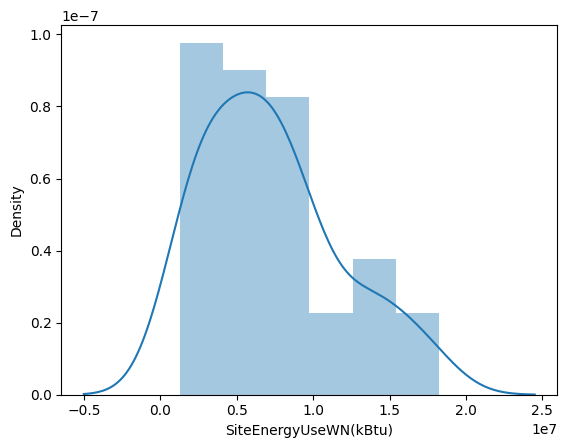

In [184]:

sns.distplot(df1['SiteEnergyUseWN(kBtu)'].dropna())

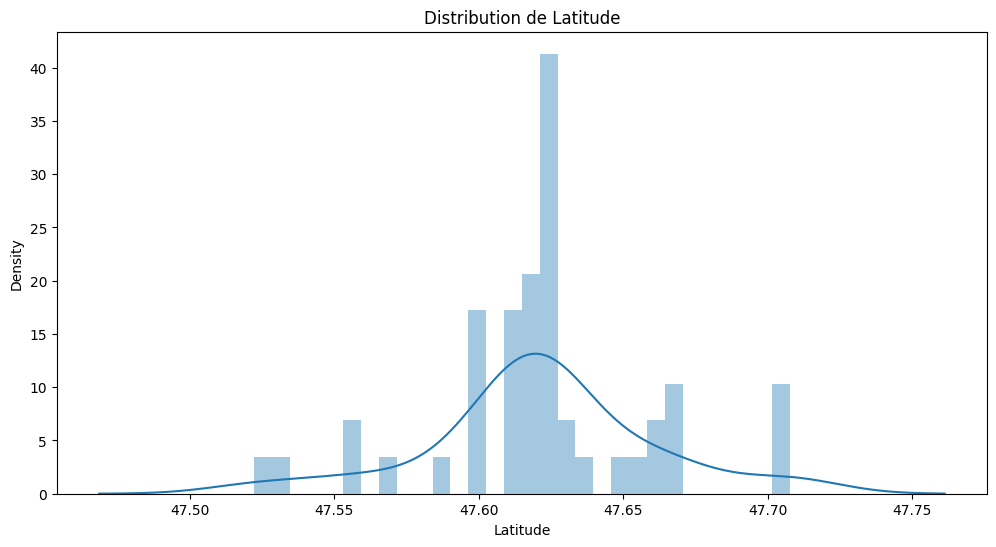

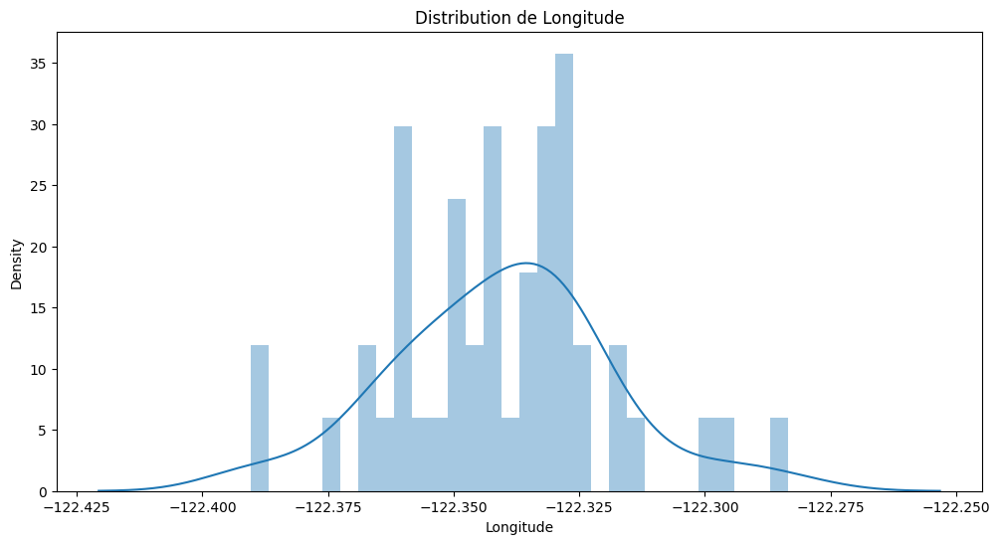

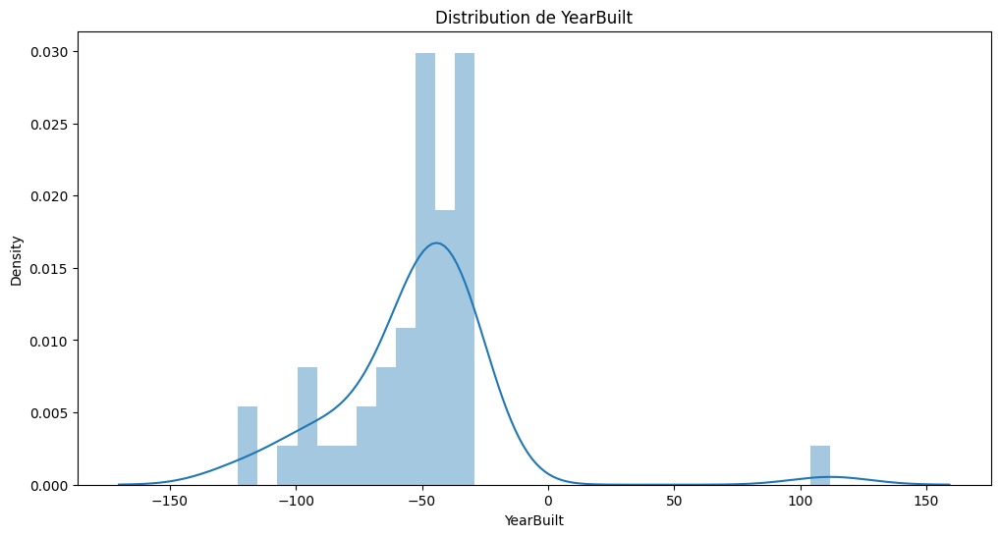

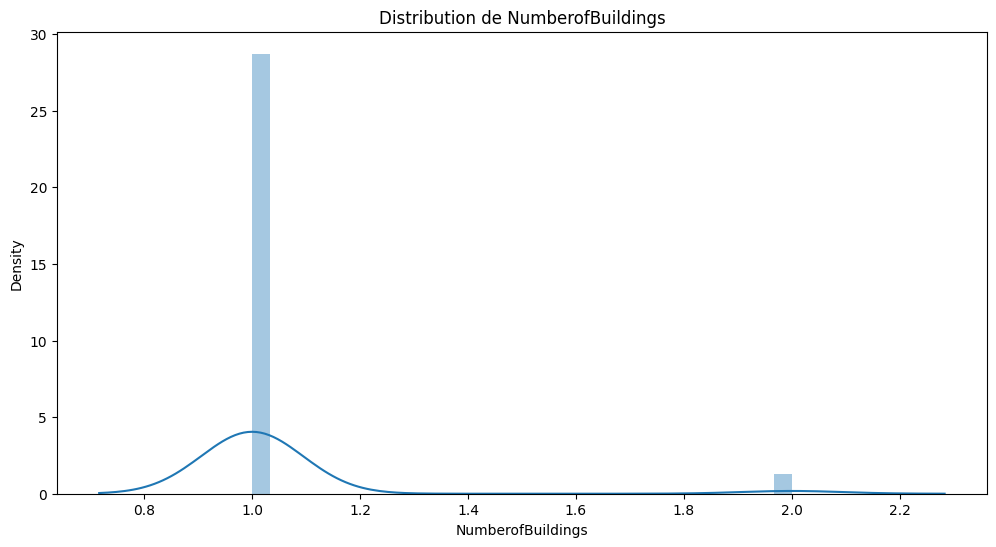

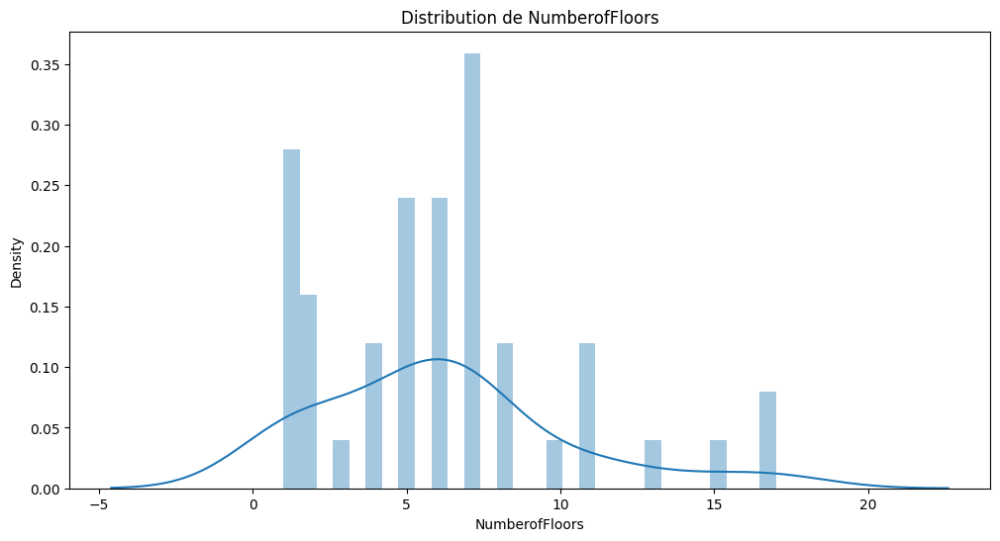

...

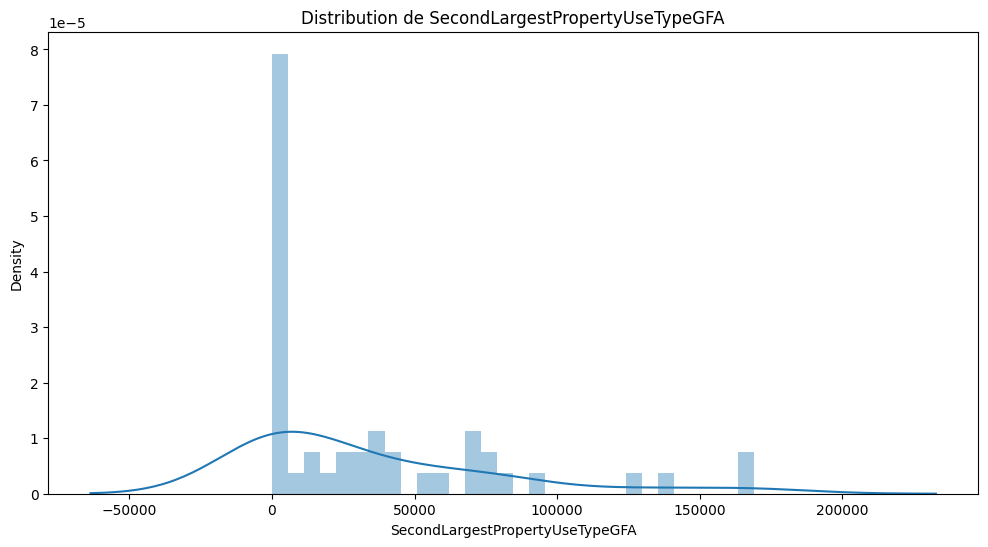

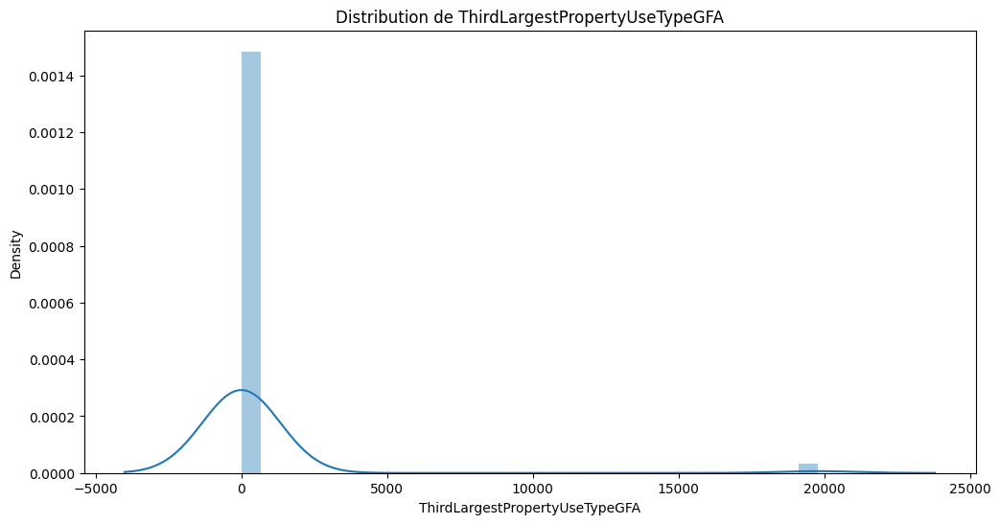

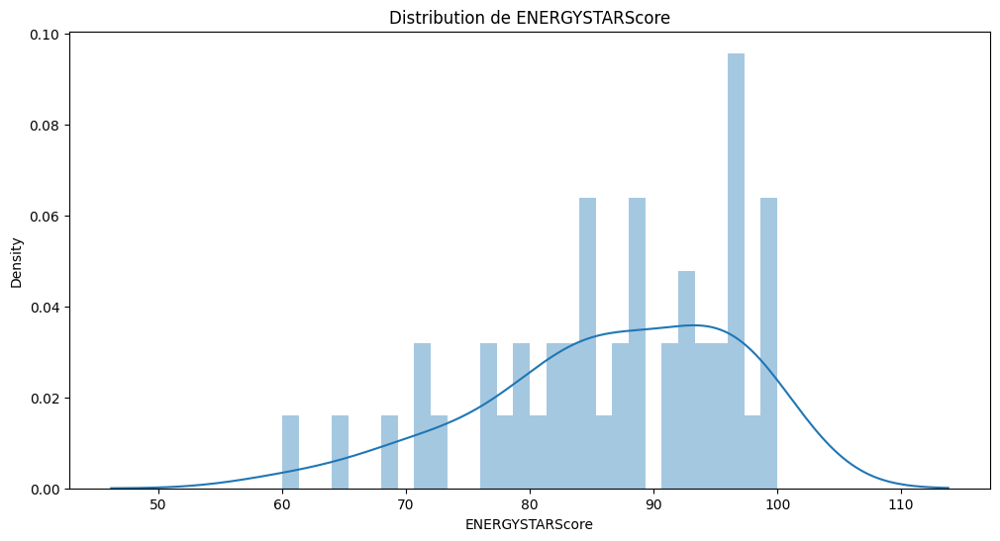

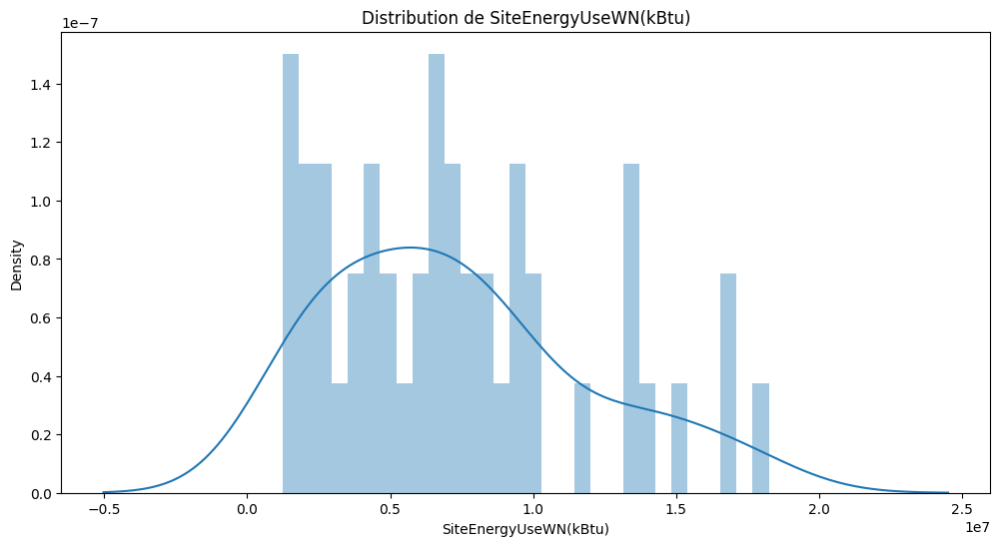

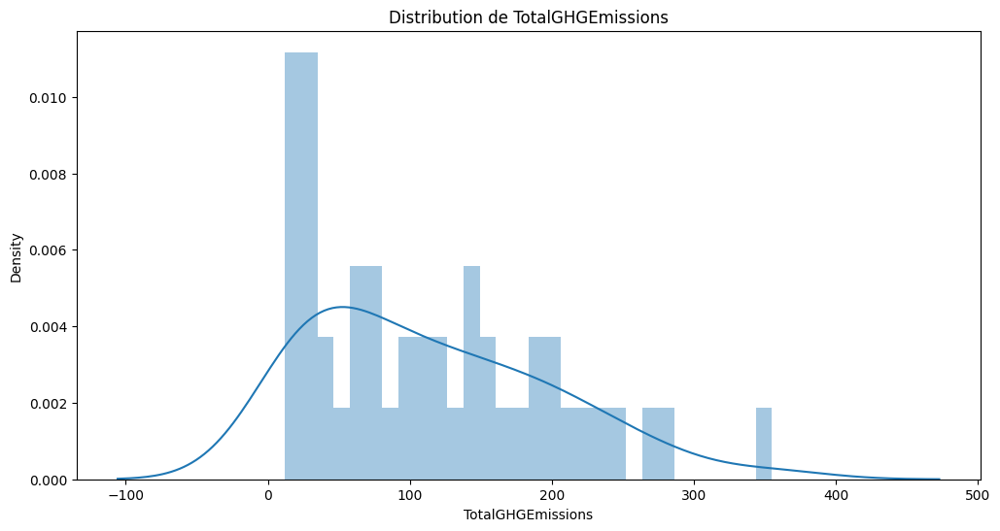

In [185]:
for column in df1.select_dtypes(['int8', 'float32','int32', 'float64']).columns:
    plt.figure(figsize=(12,6))
    plt.title('Distribution de ' + column)
    sns.distplot(df1[column].dropna(), bins=30)

### Boîtes à moustaches

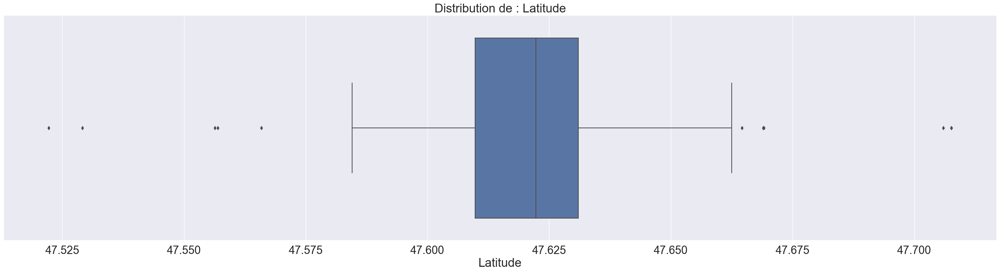

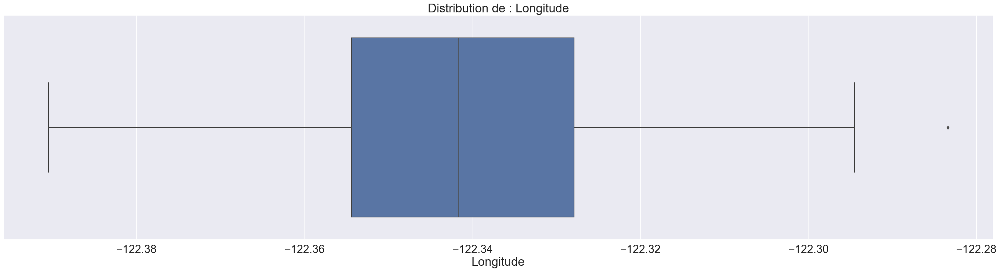

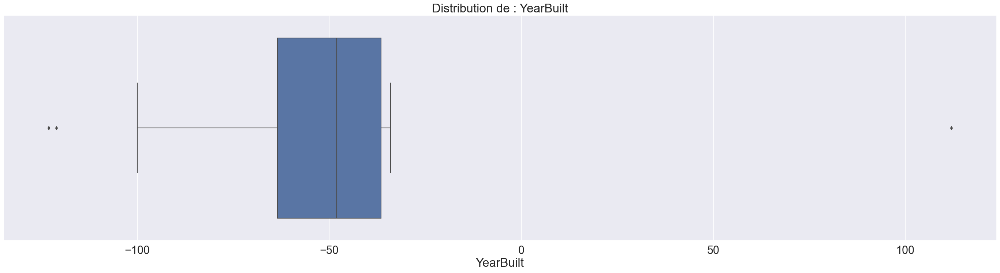

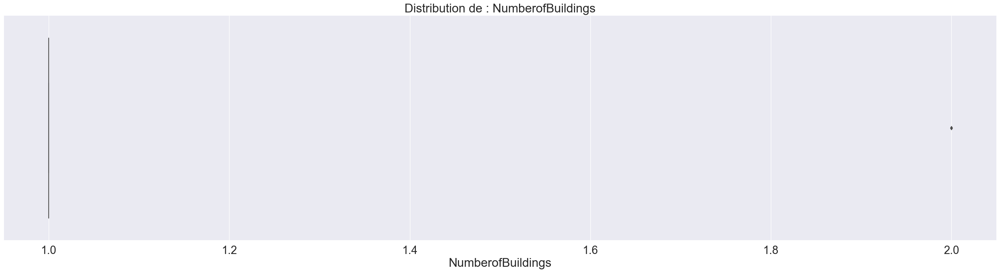

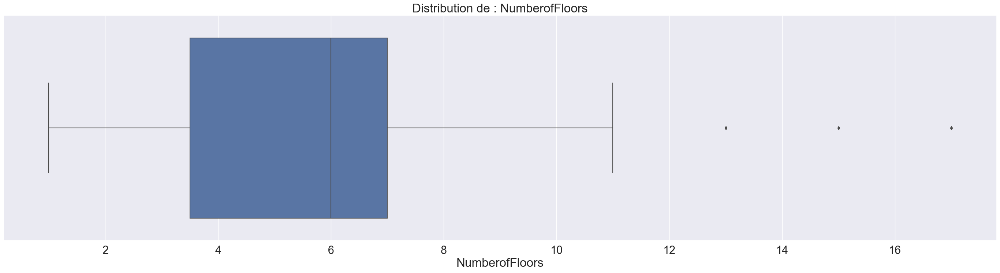

...

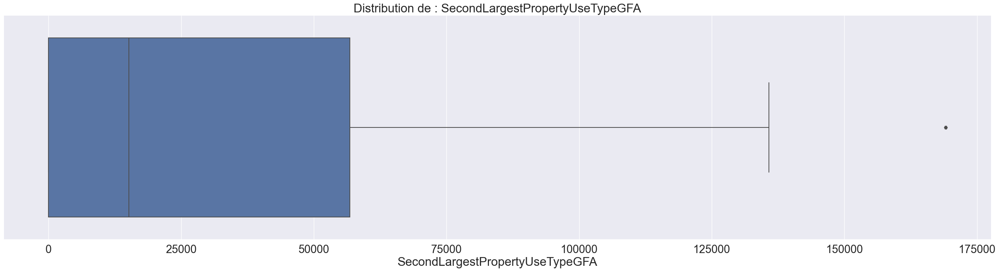

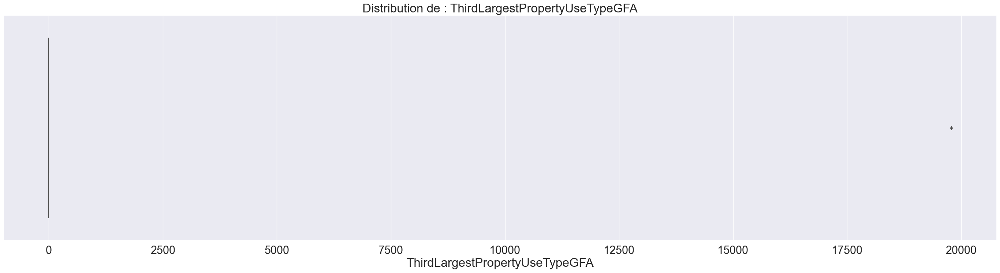

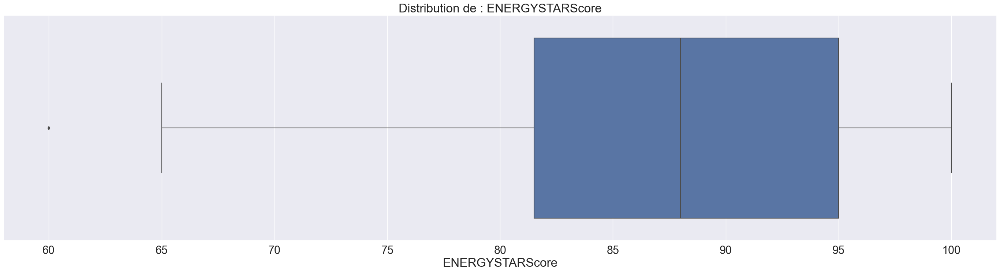

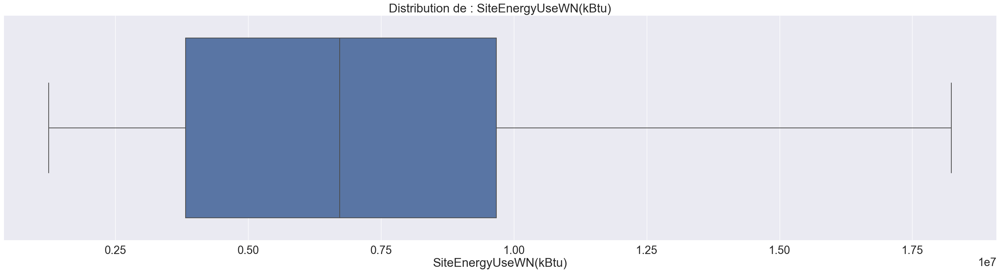

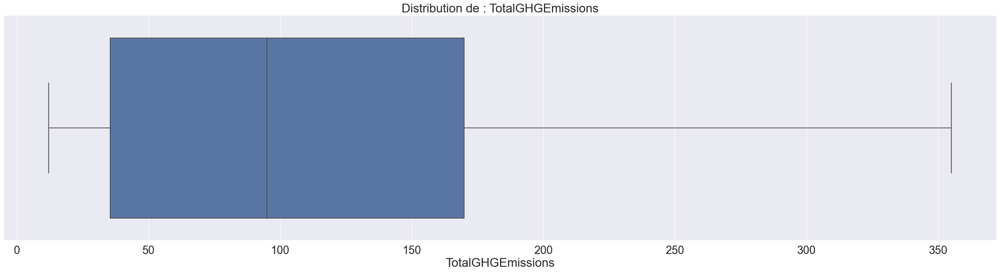

In [186]:
numeric_columns = df1.select_dtypes(include = ['int8','float32','int32','float64']).columns
sns.set(font_scale=2)
for column in numeric_columns:
    plt.figure(figsize = (35,8))
    
    sns.boxplot(x=df1[column])
    chaine = 'Distribution de : ' + column
    plt.title(chaine)
    plt.xlabel(column)
    plt.show()
sns.set(font_scale=1)

In [187]:
df1.columns

Index(['DataYear', 'BuildingType', 'PrimaryPropertyType', 'Address',
       'CouncilDistrictCode', 'Neighborhood', 'Latitude', 'Longitude',
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'ENERGYSTARScore', 'SiteEnergyUseWN(kBtu)',
       'TotalGHGEmissions'],
      dtype='object')

In [188]:
df1.head()

,DataYear,BuildingType,PrimaryPropertyType,Address,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEnergyUseWN(kBtu),TotalGHGEmissions
37,-32,SPS-District K-12,Education,4000 27th Ave. W.,7,MAGNOLIA / QUEEN ANNE,47.656712,-122.390472,-58.0,1.0,2.0,-54.0,0.0,-54.0,Education,54986.0,No Use,0.0,No Use,0.0,2016,97.0,1.802471e+06,31.469999
53,-32,NonResidential,Hotel/Senior Care/Housing,211 Dexter Ave N,7,LAKE UNION,47.620010,-122.342743,-48.0,1.0,7.0,-75.0,-81.0,6.0,Hotel/Senior Care/Housing,107547.0,Leisure,3000.0,No Use,0.0,2014,84.0,6.835264e+06,199.949997
116,-32,SPS-District K-12,Education,17050 30th Ave. N.E.,5,NORTH,47.707630,-122.294533,-37.0,1.0,2.0,-42.0,0.0,-42.0,Education,238550.0,Parking,0.0,No Use,0.0,2016,96.0,9.287467e+06,222.779999
137,-32,SPS-District K-12,Education,2601 SW Kenyon / 2600 SW Thistle,1,DELRIDGE,47.529148,-122.365112,-38.0,1.0,2.0,12.0,0.0,12.0,Education,367884.0,No Use,0.0,No Use,0.0,2016,97.0,1.327934e+07,272.850006
242,-32,NonResidential,Large Office,4311 11th Avenue NE,4,NORTHEAST,47.660648,-122.316887,-46.0,1.0,6.0,-117.0,-40.0,-77.0,Office,95943.0,Parking,42500.0,No Use,0.0,2017201620152014201320112008,88.0,4.426136e+06,30.860001


In [189]:
df1.dtypes

DataYear                           category
BuildingType                       category
PrimaryPropertyType                object  
Address                            object  
CouncilDistrictCode                category
Neighborhood                       category
Latitude                           float32 
Longitude                          float32 
YearBuilt                          float64 
NumberofBuildings                  float32 
NumberofFloors                     float64 
PropertyGFATotal                   float64 
PropertyGFAParking                 float64 
PropertyGFABuilding(s)             float64 
LargestPropertyUseType             category
LargestPropertyUseTypeGFA          float32 
SecondLargestPropertyUseType       category
SecondLargestPropertyUseTypeGFA    float32 
ThirdLargestPropertyUseType        category
ThirdLargestPropertyUseTypeGFA     float32 
YearsENERGYSTARCertified           category
ENERGYSTARScore                    float32 
SiteEnergyUseWN(kBtu)           

In [190]:
id_cols = ['OSEBuildingID', 'TaxParcelIdentificationNumber',
               'CouncilDistrictCode',
               'ListOfAllPropertyUseTypes'] # redondante ?

prop_cols = ['Neighborhood',  'CouncilDistrictCode',
             'BuildingType', 'PrimaryPropertyType',
             'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
             'PropertyGFAParking','PropertyGFABuilding(s)',
             'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
             'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
             'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
             'ENERGYSTARScore']

prop_C_cols = list(df1[prop_cols].select_dtypes('object').columns) # to encode
prop_Q_cols = list(df1[prop_cols].select_dtypes(np.number).columns)

In [191]:
prop_cols += ['BuildingAge', 'MeanGFAperFloor', 'ParkingGFARatio',
              'CertifiedPreviousYear', 'EnergyProfile', 'MainEnergy',
              'NbYearsCertified', 'ExtsurfVolRatio']                                
# prop_Q_cols += ['BuildingAge', 'MeanGFAperFloor',
#                 'ParkingGFARatio', 'NbYearsCertified', 'ExtsurfVolRatio']
# prop_C_cols += ['CertifiedPreviousYear', 'EnergyProfile', 'MainEnergy'] 

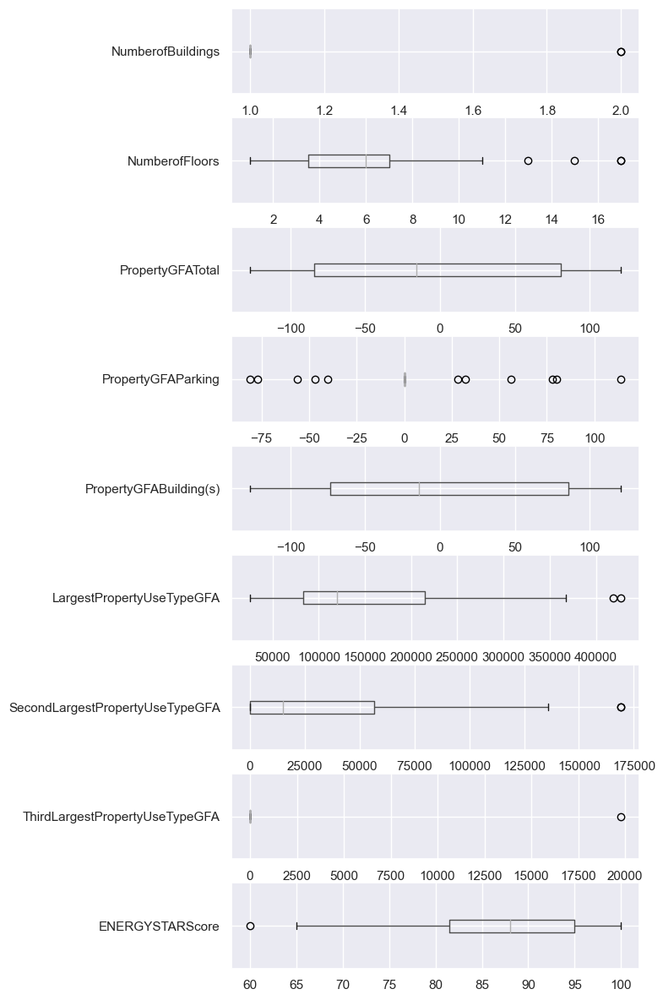

In [192]:
fig, axs = plt.subplots(len(df1[prop_Q_cols].columns),1,
                        figsize=(8, 12), sharey=False)
for c, ax in zip(df1[prop_Q_cols].columns, axs):
    df1.boxplot(c, vert=False, ax=ax)
fig.tight_layout(h_pad=0.051)

plt.show()

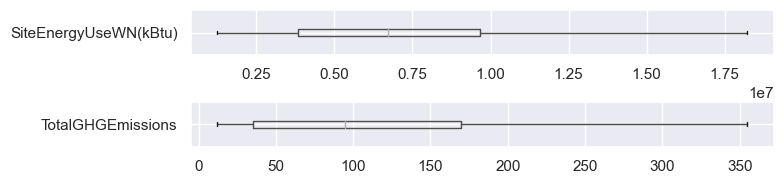

In [193]:
fig, axs = plt.subplots(len(df1[['SiteEnergyUseWN(kBtu)',
                                'TotalGHGEmissions']].columns),1,
                        figsize=(8, 2), sharey=False)
for c, ax in zip(df1[['SiteEnergyUseWN(kBtu)',
                     'TotalGHGEmissions']].columns, axs):
    df1.boxplot(c, vert=False, ax=ax)
fig.tight_layout(h_pad=0.051)

plt.show()

In [194]:
# df['NumberofBuildings'][np.abs(df['NumberofBuildings'].apply(st.zscore))<3]
df1['NumberofBuildings'][np.abs(st.zscore(df1['NumberofBuildings']))>1]

319     2.0
3224    2.0
Name: NumberofBuildings, dtype: float32

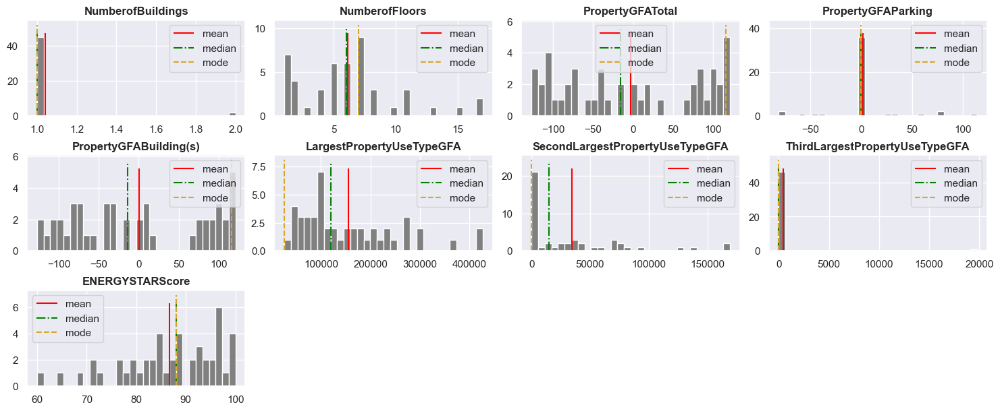

In [195]:
# All the data (with outliers)
plot_histograms(df=df1, cols=prop_Q_cols, file_name='2_1_histograms.png',
                figsize=(15,8), bins=30, layout=(4,4), skip_outliers=False,
                thresh=30, save_enabled=False)

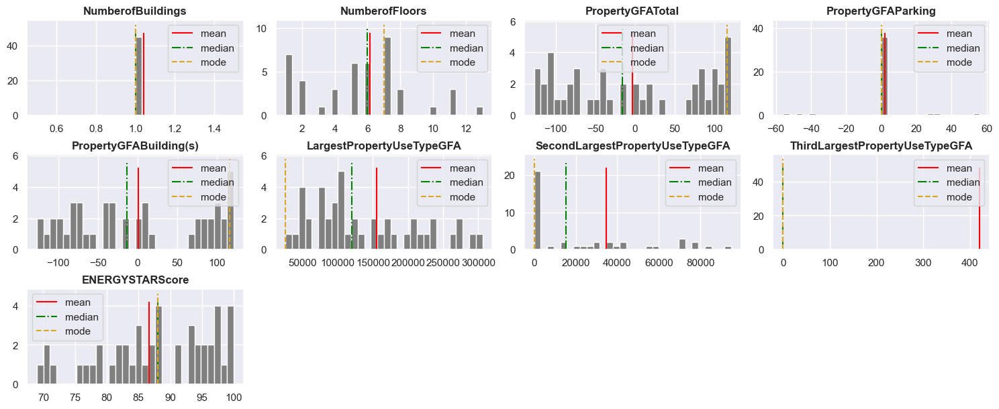

In [196]:
# Excluding outliers to get a better scale
plot_histograms(df=df1, cols=prop_Q_cols, file_name='2_1_histograms.png',
                figsize=(15,8), bins=30, layout=(4,4), skip_outliers=True,
                thresh=2, save_enabled=False)

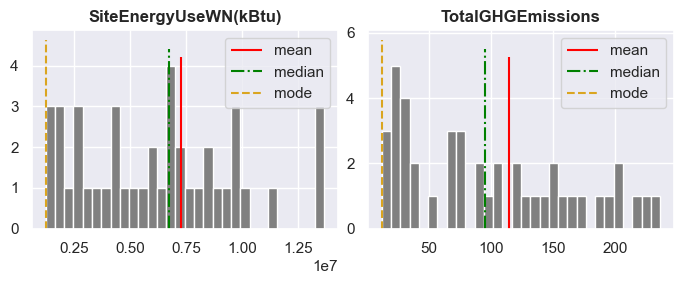

In [197]:
plot_histograms(df=df1, cols=['SiteEnergyUseWN(kBtu)', 'TotalGHGEmissions'],
                file_name='2_1_histograms_target.png',
                figsize=(7,3), layout=(1,2),  skip_outliers=True,
                thresh=1.5, save_enabled=False)

## Analyse multivariée

### Matrice de corrélation

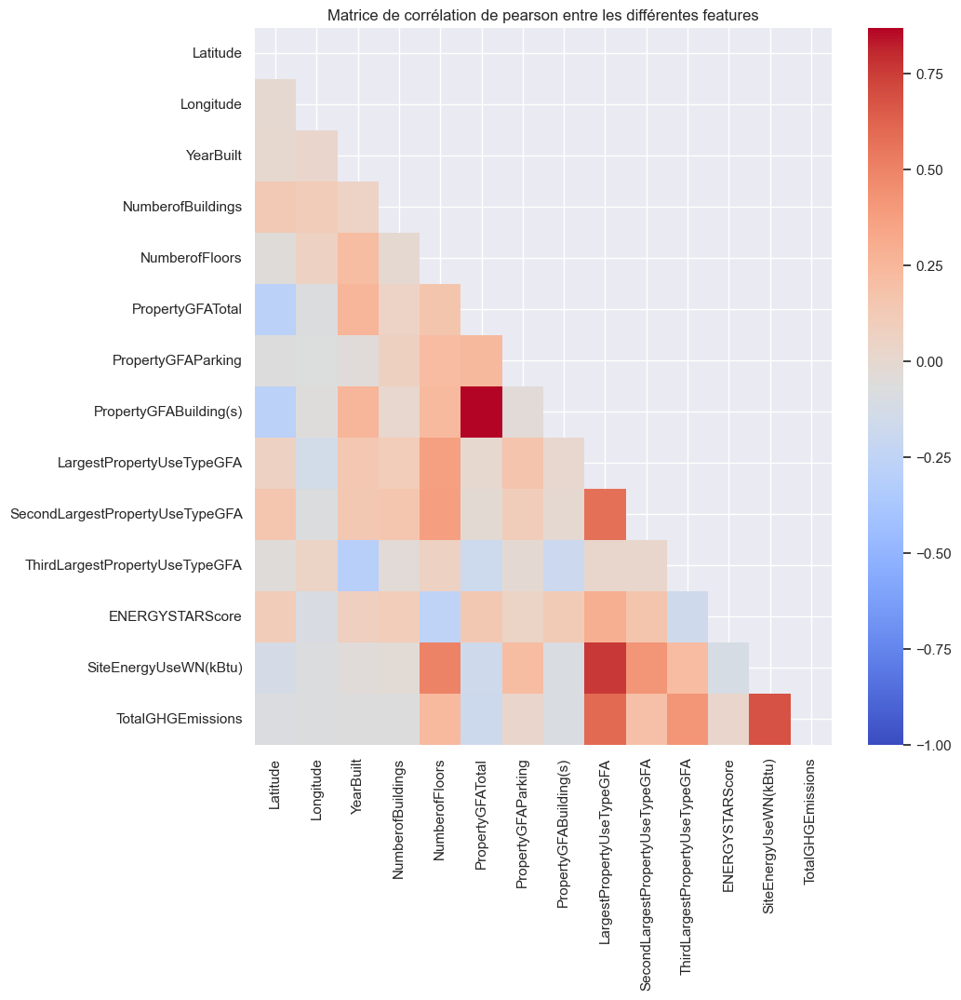

In [198]:
# Créer une figure de taille 10x10 pouces
plt.figure(figsize=(10,10))

# Définir la taille de police des labels
sns.set(font_scale=1)

# Définir le titre du plot
plt.title('Matrice de corrélation de pearson entre les différentes features')

# Calculer la matrice de corrélation de Pearson entre les variables numériques
corr = df1[numeric_columns].corr()

# Créer un masque de la moitié supérieure de la matrice de corrélation
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True 

# Afficher la matrice de corrélation en utilisant un heatmap
ax = sns.heatmap(corr, mask=mask, vmin=-1, cmap='coolwarm')

# Afficher le plot
plt.show()

# Réinitialiser la taille de police des labels
sns.set(font_scale=1)


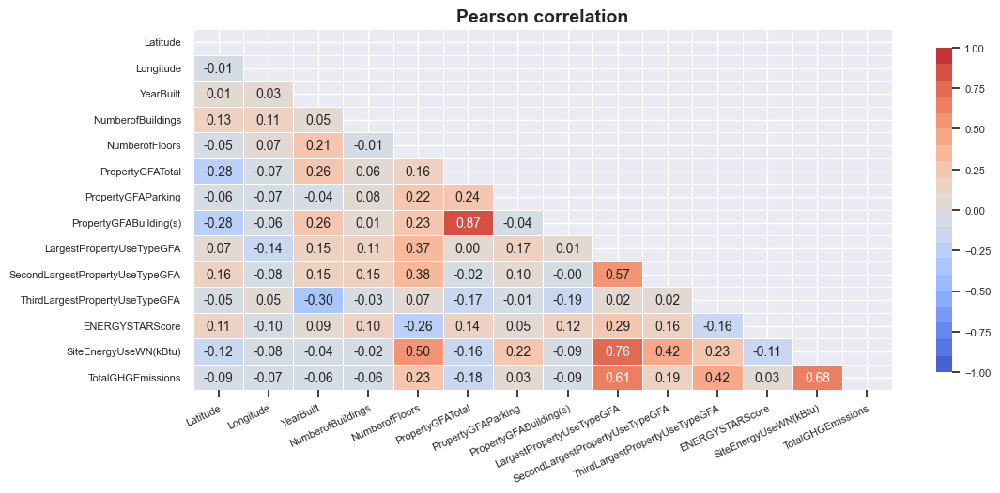

In [199]:
# Linear correlation (Pearson)

pears_corr = df1[numeric_columns].corr()
plot_heatmap(pears_corr, shape='tri',
             title="Pearson correlation", figsize=(12,5))

plt.show()

**Observations**
* Corrélation importante entre : PropertyGFATotal et PropertyGFABuilding(s) / LargestPropertyUseTypeGFA
* Corrélation importante entre PropertyGBABuilding(s) et LargestPropertyUseTypeGFA
* **Corrélation importante entre TotalGHEmissions et SiteEnergyUseWN(kBtu)** (on notera que ce sont les deux variables qu'on cherche à prédire, ce qui laisse présager)

In [200]:
test_couples = [('PropertyGFATotal','PropertyGFABuilding(s)'),
                ('PropertyGFATotal','LargestPropertyUseTypeGFA'),
                ('PropertyGFATotal','NumberofFloors'),
                ('PropertyGFATotal','PropertyGFAParking'),
#                 ('ParkingGFARatio','PropertyGFAParking'),
                ('NumberofFloors','LargestPropertyUseTypeGFA'),
#                 ('MeanGFAperFloor','PropertyGFABuilding(s)'),
                ('SecondLargestPropertyUseTypeGFA','ThirdLargestPropertyUseTypeGFA'),
                ('NumberofFloors','PropertyGFABuilding(s)'),
#                 ('ParkingGFARatio','BuildingAge'),
#                 ('NumberofFloors','BuildingAge'),
#                 ('NumberofBuildings','NbYearsCertified')
               ]

for tup in test_couples:
    print('------'+str(tup).upper()+'-----')
    c1, c2 = tup
    display(correlation_tests(df1[c1], df1[c2], print_opt=False))
del tup

------('PROPERTYGFATOTAL', 'PROPERTYGFABUILDING(S)')-----


,stat,p_value
Pearson,0.869598,2.182389e-15
Spearman,0.862242,6.920406e-15
Kendall,0.768514,3.709072e-14


------('PROPERTYGFATOTAL', 'LARGESTPROPERTYUSETYPEGFA')-----


,stat,p_value
Pearson,0.002222,0.988173
Spearman,0.061591,0.680877
Kendall,0.045497,0.653059


------('PROPERTYGFATOTAL', 'NUMBEROFFLOORS')-----


,stat,p_value
Pearson,0.164114,0.270328
Spearman,0.140267,0.347017
Kendall,0.115189,0.274685


------('PROPERTYGFATOTAL', 'PROPERTYGFAPARKING')-----


,stat,p_value
Pearson,0.240736,0.103094
Spearman,0.255170,0.083445
Kendall,0.192627,0.096430


------('NUMBEROFFLOORS', 'LARGESTPROPERTYUSETYPEGFA')-----


,stat,p_value
Pearson,0.369630,0.010555
Spearman,0.514656,0.000215
Kendall,0.381245,0.000286


------('SECONDLARGESTPROPERTYUSETYPEGFA', 'THIRDLARGESTPROPERTYUSETYPEGFA')-----


,stat,p_value
Pearson,0.015461,0.917849
Spearman,0.089972,0.547553
Kendall,0.078202,0.541716


------('NUMBEROFFLOORS', 'PROPERTYGFABUILDING(S)')-----


,stat,p_value
Pearson,0.232354,0.116034
Spearman,0.234015,0.113376
Kendall,0.180510,0.086805


In [201]:
df1[prop_Q_cols].shape, df1[prop_C_cols].shape

((47, 9), (47, 1))

In [202]:
np.set_printoptions(formatter={'float': '{: 6.2f}'.format})
df_pca = df1.loc[:, prop_Q_cols].dropna(how='any')
id_code = df_pca.index
X = df_pca.values

X_sc = StandardScaler().fit_transform(X)

n_comp = 9
pca = PCA(n_components=n_comp).fit(X_sc)

pca_df = pd.DataFrame(pca.components_,
                      index=['PC'+str(i+1) for i in range(n_comp)],
                      columns=prop_Q_cols).T

X_proj = pca.transform(X_sc)

Tracé des composantes principales

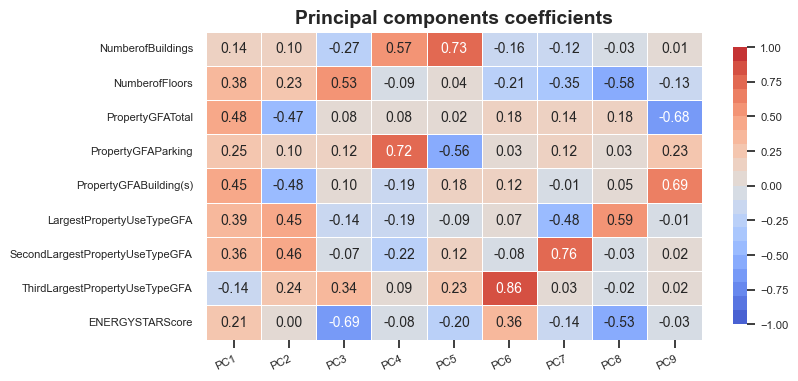

In [203]:
plot_heatmap(pca_df,'Principal components coefficients', vmin=-1, vmax=1, center=0,
             palette=sns.color_palette("coolwarm", 20),figsize=(8,4),shape='rect')

plt.show()

Tracé du rapport de variance expliquée dans un graphe d'éboulis

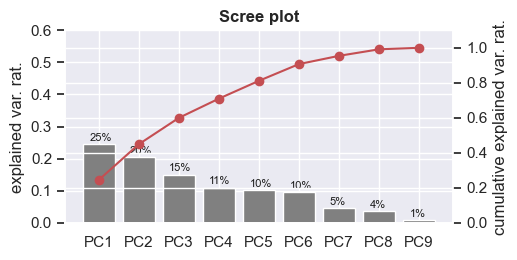

In [204]:
exp_var_rat = pca.explained_variance_ratio_
scree_plot(col_names= pca_df.columns, exp_var_rat=exp_var_rat,
           ylim=(0,0.6), figsize=(5,2.5))
plt.show()

Les 4 premières composantes principales expliquent 78% de la variance des données. Nous pouvons essayer d'utiliser les composants principaux plus tard pour notre modèle.



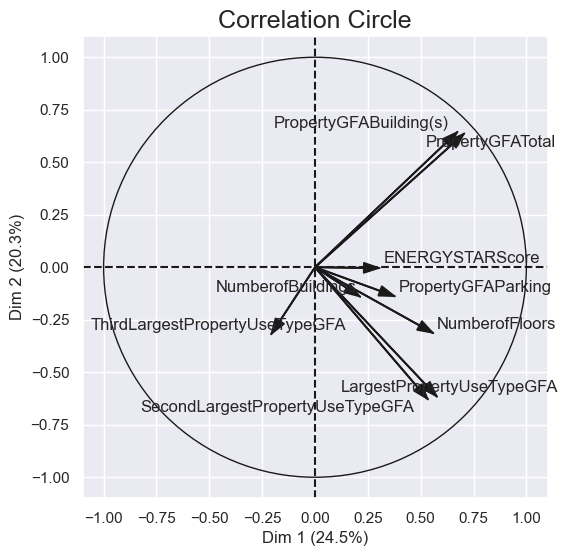

In [206]:
figure, correlation_matrix = \
     plot_pca_correlation_graph(X = X_sc, variables_names = prop_Q_cols,
                                dimensions=(1, 2), figure_axis_size=6)
                                # X_pca = X_proj[:,0:2],
                                # explained_variance = exp_var_rat[0:2])

plt.show()

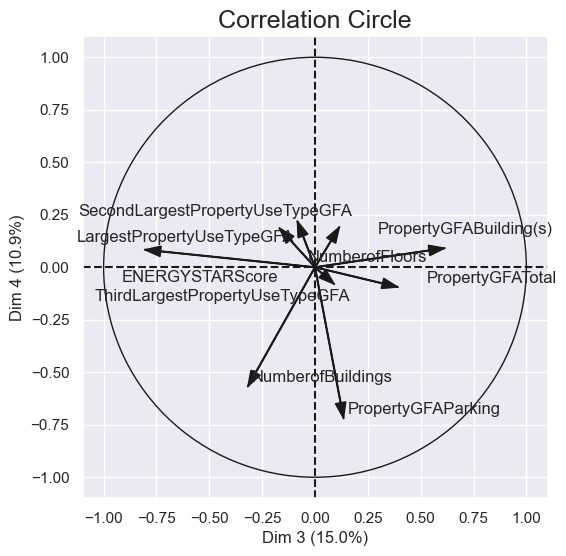

In [207]:
figure, correlation_matrix = \
     plot_pca_correlation_graph(X = X_sc, variables_names = prop_Q_cols,
                                dimensions=(3, 4), figure_axis_size=6)#,
                                # X_pca = X_proj[:,2:4],
                                # explained_variance = exp_var_rat[2:4])

plt.show()

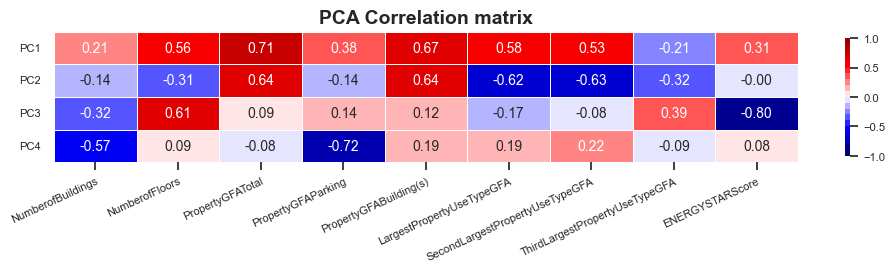

In [208]:
plot_heatmap(correlation_matrix.T,'PCA Correlation matrix',
             vmin=-1, vmax=1, center=0,
             palette=sns.color_palette("seismic", 20),
             figsize=(12,1.7),shape='rect')
plt.gca().set_yticklabels(['PC1', 'PC2', 'PC3', 'PC4'])

plt.show()

### Données catégorielles

#### Diagrammes à barres 

In [209]:
# cols1 = list(df1.select_dtypes('object').columns) # to encode
# # cols2 = ['BuildingAge', 'MeanGFAperFloor', 'ParkingGFARatio',
# #               'CertifiedPreviousYear', 'EnergyProfile', 'MainEnergy',
# #               'NbYearsCertified', 'ExtsurfVolRatio']                                

# # cols = cols1 + cols2 
# plot_barplots(df=df1, cols=cols1, figsize=(12,10),
#               file_name = '2_2_bar_plots.png',
#               layout=(4,3), save_enabled=False)
# plt.show()

### Indépendance des variables

In [210]:
from scipy.stats import chi2_contingency
from scipy.stats import chi2
def test_chi2(serie1, serie2):
    
    alpha = 0.03    
    
    #H0 : les variables sont indépendantes
    
    #print('tableau de contingence :\n', pd.crosstab(serie1.array, serie2.array))
    tab_contingence = pd.crosstab(serie1.array, serie2.array)
    stat_chi2, p, dof, expected_table = chi2_contingency(tab_contingence.values)
    print('chi2 : {},\np : {},\ndof : {}\n'.format(stat_chi2, p, dof))
    print('tableau de contingence : \n', tab_contingence)
    
    critical = chi2.ppf(1-alpha, dof) #
    #print('critital : ', critical)

    if p <= alpha:
        print('Variables non indépendantes (H0 rejetée) car p = {} <= alpha = {}'.format(p, alpha))
        return False
    
    else:
        print('H0 non rejetée car p = {} >= alpha = {}'.format(p, alpha))
        return True
#     def test_chi2(x,y):
#     table = pd.crosstab(x,y)
#     chi2, p, dof, expected = stats.chi2_contingency(table)
#     print('Test du chi2: p-value={}'.format(round(p, 6)))

In [211]:
# x = pd.cut(data['SiteEnergyUseWN(kBtu)'], 20)
df_chi = df1.copy()
x = pd.cut(df_chi['SiteEnergyUseWN(kBtu)'], 20, duplicates='drop')
for column in df_chi.select_dtypes(include = ['int8','float32','int32','float64']).columns:
    print('test d\'indépendance {} / {}'.format('SiteEnergyUseWN(kBtu)',column))
    if df_chi[column].nunique() > 20 :
        y = pd.cut(df_chi[column], 20).astype('category')
    else:
        y = df_chi[column].astype('category')
    test_chi2(x, y)
    #print('__\nX:\nx')
    #print(x)
    #print('__\nX:\nx')
    #print(y)
    

    #table = pd.DataFrame({'nutriscore' : x, column : y})
    #print(table.sample(10))
    print('________________________________________________________________________________________________\n')

test d'indépendance SiteEnergyUseWN(kBtu) / Latitude
chi2 : 158.2419413919414,
p : 0.9641433739332371,
dof : 192

tableau de contingence : 
 col_0                      (47.522, 47.531]  (47.55, 47.559]  \
row_0                                                          
(1228683.161, 2095164.95]  0                 0                 
(2095164.95, 2944656.9]    0                 1                 
(2944656.9, 3794148.85]    0                 0                 
(3794148.85, 4643640.8]    0                 0                 
(4643640.8, 5493132.75]    0                 0                 
(5493132.75, 6342624.7]    0                 0                 
(6342624.7, 7192116.65]    0                 1                 
(7192116.65, 8041608.6]    1                 0                 
(8041608.6, 8891100.55]    0                 0                 
(8891100.55, 9740592.5]    0                 0                 
(9740592.5, 10590084.45]   0                 0                 
(11439576.4, 12289068.35]  

chi2 : 260.28030303030306,
p : 0.008032949086041396,
dof : 208

tableau de contingence : 
 col_0                      (-169.195, 8459.75]  (8459.75, 16919.5]  \
row_0                                                                
(1228683.161, 2095164.95]  5                    0                    
(2095164.95, 2944656.9]    3                    0                    
(2944656.9, 3794148.85]    0                    0                    
(3794148.85, 4643640.8]    2                    0                    
(4643640.8, 5493132.75]    0                    2                    
(5493132.75, 6342624.7]    1                    0                    
(6342624.7, 7192116.65]    5                    0                    
(7192116.65, 8041608.6]    1                    0                    
(8041608.6, 8891100.55]    1                    0                    
(8891100.55, 9740592.5]    1                    0                    
(9740592.5, 10590084.45]   0                    0                    

In [212]:
import pandas as pd
import numpy as np
import scipy.stats as stats

def test_chi2(x,y):
    table = pd.crosstab(x,y)
    chi2, p, dof, expected = stats.chi2_contingency(table)
    print('Test du chi2: p-value={}'.format(round(p, 6)))

df_chi = df1.copy()
x = pd.cut(df_chi['SiteEnergyUseWN(kBtu)'], 20, duplicates='drop')
for column in df_chi.select_dtypes(include=['int8', 'float32', 'int32', 'float64']).columns:
    print('Test d\'indépendance {} / {}'.format('SiteEnergyUseWN(kBtu)', column))
    if df1[column].nunique() > 20:
        y = pd.cut(df_chi[column], 20, duplicates='drop').astype('category')
    else:
        y = df_chi[column].astype('category')
    test_chi2(x, y)


Test d'indépendance SiteEnergyUseWN(kBtu) / Latitude
Test du chi2: p-value=0.964143
Test d'indépendance SiteEnergyUseWN(kBtu) / Longitude
Test du chi2: p-value=0.934269
Test d'indépendance SiteEnergyUseWN(kBtu) / YearBuilt
Test du chi2: p-value=0.591551
Test d'indépendance SiteEnergyUseWN(kBtu) / NumberofBuildings
Test du chi2: p-value=0.302971
Test d'indépendance SiteEnergyUseWN(kBtu) / NumberofFloors
Test du chi2: p-value=0.000252
Test d'indépendance SiteEnergyUseWN(kBtu) / PropertyGFATotal
Test du chi2: p-value=0.073863
Test d'indépendance SiteEnergyUseWN(kBtu) / PropertyGFAParking
Test du chi2: p-value=0.107521
Test d'indépendance SiteEnergyUseWN(kBtu) / PropertyGFABuilding(s)
Test du chi2: p-value=0.008245
Test d'indépendance SiteEnergyUseWN(kBtu) / LargestPropertyUseTypeGFA
Test du chi2: p-value=0.095745
Test d'indépendance SiteEnergyUseWN(kBtu) / SecondLargestPropertyUseTypeGFA
Test du chi2: p-value=0.008033
Test d'indépendance SiteEnergyUseWN(kBtu) / ThirdLargestPropertyUseType

## Transformation variable de prédiction

<Axes: title={'center': 'Distribution de la variable cible de base'}, xlabel='SiteEnergyUseWN(kBtu)', ylabel='Density'>

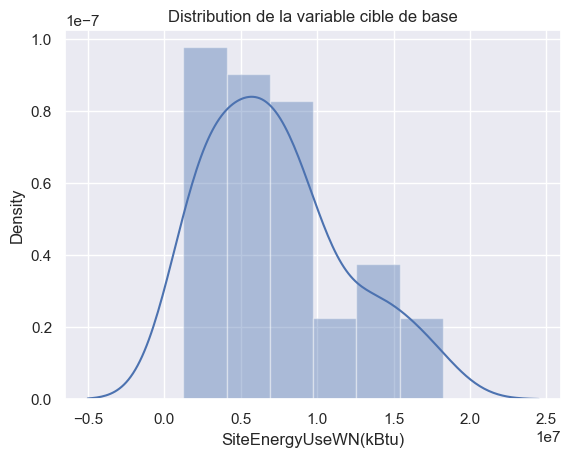

In [213]:
plt.title('Distribution de la variable cible de base')
sns.distplot(df1['SiteEnergyUseWN(kBtu)'])

In [214]:
# transformer la variable SiteEnergyUseWN afin de suivre une loi normal ( plus facile de modeliser une loi normal qu'une autre )
test = np.log(df1['SiteEnergyUseWN(kBtu)'])
test1p = np.log1p(df1['SiteEnergyUseWN(kBtu)'])
test2 = np.log2(df1['SiteEnergyUseWN(kBtu)'])
test2p = np.log2(1+df1['SiteEnergyUseWN(kBtu)'])

Pour avoir un bon algorithme, on va modifier l'allure de la distribution pour obtenir une variable dont la distribution se rapproche d'une loi normale

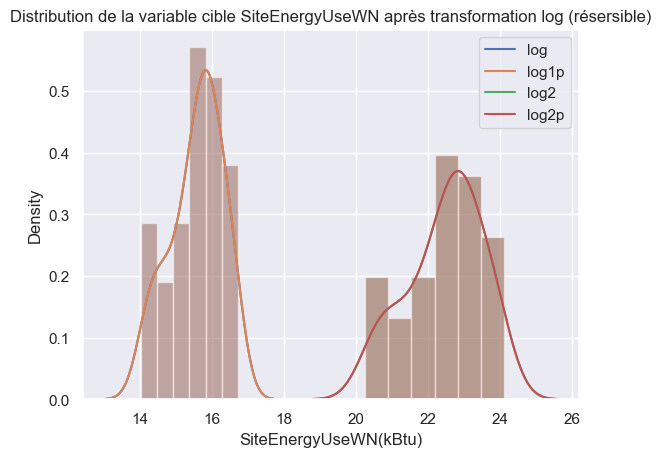

In [215]:
plt.title('Distribution de la variable cible SiteEnergyUseWN après transformation log (résersible)')
sns.distplot(test)
sns.distplot(test1p)
sns.distplot(test2)
sns.distplot(test2p)
ax = plt.gca()
ax.legend(['log','log1p', 'log2', 'log2p'])

On va conserver la variable après la transformation log2 : 

In [216]:
df1['Log2-SiteEnergyUseWN(kBtu)'] = test2p 
# transformer la variable afin de suivre une loi normal ( plus facile de modeliser une loi normal qu'une autre )

In [217]:
print_null_pct(df1)

nb of null:  0 
pct of null:  0.0


In [218]:
# transformer la variable SiteEnergyUseWN afin de suivre une loi normal ( plus facile de modeliser une loi normal qu'une autre )
test_tge = np.log(df1['TotalGHGEmissions'])
test1p_tge = np.log1p(df1['TotalGHGEmissions'])
test2_tge = np.log2(df1['TotalGHGEmissions'])
test2p_tge = np.log2(1+df1['TotalGHGEmissions'])

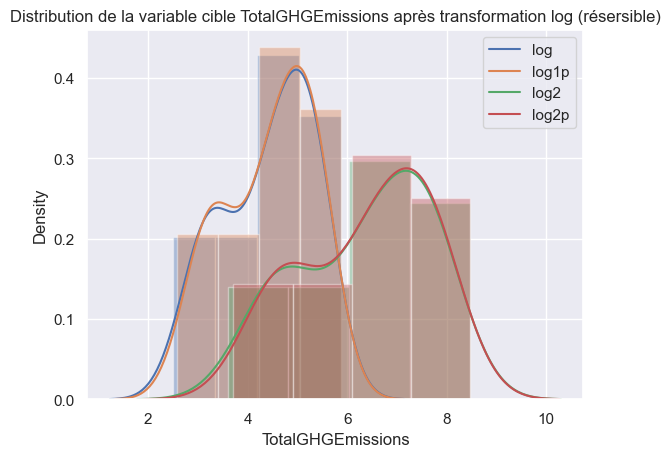

In [220]:
plt.title('Distribution de la variable cible TotalGHGEmissions après transformation log (résersible)')
sns.distplot(test_tge)
sns.distplot(test1p_tge)
sns.distplot(test2_tge)
sns.distplot(test2p_tge)
ax = plt.gca()
ax.legend(['log','log1p', 'log2', 'log2p'])

In [221]:
df1['Log2-TotalGHGEmissions'] = test2p 
# transformer la variable afin de suivre une loi normal ( plus facile de modeliser une loi normal qu'une autre )

# Export des données nettoyées 

In [222]:
data.to_csv('data/data_cleaned2.csv', index=False)

# Pipeline d'importation des données et préparation des features

## Fonctions élémentaires

In [223]:
# def import_data(data_path):
#     '''Importe les deux jeux de données à partir de fichier csv, aligne les colonnes pour les assembler en un seul dataframe'''
#     try:
#         data_2016 = pd.read_csv(data_path)        
#     except Exception as e:
#         print('Erreur :', str(e))
#         import traceback
#         print(traceback.format_exc())
#     try:
#         data_2016 = transform_columns(data_2016)    
#     except Exception as e:
#         print('Erreur :', str(e))
#         import traceback
#         print(traceback.format_exc())
 
    
#     data_2016['DefaultData'] = data_2016['DefaultData'].map({'Yes' : True, 'No' : False}).head()
#     data_2016[['Latitude','Longitude', 'ZipCode']] = data_2016[['Latitude','Longitude', 'ZipCode']].astype('float64')
#     data_2016['TotalGHGEmissions'] = data_2016['GHGEmissions(MetricTonsCO2e)']
    
#     data_2016['GHGEmissionsIntensity'] = data_2016['GHGEmissionsIntensity(kgCO2e/ft2)']
#     data_2016.drop(['GHGEmissions(MetricTonsCO2e)', 'GHGEmissionsIntensity(kgCO2e/ft2)'], axis=1, inplace=True)
#     data_2016.drop(['Zip Codes'], axis=1, inplace=True)
    
#     return data_2016.reset_index()

# Définition de la fonction pour importer les données
def import_data(data_path):
    '''Importe les deux jeux de données à partir de fichier csv, aligne les colonnes pour les assembler en un seul dataframe'''
    try:
        # Importation du jeu de données 2016 à partir du fichier csv
        data_2016 = pd.read_csv(data_path)        
    except Exception as e:
        # En cas d'erreur lors de l'importation, afficher l'erreur et la trace de la pile
        print('Erreur :', str(e))
        import traceback
        print(traceback.format_exc())
    print(data_2016.dtypes)
#     try:
#         # Transformation des noms de colonnes pour les uniformiser
#         data_2016 = transform_columns(data_2016)    
#     except Exception as e:
#         # En cas d'erreur lors de la transformation des noms de colonnes, afficher l'erreur et la trace de la pile
#         print('Erreur :', str(e))
#         import traceback
#         print(traceback.format_exc())
        
#     data_2016 = pd.read_csv(data_path)   
#     data_2016 = transform_columns(data_2016)      
    # Conversion des données de la colonne 'DefaultData' en booléen
    data_2016['DefaultData'] = data_2016['DefaultData'].map({'Yes' : True, 'No' : False}).head()
    # Conversion des données de certaines colonnes en float64
#     data_2016[['Latitude','Longitude', 'ZipCode']] = data_2016[['Latitude','Longitude', 'ZipCode']].astype('float64')
    numeric_cols = ['Latitude', 'Longitude', 'ZipCode']
    for col in numeric_cols:
        try:
            pd.to_numeric(data_2016[col])
        except ValueError:
            print(f"La colonne {col} n'est pas numérique")

    # Réinitialisation de l'index
    return data_2016.reset_index()



In [224]:
path_2016 = 'data/2016_Building_Energy_Benchmarking.csv'
data_cleaned = import_data(path_2016)

OSEBuildingID                      int64  
DataYear                           int64  
BuildingType                       object 
PrimaryPropertyType                object 
PropertyName                       object 
Address                            object 
City                               object 
State                              object 
ZipCode                            float64
TaxParcelIdentificationNumber      object 
CouncilDistrictCode                int64  
Neighborhood                       object 
Latitude                           float64
Longitude                          float64
YearBuilt                          int64  
NumberofBuildings                  float64
NumberofFloors                     int64  
PropertyGFATotal                   int64  
PropertyGFAParking                 int64  
PropertyGFABuilding(s)             int64  
ListOfAllPropertyUseTypes          object 
LargestPropertyUseType             object 
LargestPropertyUseTypeGFA          float64
SecondLarge

In [225]:
def transform_columns(dataframe):
    '''Récupère les informations contenues dans la colonne Location pour les ajouter dans des nouvelles colonnes du dataframe.
    La fonction renvoie le dataframe avec les nouvelles colonnes et l'ancienne purgée.
    '''
    print(dataframe.columns)
    
    # Création d'un dataframe vide pour stocker les informations de localisation
    location = pd.DataFrame()
    
    # Pour chaque ligne, on récupère les informations de localisation et on les ajoute au dataframe 'location'
    for building_id in dataframe['OSEBuildingID']:
        # Récupération des informations de localisation à partir de l'identifiant du bâtiment
        loc_info = location.get(building_id, {})
        
        # Ajout des informations de localisation au dataframe 'location'
        location = pd.concat([location,
                             pd.DataFrame({
                       'OSEBuildingID' : building_id,
                       'Address' : loc_info.get('address', ''),
                       'City' : loc_info.get('city', ''),
                       'State' : loc_info.get('state', ''),
                       'ZipCode' : loc_info.get('zip', ''),
                       'Latitude' : loc_info.get('latitude', ''),
                       'Longitude': loc_info.get('longitude', '') }, index=[0])],
                             axis=0)
    
    # Jointure du dataframe 'dataframe' avec le dataframe 'location' en utilisant les colonnes 'OSEBuildingID' et 'Building_id'
    # Suppression des colonnes 'Building_id'
    return pd.merge(dataframe, location, on='OSEBuildingID')


In [226]:
data_2016 = pd.read_csv('data/2016_Building_Energy_Benchmarking.csv')

data_test = transform_columns(data_2016)
data_test.head(1)

print(data_test.columns)

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'Address', 'City', 'State', 'ZipCode',
       'TaxParcelIdentificationNumber', 'CouncilDistrictCode', 'Neighborhood',
       'Latitude', 'Longitude', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'DefaultData', 'Comments', 'ComplianceStatus',
       'Outlier

In [227]:
def clean_values(dataframe):
    '''Nettoyages divers des valeurs du jeu de données : données proches ou manquantes / incohérentes'''
    dataframe['PrimaryPropertyType'] = dataframe['PrimaryPropertyType'].str.replace('\n','')
    dataframe['City'].replace('SEATTLE', 'Seattle', inplace=True)
    dataframe['ComplianceStatus'].replace('Missing Data', np.nan, inplace=True)
    dataframe['ComplianceStatus'].replace('Error - Correct Default Data', np.nan, inplace=True)
    dataframe['ComplianceStatus'].replace('Not Compliant', 'Non-Compliant', inplace=True)
    dataframe['Neighborhood'].replace('Central', 'CENTRAL', inplace=True)
    dataframe['Neighborhood'].replace('Ballard', 'BALLARD', inplace=True)
    dataframe['Neighborhood'].replace('North', 'NORTH', inplace=True)
    dataframe['Neighborhood'].replace('Northwest', 'NORTHWEST', inplace=True)
    dataframe['Neighborhood'].replace('DELRIDGE NEIGHBORHOODS', 'DELRIDGE', inplace=True)
    dataframe['Neighborhood'].replace('Delridge', 'DELRIDGE', inplace=True)
    dataframe['Outlier'].replace('Low outlier', 'Low Outlier', inplace=True)
    dataframe['Outlier'].replace('High outlier', 'High Outlier', inplace=True)
    dataframe[dataframe['NumberofBuildings'] == 0]['NumberofBuildings'] = 1

    return dataframe

In [228]:
from sklearn.neighbors import KDTree

def delete_univariate_outliers(dataframe):
    '''Suppression des valeurs extrêmes du dataset - on exclut le centile le plus extreme
    suppression des données négatives et des valeurs supérieures à 100 g pour les indices ramenés à 100 g'''
    #valeurs extremes
    index_nan = []
    index_nan_flat = []
    for column in dataframe.select_dtypes(include = ['int8', 'float32','int32','float64']).columns.tolist() :
        index_nan.append(dataframe.loc[dataframe[column] > dataframe[column].quantile(0.995)].index.tolist())
        index_nan.append(dataframe.loc[dataframe[column] < dataframe[column].quantile(0.005)].index.tolist())

    for sublist in index_nan:
        for item in sublist:
            index_nan_flat.append(item)
                
    #suppression des doublons
    index_nan_flat = list(dict.fromkeys(index_nan_flat))
    dataframe[column].loc[index_nan_flat] = np.nan

            
    return dataframe

def delete_multivariate_outliers(dataframe):
    '''Suppression des outliers éloignés de leurs plus proches voisins (discrimination du centile 
    le plus éloigné par la distance de minkowski de chaque observation à ses 3 plus proches voisins)'''

    numeric_data = dataframe.select_dtypes(['int8', 'float32','int32', 'float64']).copy().dropna(axis=0).dropna(axis=1)
    print(numeric_data.shape)
    kdt = KDTree(numeric_data, leaf_size = 40, metric='minkowski')
    dist, ind = kdt.query(numeric_data, k=3, return_distance=True)

    numeric_data['3N_distance'] = np.sum(dist, axis=1)    
    numeric_data = numeric_data[numeric_data['3N_distance'] < numeric_data['3N_distance'].quantile(0.99)]
    index_to_drop = numeric_data.index.tolist()
    dataframe = dataframe.drop(index_to_drop, axis=0)

    return dataframe

def clean_outliers(dataframe):
    print('........Suppression des outliers univariés')
    dataframe = delete_univariate_outliers(dataframe)
    print('........Suppression des outliers multivariés')
    dataframe = delete_multivariate_outliers(dataframe)
    return dataframe
    


In [229]:
def completion_nan(dataframe):
    '''Remplace les NaN par des valeurs définies quand applicable'''
    
    dataframe['Outlier'] = dataframe['Outlier'].astype('object')
    dataframe['Outlier'].fillna('Normal', inplace=True)
    dataframe['Outlier'] = dataframe['Outlier'].astype('category')
    dataframe[['ThirdLargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA']] = dataframe[['ThirdLargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA']].fillna(0, )
    dataframe[['ThirdLargestPropertyUseType', 'SecondLargestPropertyUseType']] = dataframe[['ThirdLargestPropertyUseType', 'SecondLargestPropertyUseType']].fillna('No Use')
    dataframe['LargestPropertyUseType'] = dataframe['LargestPropertyUseType'].fillna('No information')
    
    
    index_to_fill = dataframe[(dataframe['LargestPropertyUseTypeGFA'].isna()) & (dataframe['SecondLargestPropertyUseTypeGFA'] == 0)]['LargestPropertyUseTypeGFA'].index.tolist()
    dataframe.loc[index_to_fill, 'LargestPropertyUseTypeGFA'] = dataframe.loc[index_to_fill, 'PropertyGFABuilding(s)']
    
    return dataframe

In [230]:
def clean_categories(dataframe):
    '''Regroupe les contenu des colonnes ci-dessous dans des categories prédéfinies '''
    property_use_types_columns = ['SecondLargestPropertyUseType',
                         'LargestPropertyUseType',
                         'ThirdLargestPropertyUseType',
                         'PrimaryPropertyType']
    
    usetype_dict = {
                'Retail Store' : 'Retail',
                'Supermarket/Grocery Store' : 'Retail',
                'Repair Services (Vehicle, Shoe, Locksmith, etc)' : 'Retail',
                'Automobile Dealership': 'Retail',
                'Convenience Store without Gas Station': 'Retail',
                'Personal Services': 'Retail',
                'Enclosed Mall': 'Retail',
                'Strip Mall': 'Retail',
                'Wholesale Club/Supercenter': 'Retail',
                'Other - Mall': 'Retail',
                'Supermarket / Grocery Stor': 'Retail',
                'Retail (Health/Beauty, Dry Cleaning, etc)' : 'Retail',
                'Retaile' : 'Retail',
                
                'Food Sales': 'Leisure',
                'Restaurant' : 'Leisure',
                'Other - Restaurant/Bar' : 'Leisure',
                'Food Service': 'Leisure' ,
                'Worship Facility': 'Leisure',
                'Other - Recreation': 'Leisure',
                'Other - Entertainment/Public Assembly': 'Leisure',
                'Performing Arts': 'Leisure',
                'Bar/Nightclub': 'Leisure',
                'Movie Theater': 'Leisure',
                'Museum': 'Leisure',
                'Social/Meeting Hall': 'Leisure',
                'Fitness Center/Health Club/Gym': 'Leisure',
                'Lifestyle Center ': 'Leisure',
                'Fast Food Restaurant': 'Leisure',
                'Other - Leisure/Bar' : 'Leisure',
                'Lifestyle Center' : 'Leisure',
                'Fast Food Leisure' : 'Leisure',
        
                
                'Hotel' : 'Residence/Hotel/Senior Care/Housing',
                'Mid-Rise Multifamily' : 'Residence/Hotel/Senior Care/Housing',
                'Low-Rise Multifamily' : 'Residence/Hotel/Senior Care/Housing',
                'Mixed Use Property' : 'Residence/Hotel/Senior Care/Housing',
                'Multifamily Housing' : 'Residence/Hotel/Senior Care/Housing',
                'Other - Lodging/Residential': 'Residence/Hotel/Senior Care/Housing',
                'Residence Hall/Dormitory': 'Residence/Hotel/Senior Care/Housing',
                'Senior Care Community' :'Residence/Hotel/Senior Care/Housing',
                'Residential Care Facility' : 'Residence/Hotel/Senior Care/Housing',
                'High-Rise Multifamily': 'Residence/Hotel/Senior Care/Housing',
                'Prison/Incarceration': 'Residence/Hotel/Senior Care/Housing',
                'Residence Hall': 'Residence/Hotel/Senior Care/Housing',
                
                'Medical Office' : 'Health',
                'Urgent Care/Clinic/Other Outpatient' : 'Health',
                'Laboratory' : 'Health',
                'Hospital (General Medical & Surgical)' : 'Health',
                'Health (General Medical & Surgical)' : 'Health',
                'Other/Specialty Hospital' : 'Health',
                'Outpatient Rehabilitation/Physical Therapy' : 'Health',
                'Hospital' : 'Health',
        
                'Small- and Mid-Sized Office' : 'Offices',
                'Other - Services' : 'Offices',
                'Bank Branch' : 'Offices',
                'Financial Office' : 'Offices',
                'Other - Public Services': 'Offices',
                'Police Station' : 'Offices',
                'Courthouse' : 'Offices',
                'Large Office' : 'Offices',
                'Offices' : 'Office',

                'K-12 School' : 'Education',
                'SPS-District K-12' : 'Education',
                'Other - Education': 'Education',
                'Vocational School' : 'Education', 
                'Adult Education' : 'Education',
                'Pre-school/Daycare': 'Education',
                'University': 'Education',
                'College/University': 'Education',
                'Library': 'Education',
                'College/Education' : 'Education',
        
                 'Self-Storage Facility' : 'Storage',
                 'Non-Refrigerated Warehouse' : 'Storage',
                 'Distribution Center' : 'Storage',
        
                'Data Center' : 'Facility',
                'Manufacturing/Industrial Plant' : 'Facility',
                'Refrigerated Warehouse' : 'Facility',
                
                'Fire Station' : 'Other',
                'Other - Utility' : 'Other',
                'No information' : 'Other',
                'Swimming Pool' : 'Other',
                'No Use' : 'Other',
                'Repair Services (Vehicle, Shoe, Locksmith, etc)' : 'Other'
               }
    
    
    for column in property_use_types_columns:
        dataframe[column] = dataframe[column].astype('object')
        dataframe[column] = dataframe[column].replace(usetype_dict, regex=False)
        #dataframe[column] = dataframe[column].map(usetype_dict)
        
        dataframe[column] = dataframe[column].astype('category')

    return dataframe


In [231]:
def clean_nan(dataframe):
    '''Suppression des colonnes qui comportent trop de NaN et des lignes non informatives pour notre problématique'''
    dataframe.dropna(how = 'all', axis=0, inplace=True)
    print(dataframe.shape)
    dataframe.drop(dataframe[dataframe['SiteEnergyUseWN(kBtu)'].isna()].index.tolist(), axis=0, inplace=True)
    print(dataframe.shape)
    dataframe.drop(dataframe[dataframe['TotalGHGEmissions'].isna()].index.tolist(), axis=0, inplace=True)
    print(dataframe.shape)
    dataframe.drop(dataframe[dataframe['ENERGYSTARScore'].isna()].index.tolist(), axis=0, inplace=True)
    print(dataframe.shape)    

    dataframe.drop(dataframe[dataframe['LargestPropertyUseType'] == 'Multifamily Housing'].index, axis=0, inplace=True)
    print(dataframe.shape)
    dataframe.drop(dataframe[dataframe['LargestPropertyUseType'] == 'Residence Hall'].index, axis=0, inplace=True)
    print(dataframe.shape)

    index_to_drop = dataframe.drop(['ENERGYSTARScore'], axis=1)[dataframe.drop(['ENERGYSTARScore'],axis=1).isna().any(axis=1)].index
    return dataframe.drop(index_to_drop, axis=0)

In [232]:
# def diff_consuption_outliers(dataframe):
#     '''Supprime les bâtiments dont la différence de consommation est trop importante d'une année à l'autre'''
#     spread = dataframe.groupby("OSEBuildingID").filter(lambda x: len(x) > 1).sort_values(by='OSEBuildingID').groupby('OSEBuildingID')['SiteEnergyUseWN(kBtu)'].agg(['max','min'])#.diff(axis=1)['min'].dropna()
#     spread['min'] = np.true_divide(spread['min'], spread['max'])
#     spread['max'] = np.true_divide(spread['max'], spread['max'])
#     spread = spread.diff(axis=1)
#     spread = spread.multiply(100)
#     spread = spread.dropna(how='all', axis=1)
#     spread = spread.abs()
    
#     std = spread.describe().T[['mean', 'min', 'max', '50%', 'std']]['std'][0]
#     mean = spread.describe().T[['mean', 'min', 'max', '50%', 'std']]['mean'][0]
    
    
#     id_high_spread = spread[spread['min']>(mean + 3 * std)].reset_index()['OSEBuildingID'].values
    
#     return dataframe[~dataframe['OSEBuildingID'].isin(id_high_spread)]


In [233]:
def drop_columns(dataframe, columns):
    for column in columns:
        try:
            dataframe.drop(column, axis=1, inplace=True)
        except:
            print('colonne {} absente du jeu de donnée'.format(column))
            
    return dataframe

## Fonction complète : import du dataset

### Fonction d'import

In [241]:
def import_clean(data_path):
    '''Pipeline complet de traitement des données, comprenant l'import et le nettoyage du jeu de données'''
#     data_path.head()
    print('Import des données...')
    try:
        dataframe= import_data(data_path)
        
    except Exception as e:
        print('Erreur :', str(e))
        import traceback
        print(traceback.format_exc())

    try:       
        print('.....', dataframe.shape)    
        print('Suppression des bâtiments résidentiels...')
    #     dataframe_nr = dataframe[(dataframe['LargestPropertyUseType']  != 'Multifamily Housing') & (dataframe['LargestPropertyUseType'] != 'Residence Hall')]
    #     print('.....', dataframe_nr.shape)
    #          juste choisir non residentiel 
    #     dataframe = dataframe[(dataframe['LargestPropertyUseType'] != 'Multifamily Housing') & (dataframe['LargestPropertyUseType'] != 'Residence Hall')]

        dataframe = dataframe[dataframe['BuildingType'].str.contains('^NonResidential', regex=True, flags=re.IGNORECASE)]
        print('...BuildingType..',dataframe['BuildingType'].unique())
        print('...shape...', dataframe.shape)
    except:
        print('Echec Suppression des bâtiments résidentiels')    
    print('Nettoyage Valeurs...')
    try:
        dataframe = clean_values(dataframe)
    except:
        print('Echec')
    print('.....', dataframe.shape)

    print('Catégorisation des données...')
    try:
        columns_to_categorize = ['DataYear', 'BuildingType', 'CouncilDistrictCode',
                        'ComplianceStatus', 'Outlier', 'Neighborhood']
        dataframe[columns_to_categorize] = dataframe[columns_to_categorize].astype('category')
    except:
        print('Echec')
    print('.....', dataframe.shape)
    
    columns_to_drop = ['City Council Districts',
                    '2010 Census Tracts', 
                    'Seattle Police Department Micro Community Policing Plan Areas', 
                    'Comment',
                    'Comments',
                    #'OSEBuildingID', #non utilisé
                    'City', #1 unique valeur
                    'State', #1 unique valeur
                    'PropertyName', #similaire à ID
                    'TaxParcelIdentificationNumber', #similaire à ID
                    'ListOfAllPropertyUseTypes', #donnée figurant dans d'autres colonnes
                    #'DataYear', 
                    'SPD Beats', #données police / trop d'infos manquantes
                    'ComplianceStatus', #infos sur la compétude des données à supprimer
                    'DefaultData', #utilité de la variable inconnue
                    'Address', #non conservé (latitude et longitude préférées)
                    'ZipCode', # non conservé (latitude et longitude préférées),
                    'YearsENERGYSTARCertified',
                    'SiteEUI(kBtu/sf)',
                    'SiteEUIWN(kBtu/sf)',
                    'SourceEUI(kBtu/sf)',
                    'SourceEUIWN(kBtu/sf)',
                    'SiteEnergyUse(kBtu)',
                    'SteamUse(kBtu)',
                    'Electricity(kWh)',
                    'Electricity(kBtu)',
                    'NaturalGas(therms)',
                    'NaturalGas(kBtu)',
                    'OtherFuelUse(kBtu)',
                    'GHGEmissionsIntensity']

    print('Suppression des colonnes inutilisées...')
    try:
        dataframe = drop_columns(dataframe, columns_to_drop)
    except:
        print('Echec')
    print('.....', dataframe.shape)

    print('Nettoyage des outliers...')
    try:
        dataframe = clean_outliers(dataframe)
    except:
        print('Echec')
    print('.....', dataframe.shape)
        
    print('Complétion des NaN...')
    try:
        dataframe = completion_nan(dataframe)
    except:
        print('Echec')
    print('.....', dataframe.shape)
    
    print('Catégorisation des variables')
    try:
        dataframe = clean_categories(dataframe)
    except:
        print('Echec')
    print('.....', dataframe.shape)
    
    print('Nettoyage des NaN...')
    try:
        dataframe = clean_nan(dataframe)
    except:
        print('Echec')
    print('.....', dataframe.shape)
        
    
#     print('Nettoyage des outliers de consommation...')
#     try:
#         dataframe = diff_consuption_outliers(dataframe)
#         dataframe.drop({'OSEBuildingID'}, axis=1, inplace=True)
#     except:
#         print('Echec')
#     print('.....', dataframe.shape)


    print('Transformation en log2 de la variable à prédire SiteEnergyUseWN...')
    try:
        dataframe['Log2-SiteEnergyUseWN(kBtu)'] = np.log2(1 +dataframe['SiteEnergyUseWN(kBtu)'])
    except:
        print('Echec SiteEnergyUseWN')
    print('.....', dataframe.shape) 
    print('Transformation en log2 de la variable à prédire TotalGHGEmissions...')
    try:
        dataframe['Log2-TotalGHGEmissions'] = np.log2(1+dataframe['TotalGHGEmissions'])
    except:
        print('Echec TotalGHGEmissions')
    print('.....', dataframe.shape)     

    print('Export du fichier...')
    try:
        dataframe.to_csv('data/data_cleaned.csv', index=False)
        print('.....Enregistrement du fichier nettoyé réalisé avec succès (voir ./data/data_cleaned.csv)')
    except:
        print('Echec')
    print('.....', dataframe.shape)
    
    print('Fin du nettoyage des données')
    return dataframe

### Application du pipeline d'import

In [242]:
data_verif = pd.read_csv('data/2016_Building_Energy_Benchmarking.csv')
data_verif.head(1)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.6122,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.5,189.0,7226362.5,7456910.0,2003882.0,1156514.25,3946027.0,12764.5293,1276453.0,False,NaN,Compliant,NaN,249.98,2.83


In [243]:
dataframe_nr = data_2016[(data_2016['LargestPropertyUseType']  != 'Multifamily Housing') & (data_2016['LargestPropertyUseType'] != 'Residence Hall')]
print('.....', data_2016.shape)
new_dataframe_v1 = data_2016[(data_2016['LargestPropertyUseType'] != 'Multifamily Housing') & (data_2016['LargestPropertyUseType'] != 'Residence Hall')]
print('.....', new_dataframe_v1.shape)
new_dataframe_v2 = data_2016[data_2016['BuildingType'].str.contains('^NonResidential', regex=True, flags=re.IGNORECASE)]
print('.....', new_dataframe_v2.shape)

..... (3376, 46)
..... (1709, 46)
..... (1546, 46)


In [244]:
path_2016 = 'data/2016_Building_Energy_Benchmarking.csv'
data_cleaned = import_clean(path_2016)

Import des données...
OSEBuildingID                      int64  
DataYear                           int64  
BuildingType                       object 
PrimaryPropertyType                object 
PropertyName                       object 
Address                            object 
City                               object 
State                              object 
ZipCode                            float64
TaxParcelIdentificationNumber      object 
CouncilDistrictCode                int64  
Neighborhood                       object 
Latitude                           float64
Longitude                          float64
YearBuilt                          int64  
NumberofBuildings                  float64
NumberofFloors                     int64  
PropertyGFATotal                   int64  
PropertyGFAParking                 int64  
PropertyGFABuilding(s)             int64  
ListOfAllPropertyUseTypes          object 
LargestPropertyUseType             object 
LargestPropertyUseTypeGFA       

In [245]:
data_cleaned.shape

(817, 27)

In [246]:
print_null_pct(data_cleaned)

nb of null:  0 
pct of null:  0.0


In [247]:
data_cleaned.isna().sum()

index                              0
OSEBuildingID                      0
DataYear                           0
BuildingType                       0
PrimaryPropertyType                0
CouncilDistrictCode                0
Neighborhood                       0
Latitude                           0
Longitude                          0
YearBuilt                          0
NumberofBuildings                  0
NumberofFloors                     0
PropertyGFATotal                   0
PropertyGFAParking                 0
PropertyGFABuilding(s)             0
LargestPropertyUseType             0
LargestPropertyUseTypeGFA          0
SecondLargestPropertyUseType       0
SecondLargestPropertyUseTypeGFA    0
ThirdLargestPropertyUseType        0
ThirdLargestPropertyUseTypeGFA     0
ENERGYSTARScore                    0
SiteEnergyUseWN(kBtu)              0
Outlier                            0
TotalGHGEmissions                  0
Log2-SiteEnergyUseWN(kBtu)         0
Log2-TotalGHGEmissions             0
d

In [248]:
data_cleaned.head()

,index,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUseWN(kBtu),Outlier,TotalGHGEmissions,Log2-SiteEnergyUseWN(kBtu),Log2-TotalGHGEmissions
0,0,1,2016,NonResidential,Residence/Hotel/Senior Care/Housing,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Residence/Hotel/Senior Care/Housing,88434.0,Other,0.0,Other,0.0,60.0,7456910.0,Normal,249.98,22.830147,7.971429
2,2,3,2016,NonResidential,Residence/Hotel/Senior Care/Housing,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Residence/Hotel/Senior Care/Housing,756493.0,Other,0.0,Other,0.0,43.0,73937112.0,Normal,2089.28,26.139795,11.029480
3,3,5,2016,NonResidential,Residence/Hotel/Senior Care/Housing,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Residence/Hotel/Senior Care/Housing,61320.0,Other,0.0,Other,0.0,56.0,6946800.5,Normal,286.43,22.727917,8.167067
6,6,10,2016,NonResidential,Residence/Hotel/Senior Care/Housing,7,DOWNTOWN,47.61390,-122.33283,1926,1.0,11,83008,0,83008,Residence/Hotel/Senior Care/Housing,81352.0,Other,0.0,Other,0.0,27.0,6062767.5,Normal,176.14,22.531545,7.468746
8,8,12,2016,NonResidential,Residence/Hotel/Senior Care/Housing,7,DOWNTOWN,47.60294,-122.33263,1904,1.0,15,163984,0,163984,Residence/Hotel/Senior Care/Housing,163984.0,Other,0.0,Other,0.0,43.0,14194054.0,Normal,392.16,23.758783,8.618973


##  Fonction d'import d'un unique dataset

In [249]:
def import_clean_unique(data_path, year_type = 2016):
    '''Pipeline complet de traitement des données, comprenant l'import et le nettoyage du jeu de données'''
    
    print('Import des données...')
    try:
        dataframe = pd.read_csv(data_path)
#         if year_type != 2016: 
#             print('    Type de jeu de données : 2015')
#             dataframe = transform_columns(dataframe)
#             dataframe['DefaultData'] = dataframe['DefaultData'].map({'Yes' : True, 'No' : False}).head()
#             dataframe[['Latitude','Longitude', 'ZipCode']] = dataframe[['Latitude','Longitude', 'ZipCode']].astype('float64')
#             dataframe['TotalGHGEmissions'] = dataframe['GHGEmissions(MetricTonsCO2e)']

#             dataframe['GHGEmissionsIntensity'] = dataframe['GHGEmissionsIntensity(kgCO2e/ft2)']
#             dataframe.drop(['GHGEmissions(MetricTonsCO2e)', 'GHGEmissionsIntensity(kgCO2e/ft2)'], axis=1, inplace=True)
#             dataframe.drop(['Zip Codes'], axis=1, inplace=True)
#         else:
#             print('    Type de jeu de données : 2016')
    except:
        print('Echec')
    print('.....', dataframe.shape)
    
    print('Nettoyage Valeurs...')
    try:
        dataframe = clean_values(dataframe)
    except:
        print('Echec')
    print('.....', dataframe.shape)

    print('Catégorisation des données...')
    try:
        columns_to_categorize = ['DataYear', 'BuildingType', 'CouncilDistrictCode',
                        'ComplianceStatus', 'Outlier', 'Neighborhood']
        dataframe[columns_to_categorize] = dataframe[columns_to_categorize].astype('category')
    except:
        print('Echec')
    print('.....', dataframe.shape)
    
    columns_to_drop = ['City Council Districts',
                    '2010 Census Tracts', 
                    'Seattle Police Department Micro Community Policing Plan Areas', 
                    'Comment',
                    'Comments',
                    #'OSEBuildingID', #non utilisé
                    'City', #1 unique valeur
                    'State', #1 unique valeur
                    'PropertyName', #similaire à ID
                    'TaxParcelIdentificationNumber', #similaire à ID
                    'ListOfAllPropertyUseTypes', #donnée figurant dans d'autres colonnes
                    #'DataYear', 
                    'SPD Beats', #données police / trop d'infos manquantes
                    'ComplianceStatus', #infos sur la compétude des données à supprimer
                    'DefaultData', #utilité de la variable inconnue
                    'Address', #non conservé (latitude et longitude préférées)
                    'ZipCode', # non conservé (latitude et longitude préférées),
                    'YearsENERGYSTARCertified',
                    'SiteEUI(kBtu/sf)',
                    'SiteEUIWN(kBtu/sf)',
                    'SourceEUI(kBtu/sf)',
                    'SourceEUIWN(kBtu/sf)',
                    'SiteEnergyUse(kBtu)',
                    'SteamUse(kBtu)',
                    'Electricity(kWh)',
                    'Electricity(kBtu)',
                    'NaturalGas(therms)',
                    'NaturalGas(kBtu)',
                    'OtherFuelUse(kBtu)',
                    'GHGEmissionsIntensity']

    print('Suppression des colonnes inutilisées...')
    try:
        dataframe = drop_columns(dataframe, columns_to_drop)
    except:
        print('Echec')
    print('.....', dataframe.shape)

    print('Nettoyage des outliers...')
    try:
        dataframe = clean_outliers(dataframe)
    except:
        print('Echec')
    print('.....', dataframe.shape)
        
    print('Complétion des NaN...')
    try:
        dataframe = completion_nan(dataframe)
    except:
        print('Echec')
    print('.....', dataframe.shape)
    
    print('Catégorisation des variables')
    try:
        dataframe = clean_categories(dataframe)
    except:
        print('Echec')
    print('.....', dataframe.shape)
    
    print('Nettoyage des NaN...')
    try:
        dataframe = clean_nan(dataframe)
    except:
        print('Echec')
    print('.....', dataframe.shape)
        
    # print('Nettoyage des outliers de consommation...')
    # try:
    #     dataframe = diff_consuption_outliers(dataframe)
    #     dataframe.drop({'OSEBuildingID'}, axis=1, inplace=True)
    # except:
    #     print('Echec')
    # print('.....', dataframe.shape)

    print('Transformation en log2 de la variable à prédire...')
    try:
        dataframe['Log2-SiteEnergyUseWN(kBtu)'] = np.log2(1+dataframe['SiteEnergyUseWN(kBtu)'])
    except:
        print('Echec')
    print('Transformation en log2 de la variable à prédire...')
    try:
        dataframe['Log2-TotalGHGEmissions'] = np.log2(1+dataframe['TotalGHGEmissions'])
    except:
        print('Echec')        
    print('.....', dataframe.shape)

    print('Export du fichier...')
    try:
        dataframe.to_csv('data/data_cleaned.csv', index=False)
        print('.....Enregistrement du fichier nettoyé réalisé avec succès (voir ./data/data_cleaned.csv)')
    except:
        print('Echec')
    print('.....', dataframe.shape)
    
    print('Fin du nettoyage des données')
    return dataframe

In [250]:

path_2016 = 'data/2016_Building_Energy_Benchmarking.csv'
data_cleaned_u = import_clean_unique(path_2016)

Import des données...
..... (3376, 46)
Nettoyage Valeurs...
..... (3376, 46)
Catégorisation des données...
..... (3376, 46)
Suppression des colonnes inutilisées...
colonne City Council Districts absente du jeu de donnée
colonne 2010 Census Tracts absente du jeu de donnée
colonne Seattle Police Department Micro Community Policing Plan Areas absente du jeu de donnée
colonne Comment absente du jeu de donnée
colonne SPD Beats absente du jeu de donnée
colonne OtherFuelUse(kBtu) absente du jeu de donnée
..... (3376, 24)
Nettoyage des outliers...
........Suppression des outliers univariés
........Suppression des outliers multivariés
(269, 9)
..... (3110, 24)
Complétion des NaN...
..... (3110, 24)
Catégorisation des variables
..... (3110, 24)
Nettoyage des NaN...
(3110, 24)
(3104, 24)
(2961, 24)
(2184, 24)
(2184, 24)
(2184, 24)
..... (2184, 24)
Transformation en log2 de la variable à prédire...
Transformation en log2 de la variable à prédire...
..... (2184, 26)
Export du fichier...
.....Enregi

In [66]:
taille_jeu = retourne_taille_jeux(data_2016, data_cleaned_u)
taille_jeu

NameError: name 'data_cleaned_u' is not defined

In [ ]:
print_null_pct(data_2016)

nb of null:  19952 
pct of null:  12.8


In [ ]:
print_null_pct(data_cleaned_u)

nb of null:  777 
pct of null:  1.0


# Modélisation : voir autre notebook